In [1]:
import os
import pandas as pd
import numpy as np
from matplotlib.pyplot import cm
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import time
import math
import matplotlib.backends.backend_pdf
import pickle
from collections import Counter
from scipy.stats import rankdata, mannwhitneyu, ttest_ind, ttest_rel, spearmanr, zscore, pearsonr, wilcoxon
from scipy.integrate import trapz
from random import sample
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import scipy.stats as stats
import warnings
from supervenn import supervenn
import copy

warnings.filterwarnings('ignore')

class color_lib:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

def agg(df, metric):
    flat = df.to_numpy().flatten()
    flat_filtered = flat[~np.isnan(flat)]
    
    if metric == 'mean':
        agg = np.mean(flat_filtered)
    elif metric == 'std':
        agg = np.std(flat_filtered)
    elif metric == 'max':
        agg = np.max(flat_filtered)
    elif metric == 'min':
        agg = np.min(flat_filtered)
        
    return agg

try:
    import importlib
    importlib.reload(fn)
except NameError: # It hasn't been imported yet
    import functions_module as fn

scaler = MinMaxScaler(feature_range=(0,1))
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
def get_event_trials(data, dtype, epoch):
    events = pd.concat(cohort_epochs['events'][epoch])
    events = events.droplevel(1)
    
    if dtype == 'pupil':
        events['Date'] = [int(x) for x in list(events['Date'])]
        IDs = pd.DataFrame([events.index], index=['mouse_ID']).T
        midx = events.iloc[:,0:19].reset_index().iloc[:,1:]
        final_outcomes = events['Final Outcome'].to_frame().reset_index().iloc[:,1:]
        new_midx = pd.concat([IDs, midx, final_outcomes], axis=1)
        events.index = pd.MultiIndex.from_tuples(tuple(np.asarray(new_midx)))
        events = events.droplevel([6,19])
    else:      
        IDs = pd.DataFrame([events.index], index=['mouse_ID']).T
        midx = events.iloc[:,0:19].reset_index().iloc[:,1:]
        final_outcomes = events['Final Outcome'].to_frame().reset_index().iloc[:,1:]
        new_midx = pd.concat([IDs, midx, final_outcomes], axis=1)
        events.index = pd.MultiIndex.from_tuples(tuple(np.asarray(new_midx)))
    events.index.names = pd.concat(cohort_epochs[dtype]['reward']).index.names 
    idx = data.index.intersection(events.index)
    event_trials = data.loc[idx]
    
    return event_trials

In [3]:
def extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, included_ROIs):
    if epoch == 'post_reward':
        events = pd.concat([pd.concat(cohort_epochs['events']['reward']), pd.concat(cohort_epochs['events']['delayed_reward'])])
    elif epoch == 'delayed_ITI':
        events = pd.concat([pd.concat(cohort_epochs['events']['delayed_reward']), pd.concat(cohort_epochs['events']['ITI'])])
    else:
        events = pd.concat(cohort_epochs['events'][epoch])
    events = events[events['Unique_ROI'].isin(included_ROIs)]
    events = fn.reverse_outcome_indexes(events, 'events', reversed_sessions)

    active_trials = {}
    for protocol in protocols:
        active_trials[('').join(protocol)] = {}
        protocol_events = events[events.Protocol.isin(protocol)]
        for ttype, t_list in trialtypes.items():
            active_trials[('').join(protocol)][ttype] = {}
            
            types = []
            for t in t_list:
                types.append('Tactile '+t)
                types.append('Auditory '+t)
            type_events = protocol_events[protocol_events['Final Outcome'].isin(types)]
            for channel in type_events.Channel.unique():
                active_trials[('').join(protocol)][ttype][channel] = {}
                channel_events = type_events[type_events.Channel == channel]
                nevents = channel_events.groupby(channel_events['Unique_trial']).size().to_frame()
                for index, rows in nevents.iterrows():
                    active_trials[('').join(protocol)][ttype][channel][index] = rows.values[0]
    return active_trials

In [4]:
def extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch, included_ROIs):
    if epoch == 'post_reward':
        epoch_events = pd.concat([pd.concat(cohort_epochs['events']['reward']), pd.concat(cohort_epochs['events']['delayed_reward'])])
    elif epoch == 'delayed_ITI':
        epoch_events = pd.concat([pd.concat(cohort_epochs['events']['delayed_reward']), pd.concat(cohort_epochs['events']['ITI'])])
    else:
        epoch_events = pd.concat(cohort_epochs['events'][epoch])
    epoch_events = fn.reverse_outcome_indexes(epoch_events, 'events', reversed_sessions)
    epoch_df = epoch_events.replace({'-':8000})
    epoch_df = epoch_df[['Response latency','Water_time','Timeout_end','peak','ev_onset','integral']].astype(float)
    epoch_df = fn.centre_event_latency(epoch_df, epoch)
    epoch_df['Unique_trial'] = epoch_events['Unique_trial']
    
    final_metric = {}
    for protocol in protocols:
        final_metric[('').join(protocol)] = {}
        for ttype, t_list in trialtypes.items():
            final_metric[('').join(protocol)][ttype] = {}
            for channel in ['Red','Green']:
                final_metric[('').join(protocol)][ttype][channel] = {}
                types = []
                for t in t_list:
                    types.append('Tactile '+t)
                    types.append('Auditory '+t)
                df = all_df[(all_df.index.get_level_values('Protocol').isin(protocol)) &
                            (all_df.index.get_level_values('Final Outcome').isin(types)) &
                            (all_df.index.get_level_values('Channel') == channel)]
                active = active_trials[('').join(protocol)][ttype][channel] if channel in active_trials[('').join(protocol)][ttype].keys() else {}
                for trial in df.index.get_level_values('Unique_trial').unique():
                    if trial not in active.keys():
                        final_metric[('').join(protocol)][ttype][channel][trial] = 0 if metric == 'rate' else np.nan
                    else:
                        if metric == 'rate':
                            nevents = active[trial]
                            FOV = ('_').join(trial.split('_')[:-1])
                            nROIs = len([x for x in included_ROIs if (FOV in x) & (channel in x)])
#                             print(channel, FOV, nROIs)
                            data = nevents/nROIs
                            data = np.nan if data >= 1 else data
                        else:
                            trial_events = fn.centre_event_latency(epoch_df[epoch_df['Unique_trial'] == trial], epoch)
                            data = trial_events[metric].mean()
                        final_metric[('').join(protocol)][ttype][channel][trial] = data
    return final_metric

In [5]:
def merge_final_metrics(final_metric):
    merged_final_metric = {}
    for protocol, protocol_dict in final_metric.items():
        merged_final_metric[protocol] = {}
        for ttype, ttype_dict in protocol_dict.items():
            merged_final_metric[protocol][ttype] = {}
            merged_final_metric[protocol][ttype]['merged'] = {}
            for channel, channel_dict in ttype_dict.items():
                merged_final_metric[protocol][ttype][channel] = channel_dict
                for ROI, metric in channel_dict.items():
                    ROI_label = f'{ROI}_{channel}'
                    merged_final_metric[protocol][ttype]['merged'][ROI_label] = metric
                    
    return merged_final_metric

In [6]:
def extract_modulated_ROIs(thresh_factor, cohort_epochs):
    go_types = []
    for t in ['rewarded hit','unrewarded hit','unrewarded miss']:
        for prefix in ['Tactile ','Auditory ']:
            go_types.append(prefix+t)

    nogo_types = []
    for t in ['rewarded FA','unrewarded FA','unrewarded CR']:
        for prefix in ['Tactile ','Auditory ']:
            nogo_types.append(prefix+t)
    rewarded_types = []
    for t in ['rewarded hit','rewarded FA']:
        for prefix in ['Tactile ','Auditory ']:
            rewarded_types.append(prefix+t)

    unrewarded_types = []
    for t in ['unrewarded hit','unrewarded FA','unrewarded CR','unrewarded miss']:
        for prefix in ['Tactile ','Auditory ']:
            unrewarded_types.append(prefix+t)
            
    trialtypes = {'correct responses':['hit','FA'],
                  'incorrect responses':['FA','hit'],
                  'unexpected omission':['unrewarded hit','unrewarded FA'],
                  'expected omission':['unrewarded FA','unrewarded hit'],
                  'expected reward':['rewarded hit','rewarded FA'],
                  'unexpected reward':['rewarded FA','rewarded hit'],
                  'Go':['Go', 'NoGo'],
                  'NoGo':['NoGo', 'Go'],
                  'responses':['hit', 'FA'],
                  'no responses':['CR','miss'],
                  'rewarded':['rewarded', 'unrewarded'],
                  'unrewarded':['unrewarded', 'rewarded'],
                 }
    modulated_ROIs = {}

    for epoch in ['stimulus','evoked','response','reward','delayed_reward','ITI','post_reward','delayed_ITI']:
        if epoch == 'evoked':
            epoch_df = pd.concat(cohort_epochs['deltaF']['all']).iloc[:,89:126]
        elif epoch == 'post_reward':
            epoch_df = pd.concat([pd.concat(cohort_epochs['deltaF']['reward']), pd.concat(cohort_epochs['deltaF']['delayed_reward'])])            
        elif epoch == 'delayed_ITI':
            epoch_df = pd.concat([pd.concat(cohort_epochs['deltaF']['delayed_reward']), pd.concat(cohort_epochs['deltaF']['ITI'])])
        else:
            epoch_df = pd.concat(cohort_epochs['deltaF'][epoch])
        modulated_ROIs[epoch] = {}
        for protocol in ['Edis','Erev','Ndis','Nrev']:
            protocol_df = epoch_df[epoch_df.index.get_level_values('Protocol') == protocol]
            ROI_groups = protocol_df.groupby([protocol_df.index.get_level_values('Unique_ROI')])
            for ROI in protocol_df.index.get_level_values('Unique_ROI').unique():
                ROI_deltaF = ROI_groups.get_group(ROI)
                ID = ROI_deltaF.index.get_level_values(0)[0]
                for ROI_type, t_list in trialtypes.items():
                    if ROI_type == 'Go':
                        pos_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome').isin(go_types))]
                        neg_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome').isin(nogo_types))]
                    elif ROI_type == 'NoGo':
                        pos_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome').isin(nogo_types))]
                        neg_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome').isin(go_types))]        
                    elif ROI_type == 'rewarded':
                        pos_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome').isin(rewarded_types))]
                        neg_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome').isin(unrewarded_types))]     
                    elif ROI_type == 'unrewarded':
                        pos_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome').isin(unrewarded_types))]
                        neg_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome').isin(rewarded_types))]     
                    elif 'responses' in ROI_type:
                        pos_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome').str.contains(t_list[0]))]
                        neg_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome').str.contains(t_list[1]))]
                    else:
                        pos_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome') == 'Tactile '+t_list[0]) |
                                            (ROI_deltaF.index.get_level_values('Final Outcome') == 'Auditory '+t_list[0])]
                        neg_df = ROI_deltaF[(ROI_deltaF.index.get_level_values('Final Outcome') == 'Tactile '+t_list[1]) |
                                            (ROI_deltaF.index.get_level_values('Final Outcome') == 'Auditory '+t_list[1])]                

                    if (pos_df.shape[0] >= 3) & (neg_df.shape[0] >= 3):
                        pos_integral = pos_df.apply(trapz, axis=1).mean().mean()
                        neg_integral = neg_df.apply(trapz, axis=1).mean().mean()
                        overall_mean = ROI_deltaF.apply(trapz, axis=1).mean()
                        overall_std = ROI_deltaF.apply(trapz, axis=1).std()
                        thresh = overall_mean + (thresh_factor*overall_std)

                        if (pos_integral > thresh) & (neg_integral < thresh) & (pos_df.mean().max() > neg_df.mean().max()):
                            pos_x = list(pos_df.mean().index)
                            pos_y = pos_df.mean().values
                            neg_x = list(neg_df.mean().index)
                            pos_coeffs = np.polyfit(pos_x, pos_y, 2)
                            pos_fit = np.polyval(pos_coeffs, pos_x)
                            if pos_fit.argmax() != 0:
                                if ROI_type not in modulated_ROIs[epoch].keys():
                                    modulated_ROIs[epoch][ROI_type] = {}
                                    if ID not in modulated_ROIs[epoch][ROI_type].keys():
                                        modulated_ROIs[epoch][ROI_type][ID] = []
                                        modulated_ROIs[epoch][ROI_type][ID].append(ROI)
                                    else:
                                        modulated_ROIs[epoch][ROI_type][ID].append(ROI)                                
                                else:
                                    if ID not in modulated_ROIs[epoch][ROI_type].keys():
                                        modulated_ROIs[epoch][ROI_type][ID] = []
                                        modulated_ROIs[epoch][ROI_type][ID].append(ROI)
                                    else:
                                        modulated_ROIs[epoch][ROI_type][ID].append(ROI)
#                 break
#             break
#         break
        #                         plt.figure(figsize=(6.34,2))
        #                         pos_df.mean().plot(color='darkgreen', alpha=1, legend=False)
        #                         neg_df.mean().plot(color='grey', alpha=1)
    return modulated_ROIs

In [7]:
all_trialtypes = {'correct responses': ['rewarded hit', 'unrewarded hit'],
                 'incorrect responses': ['rewarded FA', 'unrewarded FA'],
                 'unexpected omission': ['unrewarded hit', 'unrewarded hit'],
                 'expected omission': ['unrewarded FA', 'unrewarded FA'],
                 'expected reward': ['rewarded hit', 'rewarded hit'],
                 'unexpected reward': ['rewarded FA', 'rewarded FA'],
                 'unexpected outcomes': ['unrewarded hit', 'rewarded FA'],
                 'expected outcomes': ['unrewarded FA', 'rewarded hit'],
                 'rewarded responses':['rewarded hit','rewarded FA'],
                 'unrewarded responses':['unrewarded hit','unrewarded FA'],
                 'responses':['rewarded hit','rewarded FA','unrewarded hit','unrewarded FA'],
                 'no responses':['unrewarded CR','unrewarded miss']}

In [8]:
def generate_metrics_modulated(comparisons, cohort_epochs, metric, channels, modulation_protocols, analysis_window, score_by, score_data, score_metric, score_type, active_ROIs=True, reverse=False, specific_IDs=False):
    cohort_deltaF = pd.concat(cohort_epochs['deltaF']['all'])
    cohort_deltaF = fn.reverse_outcome_indexes(cohort_deltaF, 'deltaF', reversed_sessions)

    metrics_modulated = {}
    for channel in channels:
        channel_dfs = {}
        for protocol in modulation_protocols:
            protocol_dfs = []
            for comparison in comparisons:
                epoch = comparison['epoch']
                modulation = comparison['modulation']

                ## First get all modulated ROIs across all protocols and channels for the defined modulation epoch and type ##
#                 ROIs = [item for sublist in list(modulated_ROIs[epoch][m].keys()) for item in modulated_ROIs[epoch][m][sublist]] # need to flatten dictionary of lists here
                ROIs_to_include = []
                if modulation == ['all']:
                    ROIs_to_include = list(cohort_deltaF.index.get_level_values('Unique_ROI').unique())
                else:
                    for i, (m) in enumerate(modulation):
                        if i == 0:
                            ROIs_to_include = [item for key, sublist in modulated_ROIs[epoch][m].items() for item in sublist]
                        else:
                            if intersect == False:
                                ROIs_to_include = ROIs_to_include + [item for key, sublist in modulated_ROIs[epoch][m].items() for item in sublist]
                            else:
                                ROIs_to_include = np.intersect1d(ROIs_to_include, [item for key, sublist in modulated_ROIs[epoch][m].items() for item in sublist])
                ROIs = list(set(ROIs_to_include))
                
                ## Now get all the modulated ROIs for the current protocol/channel in the loop ##
                protocol_channel_ROIs = [x for x in ROIs if (channel in x) & (protocol in x)]
                if reverse == True: #get all the ROIs that are not modulated for the current protocol/channel in the loop
                    protocol_channel_deltaF = cohort_deltaF[(cohort_deltaF.index.get_level_values('Channel') == channel) &
                                                            (cohort_deltaF.index.get_level_values('Protocol') == protocol)]
                    protocol_channel_ROIs = list(protocol_channel_deltaF[~protocol_channel_deltaF.index.get_level_values('Unique_ROI').isin(protocol_channel_ROIs)].index.get_level_values('Unique_ROI').unique())
                else:
                    protocol_channel_ROIs = protocol_channel_ROIs
                
                t1_name = comparison['t1']
                t2_name = comparison['t2']
                t1 = []
                t2 = []
                for t1_it in all_trialtypes[comparison['t1']]: #the first trial type you want to get the events for
                    t1.append('Tactile '+t1_it)
                    t1.append('Auditory '+t1_it)
                for t2_it in all_trialtypes[comparison['t2']]: #the second trial type you want to get the events for
                    t2.append('Tactile '+t2_it)
                    t2.append('Auditory '+t2_it)

                if analysis_window == 'evoked': #join both stimulus and response epochs
#                     all_ROIs_events = pd.concat([pd.concat(cohort_epochs['events']['stimulus']), pd.concat(cohort_epochs['events']['response'])])
                    all_ROIs_events = centre_and_scale(analysis_window, score_by, score_data, score_metric, score_type)
                elif analysis_window == 'delayed_ITI':
#                     all_ROIs_events = pd.concat([pd.concat(cohort_epochs['events']['delayed_reward']), pd.concat(cohort_epochs['events']['ITI'])])
                    all_ROIs_events = centre_and_scale(analysis_window, score_by, score_data, score_metric, score_type)
                else:
#                     all_ROIs_events = pd.concat(cohort_epochs['events'][analysis_window]) 
                    all_ROIs_events = centre_and_scale(analysis_window, score_by, score_data, score_metric, score_type)
                    
                ## Get all the events for the modulated ROIs
                ROIs_events = all_ROIs_events[all_ROIs_events['Unique_ROI'].isin(protocol_channel_ROIs)]
#                 ROIs_events = fn.reverse_outcome_indexes(ROIs_events, 'events', reversed_sessions)

                inactive_ROIs = list(set(protocol_channel_ROIs) - set(list(ROIs_events['Unique_ROI'].unique())))
                
                ## A list of ROI IDs if you only want to include specific ROIs
                if specific_IDs == False:
                    ROIs_events = ROIs_events
                else:
                    ROIs_events = ROIs_events[ROIs_events['Unique_ROI'].isin(specific_IDs)]
                    
                ## Add nan values for inactive ROIs if active_ROIs is false
                if active_ROIs == False:
                    inactive_validated = []
                    for roi in inactive_ROIs:
                        roi_deltaF = cohort_deltaF[cohort_deltaF.index.get_level_values('Unique_ROI') == roi]
                        t1_deltaF = roi_deltaF[(roi_deltaF.index.get_level_values('Final Outcome').isin(t1))]
                        t2_deltaF = roi_deltaF[(roi_deltaF.index.get_level_values('Final Outcome').isin(t2))]

                        if t1_deltaF.shape[0] > 2: #if there are at least 3 t1 trials for this given roi
                            t1_inactive = pd.DataFrame(index=pd.MultiIndex.from_tuples([('unknown_ID',0)]), columns=ROIs_events.columns)
                            t1_inactive['Final Outcome'] = t1_deltaF.index.get_level_values('Final Outcome').values[0]
                            t1_inactive['Unique_ROI'] = roi

                            inactive_validated.append(t1_inactive)

                        if t2_deltaF.shape[0] > 2: #if there are at least 3 t2 trials for this given roi
                            t2_inactive = pd.DataFrame(index=pd.MultiIndex.from_tuples([('unknown_ID',0)]), columns=ROIs_events.columns)
                            t2_inactive['Final Outcome'] = t2_deltaF.index.get_level_values('Final Outcome').values[0]
                            t2_inactive['Unique_ROI'] = roi
                            inactive_validated.append(t2_inactive)    
                    if len(inactive_validated) > 0:
                        inactive_df = pd.concat(inactive_validated) 
                        ROIs_events = pd.concat([ROIs_events, inactive_df])
                    else:
                        ROIs_events = ROIs_events
                    
                ## Get events from trialtypes of interest
                t1_df = ROIs_events[(ROIs_events['Final Outcome'].isin(t1))]
                t2_df = ROIs_events[(ROIs_events['Final Outcome'].isin(t2))]

                if metric == 'rate':
                    t1_metrics = t1_df.dropna(how='any').groupby(t1_df.dropna(how='any')['Unique_ROI']).size()
                    t2_metrics = t2_df.dropna(how='any').groupby(t2_df.dropna(how='any')['Unique_ROI']).size()
                    ## Assign zero to inactive ROIs (for inactive ROIs that actually had a trial type, specifically)
                    for iterator, (d, m) in enumerate(zip([t1_df, t2_df], [t1_metrics, t2_metrics])):
                        to_add = list(set(list(d['Unique_ROI'].unique())) - set(list(m.index.get_level_values(0))))
                        to_add = pd.Series([0]*len(to_add), index=to_add)
                        if to_add.shape[0] > 0:
                            if iterator == 0:
                                t1_metrics = t1_metrics.append(to_add)
                            else:
                                t2_metrics = t2_metrics.append(to_add)
                    pair_events = pd.concat([t1_metrics,t2_metrics], axis=1).replace({np.nan:0})
                    pair_deltaF = cohort_deltaF[cohort_deltaF.index.get_level_values('Unique session').isin([('_').join(x.split('_')[:-2]) for x in list(pair_events.index)])]
                    t1_deltaF = pair_deltaF[(pair_deltaF.index.get_level_values('Final Outcome').isin(t1))]
                    t1_trials = t1_deltaF.groupby(t1_deltaF.index.get_level_values('Unique_ROI')).size()
                    t1_trials = t1_trials[t1_trials.index.get_level_values('Unique_ROI').isin(t1_metrics.index)]
                    t2_deltaF = pair_deltaF[(pair_deltaF.index.get_level_values('Final Outcome').isin(t2))]
                    t2_trials = t2_deltaF.groupby(t2_deltaF.index.get_level_values('Unique_ROI')).size()
                    t2_trials = t2_trials[t2_trials.index.get_level_values('Unique_ROI').isin(t2_metrics.index)]
                    pair_trials = pd.concat([t1_trials, t2_trials], axis=1).replace({np.nan:0})

                    pair_df = (pair_events/pair_trials)
                else:                                     
                    ## Cleanup event dataframe and centre event latency
#                     t1_df['Timeout_end'] = t1_df['Timeout_end'].replace({'-':8000})
#                     t1_metrics = t1_df[['Response latency','Water_time','Timeout_end','peak','ev_onset','integral']].astype(float)
#                     t1_metrics = fn.centre_event_latency(t1_metrics, analysis_window)
#                     t1_metrics['Unique_ROI'] = t1_df['Unique_ROI']
                    t1_metrics = t1_df.set_index('Unique_ROI')[[metric]]
                    t1_metrics.columns = [t1_name]
                    
#                     t2_df['Timeout_end'] = t2_df['Timeout_end'].replace({'-':8000})
#                     t2_metrics = t2_df[['Response latency','Water_time','Timeout_end','peak','ev_onset','integral']].astype(float)
#                     t2_metrics = fn.centre_event_latency(t2_metrics, analysis_window)
#                     t2_metrics['Unique_ROI'] = t2_df['Unique_ROI']
                    t2_metrics = t2_df.set_index('Unique_ROI')[[metric]]
                    t2_metrics.columns = [t2_name]
                    
                    pair_df = pd.concat([t1_metrics.groupby(t1_metrics.index).mean(),t2_metrics.groupby(t2_metrics.index).mean()], axis=1)

                for t, column in zip([t1_name,t2_name],[0,1]):
                    if protocol not in metrics_modulated.keys():
                        metrics_modulated[protocol] = {}
                        if t not in metrics_modulated[protocol].keys():
                            metrics_modulated[protocol][t] = {}
                            metrics_modulated[protocol][t][channel] = dict(pair_df.iloc[:,column])
                        else:
                            metrics_modulated[protocol][t][channel] = dict(pair_df.iloc[:,column])
                    else:
                        if t not in metrics_modulated[protocol].keys():
                            metrics_modulated[protocol][t] = {}
                            metrics_modulated[protocol][t][channel] = dict(pair_df.iloc[:,column])
                        else:
                            metrics_modulated[protocol][t][channel] = dict(pair_df.iloc[:,column])
    #             if pairing == 'unpaired':
    #                 result_df = fn.t_test(pairing, pair_df.iloc[:,0].dropna(), pair_df.iloc[:,1].dropna(), [t1,t2], epoch, 'modulated ROIs')
    #             else:
    #                 result_df = fn.t_test(pairing, pair_df.dropna().iloc[:,0], pair_df.dropna().iloc[:,1], [t1,t2], epoch, 'modulated ROIs')                
    #             protocol_dfs.append(result_df)
    #         protocol_df = pd.concat(protocol_dfs)
    #         channel_dfs[protocol] = protocol_df
    #     channel_df = pd.concat(channel_dfs)
    #     metrics_modulated[channel] = channel_df
    # final_df = pd.concat(metrics_modulated)
    # final_df[final_df['p-value'] < 1]
    return metrics_modulated

In [9]:
def sig_combinations(data, ttest, welch):
    # Initialise a list of combinations of groups that are significantly different
    significant_combinations = []
    # Check from the outside pairs of boxes inwards
    ls = list(range(1, len(data) + 1))
    combinations = [(ls[x], ls[x + y]) for y in reversed(ls) for x in range((len(ls) - y))]
    for combination in combinations:
        data1 = data.iloc[combination[0] - 1].dropna()
        data2 = data.iloc[combination[1] - 1].dropna()
        # Significance
        equal_var = True if welch == False else False
        U, p = stats.ttest_ind(data1, data2, equal_var=equal_var) if ttest == 'parametric' else stats.mannwhitneyu(data1, data2)
#         print(U, p)
        if p < 1:
            significant_combinations.append([combination, p])
    return significant_combinations

In [10]:
def plot_box_plots(final_metric, epoch, ttest, figsize, metric, welch, merged, ylim=False, remove_labels=False, fliers=False, manual_color=False):
    cols = int(len(final_metric.keys()))
    fig, ax = plt.subplots(3, cols, figsize=figsize, sharey='row', gridspec_kw={'wspace':0.025, 'hspace':0.75})
    for col, (protocol, protocol_dict) in enumerate(final_metric.items()):
        protocol_dfs = {}
        for ttype, ttype_dict in protocol_dict.items():
            ttype_df = pd.DataFrame((ttype_dict))
            protocol_dfs[ttype] = ttype_df.T
        protocol_df = pd.concat(protocol_dfs).T
        channels = ['Red','Green','merged'] if merged == True else ['Red','Green']
        for row, (channel) in enumerate(channels):
            if cols == 1: 
                ax_obj = ax[row]
            else:
                ax_obj = ax[row,col]
            compartment = 'Dendrites' if channel == 'Red' else 'Axons' if channel == 'Green' else 'Merged'
            sns.set(style='whitegrid')
            channel_df = protocol_df.T[protocol_df.T.index.get_level_values(1) == channel]
            xvalues = list(channel_df.index.get_level_values(0))
            idx = [('\n').join((f'{x} (n={len(channel_df.T[x].dropna())})').split(' ')) for x in xvalues]
            channel_df['idx'] = idx
            channel_df = channel_df.reset_index().set_index('idx').iloc[:,2:]
            significant_combinations = sig_combinations(channel_df, ttest, welch)
            palette = [boxplot_colors[x] for x in xvalues] if manual_color == False else [manual_color for x in xvalues]
            melted_df = channel_df.T.set_axis(idx, axis=1).melt(var_name='Variable', value_name='Accuracy')
            q1 = channel_df.quantile(0.25, axis=1)
            q3 = channel_df.quantile(0.75, axis=1)
            IQR = q3-q1
            tops = q3 + (1.5*IQR)
            bottoms = q3 - (1.5*IQR)
            max_points = channel_df.max(axis=1)
            min_points = channel_df.min(axis=1)
            top = max([y if x > y else x for x,y in zip(list(tops),list(max_points))])
            bottom = min([y if x < y else x for x,y in zip(list(bottoms),list(min_points))])
            sns.boxplot(data=melted_df, x='Variable', y='Accuracy', hue='Variable', palette=palette, ax=ax_obj, showfliers=fliers, dodge=False, width=0.7, saturation=0.7)
            ax_obj.legend_.remove()
            ax_obj.set_xlabel('')
            ax_obj.set_ylabel('')
            ax_obj.set_ylim(ylim[0],ylim[1]) if ylim != False else None
            
            if remove_labels == True:
                ax_obj.tick_params(
                axis='both',          # changes apply to the x-axis
                which='both',      # both major and minor ticks are affected
                bottom=False,      # ticks along the bottom edge are off
                top=False,         # ticks along the top edge are off
                labelbottom=False) # labels along the bottom edge are off
                ax_obj.set_yticklabels([])
            else:
                if col == 0 :
                    ax_obj.set_ylabel(metric, fontsize=14)
                ax_obj.set_title(f'{protocol} {epoch} epoch', fontsize=15)
                ax_obj.text(.02, .98, s=compartment, ha='left', va='top', transform=ax_obj.transAxes, color='black', fontsize=12)

            # Get the y-axis limits
            y_range = top - bottom

            plot_significance(significant_combinations, y_range, top, ax_obj)
    plt.show()
    
    return fig

In [11]:
def plot_significance(significant_combinations, y_range, top, ax_obj):
    for i, significant_combination in enumerate(significant_combinations):
        # Columns corresponding to the datasets of interest
        x1 = significant_combination[0][0]-1
        x2 = significant_combination[0][1]-1
        # What level is this bar among the bars above the plot?
        level = len(significant_combinations) - i
        # Plot the bar
        bar_height = (y_range * 0.25 * level) + top
        bar_tips = bar_height - (y_range * 0.02)
        ax_obj.plot(
            [x1, x1, x2, x2],
            [bar_tips, bar_height, bar_height, bar_tips], lw=1, c='k'
        )
        # Significance level
        p = significant_combination[1]
#         if 0.01 <= p < 0.05:
#             symbol = '*'
#         elif 0.001 <= p < 0.01:
#             symbol = '**'
#         elif 0.0001 <= p < 0.001:
#             symbol = '***'
#         elif p < 0.0001:
#             symbol = '****'
#         else:
        symbol = str(round(p,4))
        text_height = bar_height*0.98 + (y_range * 0.001)
        ax_obj.text((x1 + x2) * 0.5, text_height, symbol, ha='center', va='bottom', c='k')

In [12]:
def plot_paired(metrics_modulated, metric, merged):
    channels = ['Red','Green','merged'] if merged == True else ['Red','Green']
    final_metric_df = combine_final_metrics(metrics_modulated, metric)

    fig, ax = plt.subplots(nrows=1, ncols=9,
                           figsize=(15,2),
                           sharey=True)
    col = 0
    for protocol in ['Edis','Nrev','Erev']:
        for compartment in channels:
            comp = 'Dendrites' if compartment == 'Red' else 'Axons' if compartment == 'Green' else 'Merged'
            paired = final_metric_df[protocol].T[final_metric_df[protocol].T.index.get_level_values(1) == compartment].T.dropna()
            p = round(ttest_rel(paired.iloc[:,0], paired.iloc[:,1]).pvalue,3)
            for index, rows in paired.iterrows():
                ax[col].plot([0, 1], [rows[0], rows[1]], color='grey', lw=0.75, zorder=2)
            ax[col].bar(0, paired.iloc[:,0].mean()-ax[col].get_ylim()[0], bottom=ax[col].get_ylim()[0], color='navy', alpha=0.7, zorder=1)
            ax[col].bar(1, paired.iloc[:,1].mean()-ax[col].get_ylim()[0], bottom=ax[col].get_ylim()[0], color='lightblue', alpha=0.7, zorder=1)
            ax[col].set_xticks([0,1])
            ax[col].set_xticklabels(['expected reward', 'unexpected reward'], rotation=45, ha='right')
            ax[col].plot([0,1], [paired.max().max()*1.25, paired.max().max()*1.25], color='black')
            ax[col].text(x=0, y=paired.max().max()*1.375, s=f'p={p}')
            ax[col].set_ylim(ax[col].get_ylim()[0],paired.max().max()*1.5)
            ax[col].set_title(f'{protocol} ({comp})', y=1.1)
            col += 1
    
    return fig

In [13]:
def centre_and_scale(epoch, score_by, score_data, score_metric, score_type):
    epoch_events = pd.concat(cohort_epochs['events'][epoch])
    score_df = pd.concat(cohort_epochs['events'][score_by])
#     latency_df = epoch_events[['Response latency','Water_time','Timeout_end','ev_onset']]
#     latency_df['Response latency'] = latency_df['Response latency'].replace({'-':3500}) #cleanup response latency data column
#     latency_df['Water_time'] = latency_df['Water_time'].replace({'-':4500}) #cleanup reward delivery data column
#     latency_df['Timeout_end'] = latency_df['Timeout_end'].replace({'-':8000}) #cleanup timeout data column
#     latency_df = latency_df.astype(float)
#     latency_df = fn.centre_event_latency(latency_df, epoch)
#     epoch_events['ev_latency'] = latency_df['ev_latency']

    if score_data == 'session-by-session':
        if score_type == 'raw':
            return epoch_events

        else:
            scaler_df = create_scaler_df(score_df, score_data, score_metric)
            scaled_metrics = scale_metrics(epoch_events, scaler_df, score_data)
            return scaled_metrics   
        
    elif score_data == 'ROI-by-ROI':
        if score_type == 'raw':
            return epoch_events
        else:
            scaler_df = create_scaler_df(score_df, score_data, score_metric)
            scaled_metrics = scale_metrics(epoch_events, scaler_df, score_data)
        
            return scaled_metrics
    
def create_scaler_df(events, score_data, score_metric):
    if score_data == 'session-by-session':
        if score_metric == 'events':
            event_metrics = events.reset_index().set_index(['Unique session', 'Channel'])[['peak', 'ev_duration', 'integral']].astype(float) 
            seshes = []
            for channel in ['Red','Green']:
                channel_metrics = event_metrics[event_metrics.index.get_level_values('Channel') == channel]
                sesh_mean = channel_metrics.groupby([channel_metrics.index.get_level_values('Unique session'),
                                                     channel_metrics.index.get_level_values('Channel')]).mean()

                sesh_std = channel_metrics.groupby([channel_metrics.index.get_level_values('Unique session'),
                                                    channel_metrics.index.get_level_values('Channel')]).std()
                sesh_max = channel_metrics.groupby([channel_metrics.index.get_level_values('Unique session'),
                                                    channel_metrics.index.get_level_values('Channel')]).max()
                sesh_min = channel_metrics.groupby([channel_metrics.index.get_level_values('Unique session'),
                                                    channel_metrics.index.get_level_values('Channel')]).min()

                sesh_mean.columns = ['mean_'+x for x in sesh_mean.columns]
                sesh_std.columns = ['std_'+x for x in sesh_std.columns]
                sesh_max.columns = ['max_'+x for x in sesh_max.columns]
                sesh_min.columns = ['min_'+x for x in sesh_min.columns]

                channel_df = pd.concat([sesh_mean, sesh_std, sesh_max, sesh_min], axis=1)
                channel_df.columns
                seshes.append(channel_df)
            sesh_df = pd.concat(seshes)
        
        return sesh_df
        
    elif score_data == 'ROI-by-ROI': 
        if score_metric == 'deltaF':
            all_deltaF = pd.concat(cohort_epochs['deltaF']['all'])

            ROI_means = all_deltaF.groupby([all_deltaF.index.get_level_values('Unique_ROI'), all_deltaF.index.get_level_values('Channel')]).apply(agg, 'mean')
            ROI_stds = all_deltaF.groupby([all_deltaF.index.get_level_values('Unique_ROI'), all_deltaF.index.get_level_values('Channel')]).apply(agg, 'std')
            ROI_maxes = all_deltaF.groupby([all_deltaF.index.get_level_values('Unique_ROI'), all_deltaF.index.get_level_values('Channel')]).apply(agg, 'max')
            ROI_mins = all_deltaF.groupby([all_deltaF.index.get_level_values('Unique_ROI'), all_deltaF.index.get_level_values('Channel')]).apply(agg, 'min')

            ROI_df = pd.concat([ROI_means, ROI_stds, ROI_maxes, ROI_mins], axis=1)
            ROI_df.columns = ['mean','std','max','min']
            ROI_df = ROI_df.reset_index().set_index(['Unique_ROI','Channel'])[['mean','std','max','min']]
        
        elif score_metric == 'events':
            all_events = pd.concat(cohort_epochs['events']['all'])

            ROI_means = all_events.groupby(['Unique_ROI','Channel'])['peak'].apply(agg, 'mean')
            ROI_stds = all_events.groupby(['Unique_ROI','Channel'])['peak'].apply(agg, 'std')
            ROI_maxes = all_events.groupby(['Unique_ROI','Channel'])['peak'].apply(agg, 'max')
            ROI_mins = all_events.groupby(['Unique_ROI','Channel'])['peak'].apply(agg, 'min')

            ROI_df = pd.concat([ROI_means, ROI_stds, ROI_maxes, ROI_mins], axis=1)
            ROI_df.columns = ['mean','std','max','min']
            ROI_df = ROI_df.reset_index().set_index(['Unique_ROI','Channel'])[['mean','std','max','min']]            
    
        return ROI_df

def scale_metrics(epoch_df, scaler_df, score_data):
    if score_data == 'session-by-session':
        epoch_reindexed = epoch_df.reset_index().set_index(['Unique session', 'Channel']) 
        epoch_metrics = epoch_reindexed[['peak', 'ev_duration', 'integral']]
        
        epoch_combined = pd.concat([epoch_metrics, scaler_df], axis=1)

        zscored_metrics = []    
        for metric in [x for x in epoch_metrics.columns if ('mean' not in x) & ('std' not in x) & ('max' not in x) & ('min' not in x)]:
            z = ((epoch_combined[metric] - epoch_combined[f'mean_{metric}']) / epoch_combined[f'std_{metric}']).to_frame()
            z.columns = [f'zscored_{metric}']
            zscored_metrics.append(z)
        zscored_metrics = pd.concat(zscored_metrics, axis=1)
        
        normalized_metrics = []
        for metric in [x for x in epoch_metrics.columns if ('mean' not in x) & ('std' not in x) & ('max' not in x) & ('min' not in x)]:
            norm = ((epoch_combined[metric] - epoch_combined[f'min_{metric}']) / (epoch_combined[f'max_{metric}'] - epoch_combined[f'min_{metric}'])).to_frame()
            norm.columns = [f'normalized_{metric}']
            normalized_metrics.append(norm)
        normalized_metrics = pd.concat(normalized_metrics, axis=1)

        scaled_metrics = pd.concat([zscored_metrics, normalized_metrics], axis=1)        
        final_metrics = pd.concat([epoch_reindexed, scaled_metrics], axis=1).reset_index().set_index(['level_0','level_1'])
        final_metrics.index.names = [None, None]
        final_metrics = fn.reverse_outcome_indexes(final_metrics, 'events', reversed_sessions)
        
        return final_metrics   
    
    elif score_data == 'ROI-by-ROI':        
        epoch_reindexed = epoch_df.reset_index().set_index(['Unique_ROI', 'Channel'])   
        scaler_df = scaler_df[scaler_df.index.isin(epoch_reindexed.index)]
        epoch_combined = pd.concat([epoch_reindexed, scaler_df], axis=1)
        
        epoch_combined['zscored_peak'] = (epoch_combined['peak'] - epoch_combined['mean']) / epoch_combined['std']
        epoch_combined['normalized_peak'] = (epoch_combined['peak'] - epoch_combined['min']) / (epoch_combined['max'] - epoch_combined['min'])        
        epoch_combined = epoch_combined.reset_index().set_index(['level_0', 'level_1'])
        epoch_combined.index.names = [None, None]
            
        return epoch_combined

In [14]:
def event_based_MI(cohort_epochs, trial_min, std):
    rewarded_types = []
    for t in ['rewarded hit','rewarded FA']:
        for prefix in ['Tactile ','Auditory ']:
            rewarded_types.append(prefix+t)

    unrewarded_types = []
    for t in ['unrewarded hit','unrewarded FA']:
        for prefix in ['Tactile ','Auditory ']:
            unrewarded_types.append(prefix+t)

    response_types = []
    for t in ['unrewarded hit','rewarded hit','unrewarded FA','rewarded FA']:
        for prefix in ['Tactile ','Auditory ']:
            response_types.append(prefix+t)

    noresponse_types = []
    for t in ['unrewarded CR','unrewarded miss']:
        for prefix in ['Tactile ','Auditory ']:
            noresponse_types.append(prefix+t)  

    sns.set()
    mods = {}
    for stage in ['N','E']:
        modulated_ROIs = {}
        for epoch, mod_label, ttypes in zip(['response','reward'], [['responses','no responses'],['rewarded','unrewarded']], [[response_types, noresponse_types],[rewarded_types, unrewarded_types]]):
            modulated_ROIs[epoch] = {}
            epoch_events = pd.concat(cohort_epochs['events'][epoch])
            epoch_events = fn.reverse_outcome_indexes(epoch_events, 'events', reversed_sessions)
            epoch_deltaF = pd.concat(cohort_epochs['deltaF'][epoch])
            epoch_deltaF = fn.reverse_outcome_indexes(epoch_deltaF, 'deltaF', reversed_sessions)

            for channel in ['Red','Green']:
    #             fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(15,1.5), sharex=True, sharey=True)
                channel_events = epoch_events[epoch_events.Channel == channel]
                channel_deltaF = epoch_deltaF[epoch_deltaF.index.get_level_values('Channel') == channel]

                col = 0
                for prot in ['dis','rev']:
                    protocol = stage+prot
                    protocol_events = channel_events[channel_events.Protocol == protocol]
                    protocol_deltaF = channel_deltaF[channel_deltaF.index.get_level_values('Protocol') == protocol]

                    rates = {}
                    for target_types, other_types, labels in zip([ttypes[0], ttypes[1]], [ttypes[1], ttypes[0]], ['pos','neg']):
                        target_events = protocol_events[(protocol_events['Final Outcome'].isin(target_types))]
                        target_ROIs = target_events.groupby([target_events['Unique_ROI'], target_events.index.get_level_values(0)]).size()
                        other_events = protocol_events[(protocol_events['Final Outcome'].isin(other_types))]
                        other_ROIs = other_events.groupby([other_events['Unique_ROI'], other_events.index.get_level_values(0)]).size()

                        target_deltaF = protocol_deltaF[(protocol_deltaF.index.get_level_values('Final Outcome').isin(target_types))]
                        target_trials = target_deltaF.groupby([target_deltaF.index.get_level_values('Unique_ROI'), target_deltaF.index.get_level_values(0)]).size()
                        other_deltaF = protocol_deltaF[(protocol_deltaF.index.get_level_values('Final Outcome').isin(other_types))]
                        other_trials = other_deltaF.groupby([other_deltaF.index.get_level_values('Unique_ROI'), other_deltaF.index.get_level_values(0)]).size()

                        ## Replace rows where trial numbers < trial_min with nan ##
                        target_df = pd.concat([target_ROIs, target_trials], axis=1)
                        target_df[0] = np.where(target_df[1] < trial_min, np.nan, target_df[0])
                        other_df = pd.concat([other_ROIs, other_trials], axis=1) 
                        other_df[0] = np.where(other_df[1] < trial_min, np.nan, other_df[0])

                        ## calculate event rate ##
                        target_df['rate'] = target_df[0] / target_df[1]
                        other_df['rate'] = other_df[0] / other_df[1]

                        # Fill event rate where trial numbers < trial_min with nan ##
                        target_df['rate'] = np.where(target_df[1] < trial_min, np.nan, target_df['rate'])
                        other_df['rate'] = np.where(other_df[1] < trial_min, np.nan, other_df['rate'])

                        # Fill nan event rate where trial numbers >= trial_min with zero ##
                        target_df['rate'] = np.where(((target_df['rate'].isna()) & (target_df[1] >= trial_min)), 0, target_df['rate'])
                        other_df['rate'] = np.where(((other_df['rate'].isna()) & (other_df[1] >= trial_min)), 0, other_df['rate'])  

                        target_rate = target_df[['rate']]
                        other_rate = other_df[['rate']]      
                        rate_df = pd.concat([target_rate, other_rate], axis=1)
                        rate_df.columns = [0,1]
                        rates[labels] = rate_df

                    for mod, mod_df in rates.items():
                        suffix = '+ve' if col in [0,2] else '-ve'
                        dict_label = mod_label[0] if col in [0,2] else mod_label[1]

                        ## Assign the mean event rates for ROIs where there are < min_trials, only on the other rate (i.e. not the target rate) ##
                        mod_df['target rate'] = mod_df[0]
                        mod_df['other rate'] = np.where(mod_df[1].isna(), mod_df[1].mean(), mod_df[1])
                        mod_df = mod_df[~((mod_df[0].isna()) & (mod_df[1].isna()))] #drop rows where there are not < min_trials for both trial types 

                        mod_df['MI'] = ((mod_df['target rate'] - mod_df['other rate']) / (mod_df['target rate'] + mod_df['other rate']))
                        mod_df['MI scaled'] = mod_df['MI'] * ((mod_df['target rate']+mod_df['other rate'])/2) #scale MI by average rate across both trial types
                        mod_df['MI'] = np.where((mod_df[0] == 0) & (mod_df[1] == 0), 0, mod_df['MI']) #assign zero if both event rates are zero
                        mod_df['MI scaled'] = np.where((mod_df[0] == 0) & (mod_df[1] == 0), 0, mod_df['MI scaled']) #assign zero if both event rates are zero

                        ## Convert MI values to array ##
                        MI_df = mod_df[['MI scaled']].dropna()
                        MI = MI_df.to_numpy()

                        ## Calculate MI threshold ##
                        median = np.median(MI)
                        mean = np.mean(MI)
#                         std = (factor*(np.std(MI)))
                        thresh = round(std,3)

                        nmodulated = 0
                        for ID in MI_df.index.get_level_values(1).unique():
                            ID_df = MI_df[MI_df.index.get_level_values(1) == ID]
                            ID_df = ID_df[ID_df['MI scaled'] > std]
                            nmodulated += ID_df.shape[0]
                            if dict_label not in modulated_ROIs[epoch].keys():
                                modulated_ROIs[epoch][dict_label] = {}
                                if ID not in modulated_ROIs[epoch][dict_label].keys():
                                    modulated_ROIs[epoch][dict_label][ID] = ID_df.index.get_level_values(0).to_list()
                                else:
                                    modulated_ROIs[epoch][dict_label][ID] = modulated_ROIs[epoch][dict_label][ID] + ID_df.index.get_level_values(0).to_list()       
                            else:
                                if ID not in modulated_ROIs[epoch][dict_label].keys():
                                    modulated_ROIs[epoch][dict_label][ID] = ID_df.index.get_level_values(0).to_list()
                                else:
                                    modulated_ROIs[epoch][dict_label][ID] = modulated_ROIs[epoch][dict_label][ID] + ID_df.index.get_level_values(0).to_list()

    #                     ax[col].hist(MI, bins=12, alpha=0.7, density=True)
    #                     ax[col].axvline(std)
    #                     ax[col].set_xlim(-0.6,0.6)
    #                     ax[col].set_ylim(0,12)
    #                     ax[col].text(s=f'{nmodulated} ROIs above {thresh}', 
    #                                  x=ax[col].get_xlim()[1], y=ax[col].get_ylim()[1],
    #                                  fontsize=8, horizontalalignment='right', verticalalignment='top')
    #                     ax[col].set_title(f'{epoch} {suffix} ({protocol})', fontsize=10)
                        col += 1

    #             fig.suptitle(f'{channel}', fontsize=12, y=1.1)
    #             plt.show();
            mods[stage] = modulated_ROIs

    lick_positive_ROIs = []
    rew_positive_ROIs = []
    rew_negative_ROIs = []
    for stage, stage_dict in mods.items():
        lick_positive_ROIs = lick_positive_ROIs + [item for key, sublist in stage_dict['response']['responses'].items() for item in sublist]
        rew_positive_ROIs = rew_positive_ROIs + [item for key, sublist in stage_dict['reward']['rewarded'].items() for item in sublist]
        rew_negative_ROIs = rew_negative_ROIs + [item for key, sublist in stage_dict['reward']['unrewarded'].items() for item in sublist]
    rew_negative_neutral_ROIs = [x for x in valid_ROIs if x not in rew_positive_ROIs]
    # correct_response_ROIs = [item for key, sublist in modulated_ROIs['response']['correct responses'].items() for item in sublist]
    # unexpected_reward_ROIs = [item for key, sublist in modulated_ROIs['reward']['unexpected reward'].items() for item in sublist]
    # uncorrelated_ROI_list = [x for x in valid_ROIs if x not in correlated_ROI_list]
    
    return mods, lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs, rew_negative_neutral_ROIs

In [15]:
def combine_final_metrics(final_metric, metric):
    metric_dfs = {}
    for protocol, protocol_dict in final_metric.items():
        protocol_dfs = {}
        for modulation, modulation_dict in protocol_dict.items():
            modulation_dfs = {}
            for channel, channel_dict in modulation_dict.items():
                channel_df = pd.DataFrame(channel_dict.values(), index=channel_dict.keys(), columns=[metric])
                modulation_dfs[channel] = channel_df
            protocol_dfs[modulation] = pd.concat(modulation_dfs, axis=1)
        metric_dfs[protocol] = pd.concat(protocol_dfs, axis=1)
    metric_df = pd.concat(metric_dfs, axis=1)
    metric_df.index.names = ['trial']
    return metric_df

In [16]:
def normalize_within_protocols(final_metric_df):
    normalized_metrics = {}
    for protocol in final_metric_df.columns.get_level_values(0).unique():
        protocol_df = final_metric_df[protocol]    
        for channel in ['Red','Green']:
            channel_df = (protocol_df.T[protocol_df.T.index.get_level_values(1) == channel].T).droplevel(1, axis=1) 
            channel_norms = []
            for i in range(int(len(channel_df.columns)/2)):
                first = i*2
                epoch_df = channel_df.iloc[:,first:first+2]
                norm_epoch_df = (epoch_df - epoch_df.min().min()) / (epoch_df.max().max() - epoch_df.min().min())
                channel_norms.append(norm_epoch_df)
            channel_norm = pd.concat(channel_norms, axis=1)

            for col_idx, col in channel_norm.items():
                ttype = col_idx[0]
                if protocol not in normalized_metrics.keys():
                    normalized_metrics[protocol] = {}
                    if ttype not in normalized_metrics[protocol].keys():
                        normalized_metrics[protocol][ttype] = {}
                        normalized_metrics[protocol][ttype][channel] = col
                    else:
                        normalized_metrics[protocol][ttype][channel] = col                        
                else:
                    if ttype not in normalized_metrics[protocol].keys():
                        normalized_metrics[protocol][ttype] = {}
                        normalized_metrics[protocol][ttype][channel] = col
                    else:
                        normalized_metrics[protocol][ttype][channel] = col
    return normalized_metrics

In [17]:
def normalize_across_protocols(final_metric_df):
    normalized_metrics = {}
    for protocol in final_metric_df.columns.get_level_values(0).unique():
        protocol_df = final_metric_df[protocol]
        for channel in ['Red','Green']:
            channel_df = (protocol_df.T[protocol_df.T.index.get_level_values(1) == channel].T).droplevel(1, axis=1)
            channel_df['FOV'] = [('_').join(x.split('_')[:-1]) for x in channel_df.index]
            channel_df = channel_df.reset_index().set_index(['trial','FOV'])
            FOV_means = channel_df.groupby(channel_df.index.get_level_values('FOV')).mean()
            FOV_means.iloc[:,1] = FOV_means.iloc[:,1].replace({0:FOV_means.iloc[:,1][FOV_means.iloc[:,1] != 0].min()})
            
            for i in range(2):         
#                 flat_array = channel_df.to_numpy().flatten()
#                 flat_array = flat_array[~np.isnan(flat_array)]
#                 norm_MI_scaled = ((channel_df.iloc[:,i] - np.mean(flat_array)) / np.std(flat_array)).to_frame()
                norm_MI_scaled = ((channel_df.iloc[:,i] - channel_df.min().min()) / (channel_df.max().max() - channel_df.min().min())).to_frame()
#                 norm_MI = ((channel_df.iloc[:,0] - channel_df.iloc[:,1].mean()) / (channel_df.iloc[:,0] + channel_df.iloc[:,1].mean())).to_frame()
#                 norm_MI_scaled = norm_MI# * ((channel_df.iloc[:,0].median()+channel_df.iloc[:,1].median())/2)
                norm_dict = {key:value for key, value in zip(norm_MI_scaled.index,norm_MI_scaled.iloc[:,0])}
                ttype = norm_MI_scaled.columns[0][0]
    #             norm_MI = ((channel_df.iloc[:,0] - FOV_means.iloc[:,1]) / (channel_df.iloc[:,0] + FOV_means.iloc[:,1])).to_frame()
    #             ttype = channel_df.columns[0][0]
    #             norm_dict = {key:value for key, value in zip(norm_MI.index,norm_MI.iloc[:,0])}

                if ttype not in normalized_metrics.keys():
                    normalized_metrics[ttype] = {}
                    if protocol not in normalized_metrics[ttype].keys():
                        normalized_metrics[ttype][protocol] = {}
                        normalized_metrics[ttype][protocol][channel] = norm_dict
                    else:
                        normalized_metrics[ttype][protocol][channel] = norm_dict                
                else:
                    if protocol not in normalized_metrics[ttype].keys():
                        normalized_metrics[ttype][protocol] = {}
                        normalized_metrics[ttype][protocol][channel] = norm_dict
                    else:
                        normalized_metrics[ttype][protocol][channel] = norm_dict  
                    
    return normalized_metrics

In [18]:
def raw_across_protocols(final_metric_df):
    normalized_metrics = {}
    for protocol in final_metric_df.columns.get_level_values(0).unique():
        protocol_df = final_metric_df[protocol]
        for channel in ['Red','Green']:
            channel_df = (protocol_df.T[protocol_df.T.index.get_level_values(1) == channel].T).droplevel(1, axis=1)
            channel_df['FOV'] = [('_').join(x.split('_')[:-1]) for x in channel_df.index]
            channel_df = channel_df.reset_index().set_index(['trial','FOV'])
            
            for i in range(2):         
                norm_MI_scaled = channel_df.iloc[:,i].to_frame()
                norm_dict = {key:value for key, value in zip(norm_MI_scaled.index,norm_MI_scaled.iloc[:,0])}
                ttype = norm_MI_scaled.columns[0][0]

                if ttype not in normalized_metrics.keys():
                    normalized_metrics[ttype] = {}
                    if protocol not in normalized_metrics[ttype].keys():
                        normalized_metrics[ttype][protocol] = {}
                        normalized_metrics[ttype][protocol][channel] = norm_dict
                    else:
                        normalized_metrics[ttype][protocol][channel] = norm_dict                
                else:
                    if protocol not in normalized_metrics[ttype].keys():
                        normalized_metrics[ttype][protocol] = {}
                        normalized_metrics[ttype][protocol][channel] = norm_dict
                    else:
                        normalized_metrics[ttype][protocol][channel] = norm_dict  
                    
    return normalized_metrics

In [19]:
data_directory = fn.set_data_directory(r'C:\Users\61407\Desktop\Current analysis\Project 3') #directory where all of the data is stored
cohort_epochs = fn.upload_cohort_epochs(data_directory)

mouse_IDs = cohort_epochs['deltaF']['all'].keys()                         
nmice = len(mouse_IDs) #number of mice in the directory for later plotting purposes
random_colors = cm.rainbow(np.linspace(0,1,nmice)) #get array of random colors (nmice = number of different colors)    

ID_colors = {}
for i, (mouse) in enumerate(mouse_IDs):
    ID_colors[mouse] = random_colors[i]
    
all_metrics = np.load(data_directory+'\\'+'all_metrics.npy', allow_pickle=True).item()
extracted_behavior = np.load(data_directory+'\\extracted_behavior.npy', allow_pickle=True).item()

GCaMP_POm_Batch3_five events_epochs_V10.npy
RGECO_GCamP_Batch1_four events_epochs_V10.npy
RGECO_GCamP_Batch1_muji events_epochs_V10.npy
RGECO_GCamP_Batch2_five events_epochs_V10.npy
RGECO_GCamP_Batch2_three RGECO_GCamP_Batch2_three_events_epochs_V10.npy
RGECO_GCamP_Batch3_muji events_epochs_V10.npy
RGECO_GCamP_Batch3_one events_epochs_V10.npy
RGECO_GCamP_Batch3_three events_epochs_V10.npy
GCaMP_POm_Batch3_five deltaF_epochs_V10.npy
RGECO_GCamP_Batch1_four deltaF_epochs_V10.npy
RGECO_GCamP_Batch1_muji deltaF_epochs_V10.npy
RGECO_GCamP_Batch2_five deltaF_epochs_V10.npy
RGECO_GCamP_Batch2_three RGECO_GCamP_Batch2_three_deltaF_epochs_V10.npy
RGECO_GCamP_Batch3_muji deltaF_epochs_V10.npy
RGECO_GCamP_Batch3_one deltaF_epochs_V10.npy
RGECO_GCamP_Batch3_three deltaF_epochs_V10.npy
RGECO_GCamP_Batch1_four pupil_epochs_V10.npy
RGECO_GCamP_Batch1_muji pupil_epochs_V10.npy
RGECO_GCamP_Batch2_five pupil_epochs_V10.npy
RGECO_GCamP_Batch2_three RGECO_GCamP_Batch2_three_pupil_epochs_V10.npy
RGECO_GCam

In [20]:
licks = {}
for root, dirs, files in os.walk(data_directory):
    for f in files:
        if ('aligned_data.npy' in f) & ('Old version' not in root):
            ID = f.split('_aligned')[0]
            file = np.load(root+'\\'+f, allow_pickle=True).item()
            licks[ID] = {}
            
            for protocol, protocol_dict in file.items():
                for date, date_dict in protocol_dict.items():
                    for FOV, FOV_dict in date_dict.items():
                        for channel, channel_df in FOV_dict.items():
                            df = channel_df[['Trial licks','Post-trial licks','Water','stimtype']]
                            unique_session = ('_').join([protocol, date, FOV])
                            licks[ID][unique_session] = df

In [21]:
extracted_behavior = {}
reversed_sessions = {}
for dtype, dtype_dict in cohort_epochs.items():
    if dtype != 'events': #only use deltaF and pupil data because events data does not contain behavioral trials with no events
        extracted_behavior[dtype] = {}
        single_trial_behavior = []
        sesh_by_sesh_behavior = []
        epoch_dict = dtype_dict['all'] #only use one epoch instead of looping through epoch and repeating the same process
        for ID, ID_df in epoch_dict.items():
            ID_df = ID_df.dropna(how='all') #drops all trials where every sample is a nan value
            if ID_df.shape[0] == 0: #drops sessions where there are 0 trials
                None
            else:
                ## Only use data from one ROI/channel per session (i.e. don't need to duplicate the same behavioral trial) ##
                for sesh in ID_df.index.get_level_values('Unique session').unique():
                    sesh_df = ID_df[ID_df.index.get_level_values('Unique session') == sesh]
                    if dtype == 'pupil':
                        first_channel = sesh_df.index.get_level_values('Channel')[0]
                        sesh_df = sesh_df[sesh_df.index.get_level_values('Channel') == first_channel]
                    else:
                        first_ROI = sesh_df.index.get_level_values('Unique_ROI')[0]
                        sesh_df = sesh_df[sesh_df.index.get_level_values('Unique_ROI') == first_ROI]
                        
                    ## Only use data from sessions where there is more than 1 trial type and 30 trials ##
                    if (len(sesh_df.index.get_level_values('Trial type').unique()) > 1) & (sesh_df.shape[0] >= 30):
                        protocol = sesh_df.index.get_level_values('Protocol')[0]
                        posteriors_df = pd.DataFrame(fn.calculate_posteriors(sesh_df, sesh_df.shape[0], protocol, dtype)[0]) #get post-hoc stimulus/response/reward rates
                        
                        ## These are probably sessions where the trialtype labels were reversed (i.e. Go=NoGo, hit=FA, etc...) ##
                        if (posteriors_df['reward prob']['G'] - posteriors_df['reward prob']['N'] < -0.2) | (posteriors_df['rare prob']['G'] > 1.2):
                            
                            ## Note down which sessions required reversal of labels in dict ##
                            if ID not in reversed_sessions.keys():
                                reversed_sessions[ID] = []
                                reversed_sessions[ID].append(sesh)
                            else:
                                reversed_sessions[ID].append(sesh)
                            
                            ## Reverse outcomes and run "fn.calculate_posteriors" function again ##
                            reversed_outcomes = fn.reverse_outcomes(sesh_df)
                            sesh_df['reversed outcomes'] = reversed_outcomes
                            sesh_df = sesh_df.assign(d=reversed_outcomes).set_index('reversed outcomes', append=True)
                            posteriors_df = pd.DataFrame(fn.calculate_posteriors(sesh_df, sesh_df.shape[0], protocol, dtype)[0])
                        
                        ## Cleanup dataframe to only include relevant data ##
                        sesh_df = sesh_df.reset_index()[list(sesh_df.index.names)] #removes calcium/pupil metrics from dataframe to only retain behavioral data
                        sesh_df['ID'] = [ID]*sesh_df.shape[0] #add mouse ID
                        sesh_df = sesh_df.set_index(['ID','Unique session','Protocol','Unique_trial', sesh_df.columns[(sesh_df.shape[1]-2)]]) #set index columns
                        if dtype == 'deltaF':
                            sesh_df = sesh_df.iloc[:,[5,6,7,8,11]] #column numbers of interest (i.e. licking metrics) - check that the column numbers are correct
                        else:
                            sesh_df = sesh_df.iloc[:,[4,5,6,7,10]] #column numbers of interest (i.e. licking metrics) - check that the column numbers are correct
                        sesh_df['Response latency'] = sesh_df['Response latency'].replace({'-':3500}).astype(float) 
                        sesh_df['Response latency'] = (sesh_df['Response latency']/1000)-3 #convert response latency to seconds from stimulus onset
                        sesh_df['Timeout_end'] = sesh_df.iloc[:,4].replace({'-':8000}).astype(float)
                        sesh_df['Timeout_end'] = (sesh_df['Timeout_end']/1000) #convert ITI time to seconds
                        sesh_df = sesh_df.reset_index() #drop index columns to data columns
                        sesh_df = sesh_df.rename({sesh_df.columns[4]:'Final Outcome'}, axis=1) #make final column name consistent (instead of some sessions being "reversed outcomes")
                        sesh_df['Trial'] = [int(x.split('_')[-1]) for x in list(sesh_df['Unique_trial'])]
                        sesh_df = sesh_df.set_index('Trial')
                        
                        ## Find relevant lick data for current session and recount ##
                        if sesh not in licks[ID].keys():
                            None #these sessions are not in "aligned_data.npy" files so they are not included
                        else:
                            lick_df = licks[ID][sesh]
                            sesh_df = pd.concat([sesh_df, lick_df], axis=1)
                            recounted_licks = fn.recount_licks(sesh_df)
                            final_df = sesh_df[['ID', 'Unique session', 'Unique_trial', 'Protocol', 'Final Outcome', 'Water','stimtype',
                                                'Response latency', 'Timeout_end', 'Trial licks','Post-trial licks']]
                            final_df = pd.concat([final_df, recounted_licks], axis=1).dropna(how='any')
                            
                            ## Add session data to relevant lists ##
                            single_trial_behavior.append(final_df) #append trial-by-trial session data to "single_trial_behavior" list
                            sesh_by_sesh_behavior.append(fn.calculate_session_rates(posteriors_df, final_df, sesh, protocol, dtype, ID)) #append session averaged data to "sesh_by_sesh" list
        
        ## Concatenate list of dataframes and store in one dictionary variable, as well as save each file as csv in data directory ##
        for df_list, label in zip([single_trial_behavior, sesh_by_sesh_behavior], ['single_trial','sesh_by_sesh']):
            df = pd.concat(df_list)
            extracted_behavior[dtype][label] = df
            df.to_csv(data_directory+'\\'+dtype+'_'+label+'_behavior.csv')
np.save(data_directory+'\\extracted_behavior.npy', extracted_behavior, allow_pickle=True)
np.save(data_directory+'\\reversed_sessions.npy', reversed_sessions, allow_pickle=True)

## Define sub-populations of ROIs based on reward deltaF differences between trial types ##
1. The advantage of this analysis is paired analysis really makes sense

In [22]:
thresh = 0
if f'{thresh}_modulated_ROIs.npy' in os.listdir(data_directory):
    upload = input('do you want to upload existing modulated_ROIs file? ')
    if upload in ['y','yes','Yes','Y','1']:
        modulated_ROIs = np.load(data_directory+f'\\{thresh}_modulated_ROIs.npy', allow_pickle=True).item()
    else:
        overwrite = input('\ndo you want to overwrite existing modulated_ROIs file? ')
        if overwrite in ['y','yes','Yes','Y','1']:
            print('\nextracting and overwriting modulated_ROIs file now \n')
            modulated_ROIs = extract_modulated_ROIs(thresh, cohort_epochs)
            np.save(data_directory+f'\\{thresh}_modulated_ROIs.npy', modulated_ROIs, allow_pickle=True)            
else:
    print('exisitng modulated_ROIs file not found, extracting now')
    modulated_ROIs = extract_modulated_ROIs(thresh, cohort_epochs)
    np.save(data_directory+f'\\{thresh}_modulated_ROIs.npy', modulated_ROIs, allow_pickle=True)

do you want to upload existing modulated_ROIs file? 1


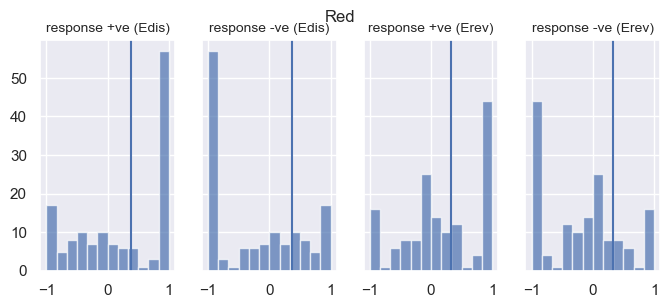

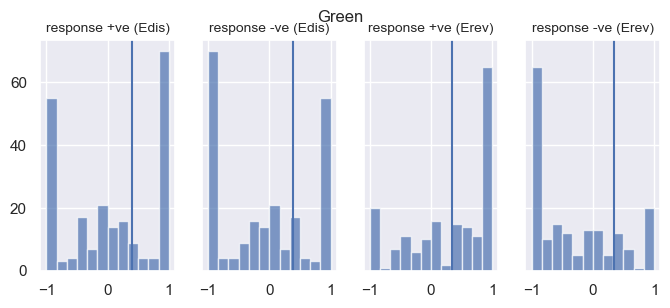

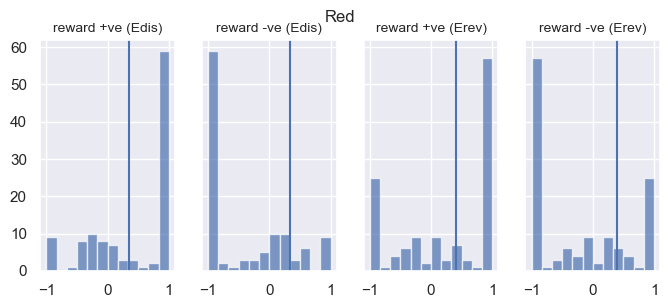

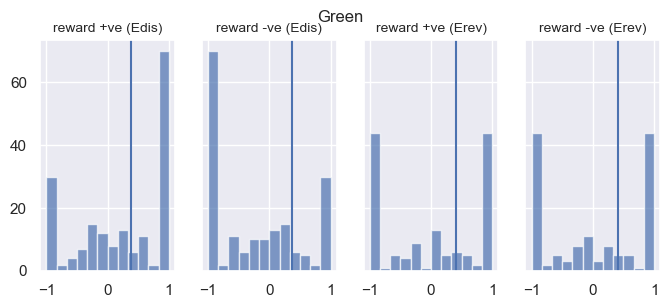

In [23]:
rewarded_types = []
for t in ['rewarded hit','rewarded FA']:
    for prefix in ['Tactile ','Auditory ']:
        rewarded_types.append(prefix+t)

unrewarded_types = []
for t in ['unrewarded hit','unrewarded FA']:
    for prefix in ['Tactile ','Auditory ']:
        unrewarded_types.append(prefix+t)
        
response_types = []
for t in ['unrewarded hit','rewarded hit','unrewarded FA','rewarded FA']:
    for prefix in ['Tactile ','Auditory ']:
        response_types.append(prefix+t)
        
noresponse_types = []
for t in ['unrewarded CR','unrewarded miss']:
    for prefix in ['Tactile ','Auditory ']:
        noresponse_types.append(prefix+t)  
        
sns.set()
modulated_ROIs = {}
for epoch, mod_label, ttypes in zip(['response','reward'], [['responses','no responses'],['rewarded','unrewarded']], [[response_types, noresponse_types],[rewarded_types, unrewarded_types]]):
    modulated_ROIs[epoch] = {}
    epoch_events = pd.concat(cohort_epochs['events'][epoch])
    epoch_deltaF = pd.concat(cohort_epochs['deltaF'][epoch])
    for channel in ['Red','Green']:
        fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(8,3), sharex=False, sharey=True)
        channel_events = epoch_events[epoch_events.Channel == channel]
        channel_deltaF = epoch_deltaF[epoch_deltaF.index.get_level_values('Channel') == channel]
        
        col = 0
        for protocol in ['Edis','Erev']:
            protocol_events = channel_events[channel_events.Protocol == protocol]
            protocol_deltaF = channel_deltaF[channel_deltaF.index.get_level_values('Protocol') == protocol]

            rates = {}
            for target_types, other_types, labels in zip([ttypes[0], ttypes[1]], [ttypes[1], ttypes[0]], ['pos','neg']):
                target_events = protocol_events[(protocol_events['Final Outcome'].isin(target_types))]
                target_ROIs = target_events.groupby([target_events['Unique_ROI'], target_events.index.get_level_values(0)]).size()
                other_events = protocol_events[(protocol_events['Final Outcome'].isin(other_types))]
                other_ROIs = other_events.groupby([other_events['Unique_ROI'], other_events.index.get_level_values(0)]).size()

                target_deltaF = protocol_deltaF[(protocol_deltaF.index.get_level_values('Final Outcome').isin(target_types))]
                target_trials = target_deltaF.groupby([target_deltaF.index.get_level_values('Unique_ROI'), target_deltaF.index.get_level_values(0)]).size()
                other_deltaF = protocol_deltaF[(protocol_deltaF.index.get_level_values('Final Outcome').isin(other_types))]
                other_trials = other_deltaF.groupby([other_deltaF.index.get_level_values('Unique_ROI'), other_deltaF.index.get_level_values(0)]).size()

                target_rate = target_ROIs / target_trials
                other_rate = other_ROIs / other_trials
                
                rates[labels] = pd.concat([target_rate, other_rate], axis=1).fillna(0)
            for mod, mod_df in rates.items():
                suffix = '+ve' if col in [0,2] else '-ve'
                dict_label = mod_label[0] if col in [0,2] else mod_label[1]
                MI_df = ((mod_df[0]-mod_df[1])/(mod_df[0]+mod_df[1])).dropna()

                MI = MI_df.to_numpy()
                median = np.median(MI)
                std = 0.5*(np.std(MI))
                mean = np.mean(MI)
                
                for ID in MI_df.index.get_level_values(1).unique():
                    ID_df = MI_df[MI_df.index.get_level_values(1) == ID]
                    ID_df = ID_df[ID_df > std]

                    if dict_label not in modulated_ROIs[epoch].keys():
                        modulated_ROIs[epoch][dict_label] = {}
                        if ID not in modulated_ROIs[epoch][dict_label].keys():
                            modulated_ROIs[epoch][dict_label][ID] = ID_df.index.get_level_values(0).to_list()
                        else:
                            modulated_ROIs[epoch][dict_label][ID] = modulated_ROIs[epoch][dict_label][ID] + ID_df.index.get_level_values(0).to_list()       
                    else:
                        if ID not in modulated_ROIs[epoch][dict_label].keys():
                            modulated_ROIs[epoch][dict_label][ID] = ID_df.index.get_level_values(0).to_list()
                        else:
                            modulated_ROIs[epoch][dict_label][ID] = modulated_ROIs[epoch][dict_label][ID] + ID_df.index.get_level_values(0).to_list()
                            
                ax[col].hist(MI, bins=12, alpha=0.7)
                ax[col].axvline(std)
                ax[col].set_title(f'{epoch} {suffix} ({protocol})', fontsize=10)
                col += 1
                
        fig.suptitle(f'{channel}', fontsize=12)
        plt.show();

In [24]:
rthresh = -1
event_thresh = 0
time_thresh = 15

## Plot the traces of correlated ROI pairs and save metrics to .npy file, if the plot pdfs already exist in the data directory for the above parameter settings ##
fn.plot_and_extract_correlated_ROIs(cohort_epochs['deltaF']['all'], cohort_epochs['events']['all'], rthresh, event_thresh, time_thresh)

## Upload the correlated ROI pairs metrics .npy file from data directory for the above parameter settings ##
correlated_ROIs = np.load(data_directory+'\\correlated_ROIs_'+str(rthresh)+'rthresh_'+str(time_thresh)+'timethresh_'+str(event_thresh)+'eventthresh.npy', allow_pickle=True).item()
list_of_lists = [list(correlated_ROIs[y].keys()) for y in [x for x in list(correlated_ROIs.keys())]]
correlated_ROI_list = [item for sublist in list_of_lists for item in sublist]

correlated_ROIs_-1rthresh_15timethresh_0eventthresh.npy already exists


In [25]:
pairwise_cutoff = 0
cutoff_on = 'maxes'
nbins = 20
filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)

In [26]:
modulation_trialtypes = {'correct responses':['hit','FA'],
              'incorrect responses':['FA','hit'],
              'unexpected omission':['unrewarded hit','unrewarded FA'],
              'expected omission':['unrewarded FA','unrewarded hit'],
              'expected reward':['rewarded hit','rewarded FA'],
              'unexpected reward':['rewarded FA','rewarded hit'],
              'Go':['Go', 'NoGo'],
              'NoGo':['NoGo', 'Go'],
              'responses':['hit', 'FA'],
              'no responses':['CR','miss'],
              'rewarded':['rewarded', 'unrewarded'],
              'unrewarded':['unrewarded', 'rewarded'],
              'unexpected outcomes':['unrewarded hit','rewarded FA'],
              'expected outcomes':['unrewarded FA','rewarded hit']
             }

boxplot_colors = {'unexpected omission':'magenta',
          'expected omission':'grey',
          'expected reward':'navy',
          'unexpected reward':'lightblue',
          'Hit':'green',
          'correct responses':'green',
          'Miss':'grey',
          'FA':'darkred',
          'incorrect responses':'darkred',
          'CR':'darkorange',
          'expected outcomes': 'grey',
          'unexpected outcomes': 'magenta',
          'Go':'navy',
          'NoGo':'grey',
          'rewarded responses':'blue',
          'unrewarded responses':'darkorange',
          'responses':'darkcyan',
          'no responses':'olive'}

trace_colors = {'unexpected omission':'magenta',
          'expected omission':'grey',
          'expected reward':'navy',
          'unexpected reward':'lightblue',
          'Hit':'green',
          'Miss':'grey',
          'False Alarm':'darkred',
          'Correct Rejections':'darkorange',
          'expected outcomes': 'grey',
          'unexpected outcomes': 'magenta',
          'Go':'navy',
          'NoGo':'grey',
          'rewarded':'blue',
          'unrewarded':'darkorange',
          'responses':'darkcyan',
          'no responses':'olive'}

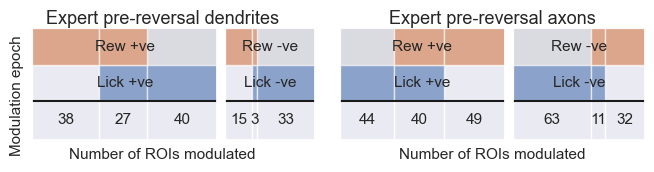

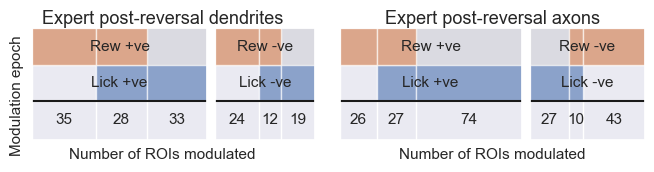

In [26]:
all_ROIs = list(pd.concat(cohort_epochs['deltaF']['all']).index.get_level_values('Unique_ROI').unique())
sns.set()
task_phases = {'Ndis':'Novice pre-reversal',
               'Edis':'Expert pre-reversal',
               'Nrev':'Novice post-reversal',
               'Erev':'Expert post-reversal'}

for protocol in ['Edis','Erev']:
    task_phase = task_phases[protocol]
    fig = plt.figure(constrained_layout=True, figsize=(6.43, 1.42))
    (subfig_l, subfig_r) = fig.subfigures(nrows=1, ncols=2, wspace=0.05)
    for subfig_col, (channel) in enumerate(['Red','Green']):
        ROI_label = 'dendrites' if channel == 'Red' else 'axons'
        pos_sets = []
        neg_sets = []
        pos_labels = []
        neg_labels = []
        for epoch, epoch_dict in modulated_ROIs.items():
            for n, (ROI_type, type_dict) in enumerate(epoch_dict.items()):
                prefix = 'Rew' if epoch in ['reward','ITI'] else 'Lick'
                if [epoch, ROI_type] in [['response','responses'],
                                          ['reward','rewarded']
                                         ]:
                    psets = set([item for sublist in [type_dict[x] for x in type_dict.keys()]  for item in sublist if (channel in item) & (protocol in item)])
                    pos_sets.append(psets)
                    pos_labels.append(prefix+' +ve')
                if [epoch, ROI_type] in [['response','no responses'],
                                          ['reward','unrewarded']
                                         ]:
                    sets = set([item for sublist in [type_dict[x] for x in type_dict.keys()]  for item in sublist if (channel in item) & (protocol in item)])
                    neg_sets.append(sets)
                    neg_labels.append(prefix+' -ve')
        new_neg_sets = []
        for i, (subset) in enumerate(neg_sets):
            neg_subsets = []
            for roi in subset:
                if roi not in pos_sets[i]:
                    neg_subsets.append(roi)
            new_neg_sets.append(set(neg_subsets))
        protocol_channel_ROIs = [x for x in all_ROIs if (protocol in x) & (channel in x)]
        
        all_sets = [set(protocol_channel_ROIs), set(protocol_channel_ROIs)]
        
        neutral_sets = []
        for i, subset in enumerate(all_sets):
            neutral_subset = []
            for roi in subset:
                if (roi not in pos_sets[i]) & (roi not in new_neg_sets[i]):
                    neutral_subset.append(roi)
            neutral_sets.append(set(neutral_subset))
            
        unique_ROIs_pos = len(set([item for sublist in pos_sets for item in sublist]))
        unique_ROIs_neg = len(set([item for sublist in new_neg_sets for item in sublist]))
        unique_ROIs_neutral = len(set([item for sublist in neutral_sets for item in sublist]))
        pos_ratio = unique_ROIs_pos / (unique_ROIs_pos + unique_ROIs_neg)
        neg_ratio = unique_ROIs_neg / (unique_ROIs_pos + unique_ROIs_neg)
        neutral_ratio = 0.05
        
        if subfig_col == 0:
            subplots = subfig_l.subplots(nrows=1, ncols=2, sharey=True, 
                               gridspec_kw={'width_ratios':[pos_ratio,neg_ratio],
                                            'wspace':0.001})
            subfig_l.suptitle(f'{task_phase} {ROI_label}', fontsize=13, y=1.1)
            subfig_l.supxlabel('Number of ROIs modulated', fontsize=11)
            subfig_l.supylabel('Modulation epoch', fontsize=11)
        else:
            subplots = subfig_r.subplots(nrows=1, ncols=2, sharey=True, 
                               gridspec_kw={'width_ratios':[pos_ratio,neg_ratio],
                                            'wspace':0.001})
            subfig_r.suptitle(f'{task_phase} {ROI_label}', fontsize=13, y=1.1)
            subfig_r.supxlabel('Number of ROIs modulated', fontsize=11)
            
        for col, (title, sets, label) in enumerate(zip(['+ve','-ve'],[pos_sets, new_neg_sets],[pos_labels, neg_labels])):
            supervenn(sets, label, side_plots=False, ax=subplots[col], fontsize=11)#, sets_ordering='minimize gaps')
#             subplots[col].set_title(f'{title}', fontsize=11)
            subplots[col].set_ylabel('')
            subplots[col].set_xlabel('')
    fig.savefig(f'{data_directory}\\{protocol}_ROI_modulation_venn.svg', bbox_inches='tight', pad_inches=0)
#         subplots[0].set_ylabel('Modulation epoch', fontsize=15)
plt.show()

**For comparisons dict:**
1. ***epoch***: the epoch where the modulation is occurring
2. ***modulation*** what type of modulation (e.g. rewarded, unrewarded, etc... refer to innerkeys of modulated_ROIs)
3. ***t1*** 

In [220]:
comparisons = [{'epoch':'reward', 'modulation':['rewarded'], 't1':'unexpected reward', 't2':'expected reward'}]
cohort_deltaF = pd.concat(cohort_epochs['deltaF']['all'])
cohort_deltaF = fn.reverse_outcome_indexes(cohort_deltaF, 'deltaF', reversed_sessions)

# specific_IDs = ['RGECO_GCamP_Batch1_four','RGECO_GCamP_Batch1_muji','RGECO_GCamP_Batch3_muji','RGECO_GCamP_Batch3_one']
# cohort_deltaF = cohort_deltaF[cohort_deltaF.index.get_level_values(0).isin(specific_IDs)]
metric = 'peak'
channels = ['Red','Green']
modulation_protocols = ['Edis','Erev']
reverse = False
active_ROIs = False
ttest = 'non-parametric'
figsize = (1.9897*3, 2.1987*3)
remove_labels = False
analysis_epoch = 'reward'
modulation_name = 'all'#
ylim = [0,3]

metrics_modulated = generate_metrics_modulated(comparisons, cohort_deltaF, metric, channels, modulation_protocols, analysis_epoch, active_ROIs, reverse, False)
sns.reset_defaults()
fig = plot_box_plots(metrics_modulated, analysis_epoch, ttest, figsize, ylim, metric, remove_labels)
# fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                   modulation_name,
#                                                   ('_vs_').join(list(trialtypes.keys())),
#                                                   ('_').join(modulation_protocols),
#                                                   ttest),
#             bbox_inches=0, pad_inches=0)
plt.show()

ValueError: max() arg is an empty sequence

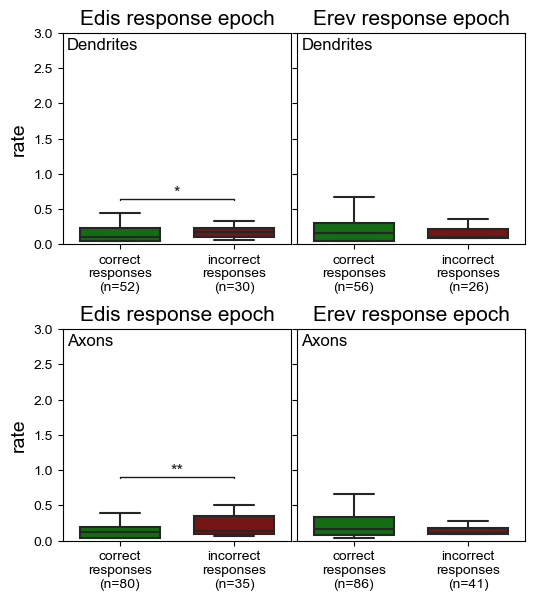

In [789]:
comparisons = [{'epoch':'response', 'modulation':['responses'], 't1':'correct responses', 't2':'incorrect responses'}]
cohort_deltaF = pd.concat(cohort_epochs['deltaF']['all'])
cohort_deltaF = fn.reverse_outcome_indexes(cohort_deltaF, 'deltaF', reversed_sessions)

# specific_IDs = ['RGECO_GCamP_Batch1_four','RGECO_GCamP_Batch1_muji','RGECO_GCamP_Batch3_muji','RGECO_GCamP_Batch3_one']
# cohort_deltaF = cohort_deltaF[cohort_deltaF.index.get_level_values(0).isin(specific_IDs)]
metric = 'rate'
channels = ['Red','Green']
modulation_protocols = ['Edis','Erev']
reverse = False
active_ROIs = False
ttest = 'non-parametric'
figsize = (1.9897*3, 2.1987*3)
remove_labels = False
analysis_epoch = 'response'
modulation_name = 'lick_positive'#
ylim = [0,3]

metrics_modulated = generate_metrics_modulated(comparisons, cohort_deltaF, metric, channels, modulation_protocols, analysis_epoch, active_ROIs, reverse, False)
sns.reset_defaults()
fig = plot_box_plots(metrics_modulated, analysis_epoch, ttest, figsize, ylim, metric, remove_labels)
# fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                   modulation_name,
#                                                   ('_vs_').join(list(trialtypes.keys())),
#                                                   ('_').join(modulation_protocols),
#                                                   ttest),
#             bbox_inches=0, pad_inches=0)
plt.show()

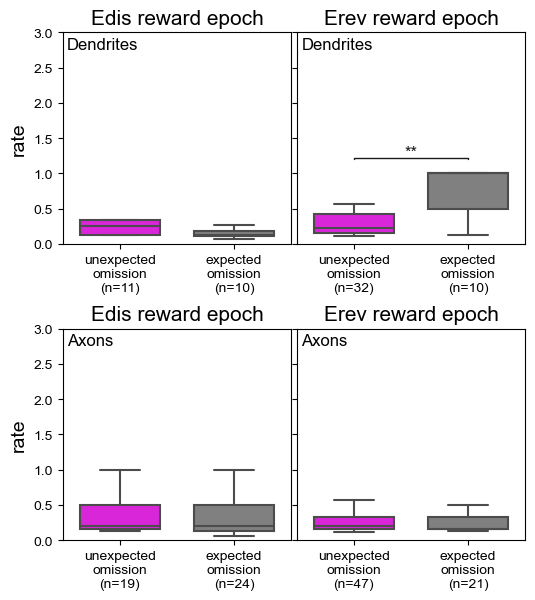

In [790]:
comparisons = [{'epoch':'reward', 'modulation':['unrewarded'], 't1':'unexpected omission', 't2':'expected omission'}]
cohort_deltaF = pd.concat(cohort_epochs['deltaF']['all'])
cohort_deltaF = fn.reverse_outcome_indexes(cohort_deltaF, 'deltaF', reversed_sessions)

# specific_IDs = ['RGECO_GCamP_Batch1_four','RGECO_GCamP_Batch1_muji','RGECO_GCamP_Batch3_muji','RGECO_GCamP_Batch3_one']
# cohort_deltaF = cohort_deltaF[cohort_deltaF.index.get_level_values(0).isin(specific_IDs)]
metric = 'rate'
channels = ['Red','Green']
modulation_protocols = ['Edis','Erev']
reverse = False
active_ROIs = False
ttest = 'non-parametric'
figsize = (1.9897*3, 2.1987*3)
remove_labels = False
analysis_epoch = 'reward'
modulation_name = 'rew_negative_neutral'#
ylim = [0,3]

metrics_modulated = generate_metrics_modulated(comparisons, cohort_deltaF, metric, channels, modulation_protocols, analysis_epoch, active_ROIs, reverse, False)
sns.reset_defaults()
fig = plot_box_plots(metrics_modulated, analysis_epoch, ttest, figsize, ylim, metric, remove_labels)
# fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                   modulation_name,
#                                                   ('_vs_').join(list(trialtypes.keys())),
#                                                   ('_').join(modulation_protocols),
#                                                   ttest),
#             bbox_inches=0, pad_inches=0)
plt.show()

In [25]:
sns.set()
task_phases = {'Ndis':'Novice pre-reversal',
               'Edis':'Expert pre-reversal',
               'Nrev':'Novice post-reversal',
               'Erev':'Expert post-reversal'}

for protocol in ['Edis','Erev']:
    task_phase = task_phases[protocol]
    fig = plt.figure(constrained_layout=True, figsize=(6.34*1.25, 9.69/4*1.25))
    (subfig_l, subfig_r) = fig.subfigures(nrows=1, ncols=2, wspace=0.05)
    for subfig_col, (channel) in enumerate(['Red','Green']):
        ROI_label = 'dendrites' if channel == 'Red' else 'axons'
        pos_sets = []
        neg_sets = []
        pos_labels = []
        neg_labels = []
        for epoch, epoch_dict in modulated_ROIs.items():
            for ROI_type, type_dict in epoch_dict.items():
                if [epoch, ROI_type] in [['response','correct responses'],
                                         #['stimulus','correct responses'],
                                         ['reward','expected reward']#,
                                         #['ITI','expected reward']
                                         ]:
                    sets = set([item for sublist in [type_dict[x] for x in type_dict.keys()]  for item in sublist if (channel in item) & (protocol in item)])
                    pos_sets.append(sets)
                    pos_labels.append(epoch)
                if [epoch, ROI_type] in [['response','incorrect responses'],
                                         #['stimulus','incorrect responses'],    
                                         ['reward','unexpected reward']#,
                                         #['ITI','unexpected reward']
                                         ]:
                    sets = set([item for sublist in [type_dict[x] for x in type_dict.keys()]  for item in sublist if (channel in item) & (protocol in item)])
                    neg_sets.append(sets)
                    neg_labels.append(epoch)  
        unique_ROIs_pos = len(set([item for sublist in pos_sets for item in sublist]))
        unique_ROIs_neg = len(set([item for sublist in neg_sets for item in sublist]))
        pos_ratio = unique_ROIs_pos / (unique_ROIs_pos + unique_ROIs_neg)
        neg_ratio = unique_ROIs_neg / (unique_ROIs_pos + unique_ROIs_neg)
        
        if subfig_col == 0:
            subplots = subfig_l.subplots(nrows=1, ncols=2, sharey=True, 
                               gridspec_kw={'width_ratios':[pos_ratio,neg_ratio],
                                            'wspace':0.025})
            subfig_l.suptitle(f'{task_phase} {ROI_label}', fontsize=15, y=1.1)
            subfig_l.supxlabel('Number of ROIs modulated')
        else:
            subplots = subfig_r.subplots(nrows=1, ncols=2, sharey=True, 
                               gridspec_kw={'width_ratios':[pos_ratio,neg_ratio],
                                            'wspace':0.025})
            subfig_r.suptitle(f'{task_phase} {ROI_label}', fontsize=15, y=1.1)
            subfig_r.supxlabel('Number of ROIs modulated')
            
        for col, (title, sets, labels) in enumerate(zip(['Hit','False Alarm'],[pos_sets, neg_sets],[pos_labels, neg_labels])):
            supervenn(sets, labels, side_plots=False, ax=subplots[col])#, sets_ordering='minimize gaps')
            subplots[col].set_title(f'{title} trials')
            subplots[col].set_ylabel('')
            subplots[col].set_xlabel('')
        subplots[0].set_ylabel('Modulation epoch', fontsize=15)
    plt.show()

ZeroDivisionError: division by zero

In [ ]:
## Set plotting colors here ##

In [ ]:
plottype = 'single'
specific_ROIs = []
sns.reset_defaults()

<Figure size 792.5x302.812 with 0 Axes>

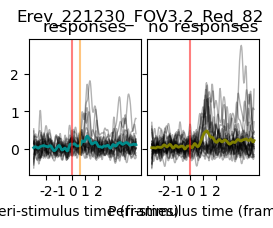

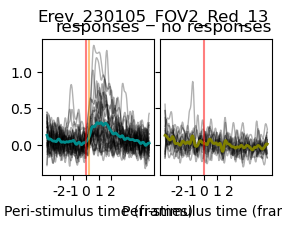

In [25]:
modulation_epoch = 'response'
channels = ['Red']
protocols = ['Erev']
modulation_types = ['responses','no responses']
trialtypes = {'responses':['rewarded hit','unrewarded hit','unrewarded FA','rewarded FA'],
              'no responses':['unrewarded miss','unrewarded CR']#,
              #'Hit':['rewarded hit','unrewarded hit'],
              #'False Alarm':['rewarded FA','unrewarded FA']
             }
plotting_epoch = 'stimulus'
pre_window = 91
post_window = 151
save_ROIs = []
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
specific_ROIs = ['Erev_221230_FOV3.2_Red_82','Erev_230105_FOV2_Red_13']
# save_ROIs = specific_ROIs
figsize = (6.34/1.5*0.7038,2.5*0.7038)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, trace_colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, figsize, save_ROIs)
plt.show()

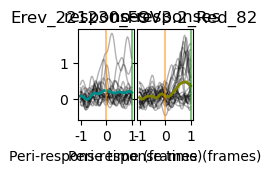

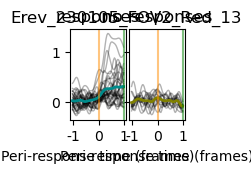

In [26]:
modulation_epoch = 'response'
channels = ['Red']
protocols = ['Erev']
modulation_types = ['responses','no responses']
trialtypes = {'responses':['rewarded hit','unrewarded hit','unrewarded FA','rewarded FA'],
              'no responses':['unrewarded miss','unrewarded CR']#,
              #'Hit':['rewarded hit','unrewarded hit'],
              #'False Alarm':['rewarded FA','unrewarded FA']
             }
plotting_epoch = 'response'
pre_window = 31
post_window = 31
save_ROIs = []
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
specific_ROIs = ['Erev_221230_FOV3.2_Red_82','Erev_230105_FOV2_Red_13']
# save_ROIs = specific_ROIs
figsize = (6.34/1.5/2*0.7038,2.5/1.5*0.7038)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, trace_colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, figsize, save_ROIs)
plt.show()

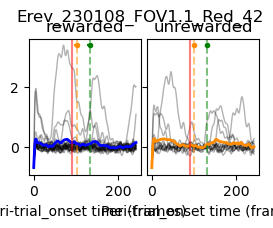

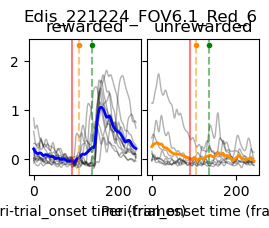

In [27]:
modulation_epoch = 'reward'
channels = ['Red']
protocols = ['Erev','Edis']
modulation_types = ['rewarded','unrewarded']
trialtypes = {'rewarded':['rewarded hit','rewarded FA'],
              'unrewarded':['unrewarded hit','unrewarded FA']#,
              #'Hit':['rewarded hit','unrewarded hit'],
              #'False Alarm':['rewarded FA','unrewarded FA']
             }
plotting_epoch = 'trial_onset'
pre_window = 0
post_window = 243
save_ROIs = []
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
specific_ROIs = ['Edis_221224_FOV6.1_Red_6','Erev_230108_FOV1.1_Red_42']
# save_ROIs = specific_ROIs
figsize = (6.34/1.5*0.7038,2.5*0.7038)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, trace_colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, figsize, save_ROIs)
plt.show()

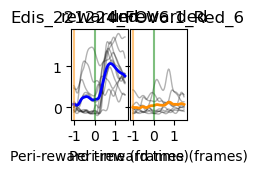

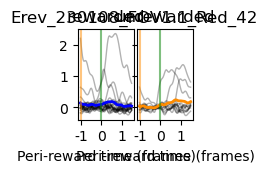

In [28]:
modulation_epoch = 'reward'
channels = ['Red']
protocols = ['Edis','Erev']
modulation_types = ['rewarded','unrewarded']
trialtypes = {'rewarded':['rewarded hit','rewarded FA'],
              'unrewarded':['unrewarded hit','unrewarded FA']#,
              #'Hit':['rewarded hit','unrewarded hit'],
              #'False Alarm':['rewarded FA','unrewarded FA']
             }
plotting_epoch = 'reward'
pre_window = 31
post_window = 46
save_ROIs = []
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
specific_ROIs = ['Edis_221224_FOV6.1_Red_6','Erev_230108_FOV1.1_Red_42']
# save_ROIs = specific_ROIs
figsize = (6.34/1.5/2*0.7038,2.5/1.5*0.7038)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, trace_colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, figsize, save_ROIs)
plt.show()

<Figure size 640x480 with 0 Axes>

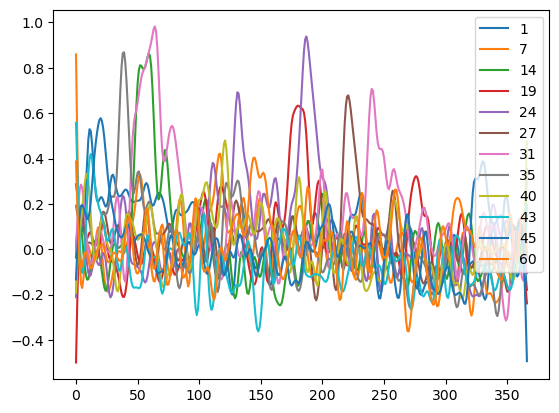

In [29]:
test = pd.concat(cohort_epochs['deltaF']['all'])
example = test[test.index.get_level_values('Unique_ROI') == 'Erev_230105_FOV2_Red_12']
df = example[example.index.get_level_values('Final Outcome').str.contains('FA')]
df = df[df.index.get_level_values('Trial') != 28]
legends = list(df.index.get_level_values('Trial'))
plt.figure()
df.T.plot(legend=False)
plt.legend(legends)
plt.show()
to_change = cohort_epochs['deltaF']['all']['RGECO_GCamP_Batch3_muji']
cohort_epochs['deltaF']['all']['RGECO_GCamP_Batch3_muji'] = to_change[~((to_change.index.get_level_values('Unique_ROI') == 'Erev_230105_FOV2_Red_12') &
     (to_change.index.get_level_values('Trial') == 28))]

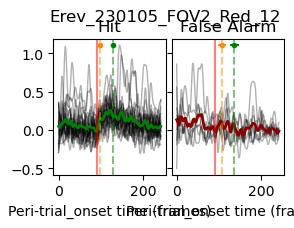

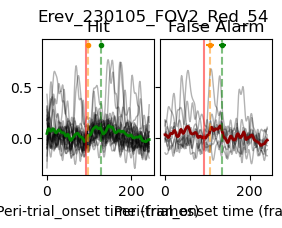

In [30]:
modulation_epoch = 'response'
channels = ['Red']
protocols = ['Erev','Edis']
modulation_types = ['FA']
trialtypes = {#'rewarded':['rewarded hit','rewarded FA'],
              #'unrewarded':['unrewarded hit','unrewarded FA']#,
              'Hit':['rewarded hit','unrewarded hit'],
              'False Alarm':['rewarded FA','unrewarded FA']
             }
plotting_epoch = 'trial_onset'
pre_window = 0
post_window = 243
save_ROIs = []
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
specific_ROIs = ['Erev_230105_FOV2_Red_12','Erev_230105_FOV2_Red_54']#'Erev_230105_FOV2_Red_3','Erev_230105_FOV2_Red_11','Erev_230105_FOV2_Red_16','Erev_230105_FOV2_Red_50',
                 #'Erev_230108_FOV1.1_Red_138','Erev_221104_FOV3.1_Red_328','Edis_230104_FOV1.1_Red_62','Erev_230105_FOV2_Red_54','Erev_230108_FOV1.1_Red_157',
                 #'Edis_221104_FOV3.1_Red_71', 'Edis_221104_FOV3.1_Red_86']
# save_ROIs = specific_ROIs
figsize = (6.34/1.5*0.7038,2.5*0.7038)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, trace_colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, figsize, save_ROIs)
plt.show()

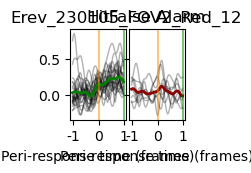

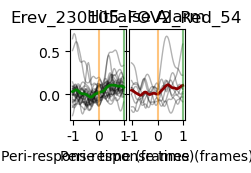

In [31]:
modulation_epoch = 'response'
channels = ['Red']
protocols = ['Erev']
modulation_types = ['responses']
trialtypes = {#'responses':['rewarded hit','unrewarded hit','unrewarded FA','rewarded FA'],
              #'no responses':['unrewarded miss','unrewarded CR']#,
              'Hit':['rewarded hit','unrewarded hit'],
              'False Alarm':['rewarded FA','unrewarded FA']
             }
plotting_epoch = 'response'
pre_window = 31
post_window = 31
save_ROIs = []
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
specific_ROIs = ['Erev_230105_FOV2_Red_12','Erev_230105_FOV2_Red_54']#'Erev_230105_FOV2_Red_3','Erev_230105_FOV2_Red_11','Erev_230105_FOV2_Red_16','Erev_230105_FOV2_Red_50',
                 #'Erev_230108_FOV1.1_Red_138','Erev_221104_FOV3.1_Red_328','Edis_230104_FOV1.1_Red_62','Erev_230105_FOV2_Red_54','Erev_230108_FOV1.1_Red_157',
                 #'Edis_221104_FOV3.1_Red_71', 'Edis_221104_FOV3.1_Red_86']
# save_ROIs = specific_ROIs
figsize = (6.34/1.5/2*0.7038,2.5/1.5*0.7038)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, trace_colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, figsize, save_ROIs)
plt.show()

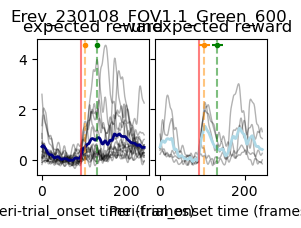

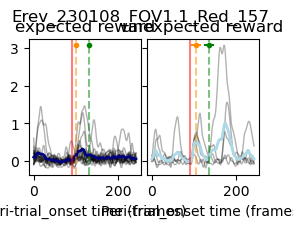

In [32]:
modulation_epoch = 'reward'
channels = ['Green','Red']
protocols = ['Erev','Edis']
modulation_types = ['rewarded']
trialtypes = {#'rewarded':['rewarded hit','rewarded FA'],
              #'unrewarded':['unrewarded hit','unrewarded FA']#,
              'expected reward':['rewarded hit','rewarded hit'],
              'unexpected reward':['rewarded FA','rewarded FA']
             }
plotting_epoch = 'trial_onset'
pre_window = 0
post_window = 243
save_ROIs = []
# specific_ROIs = []
# for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
#     if ROI_type in modulation_types:
#         for ID, ID_list in type_dict.items():
#             for ROI in ID_list:
#                 specific_ROIs.append(ROI)
specific_ROIs = ['Erev_230108_FOV1.1_Red_157','Erev_230108_FOV1.1_Green_600',]
# save_ROIs = specific_ROIs
figsize = (6.34/1.5*0.7038,2.5*0.7038)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, trace_colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, figsize, save_ROIs)
plt.show()

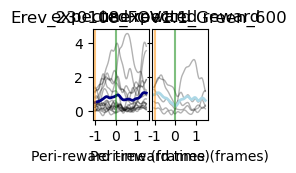

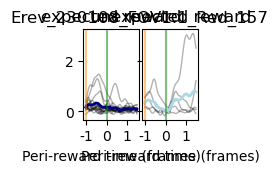

In [33]:
modulation_epoch = 'reward'
channels = ['Green','Red']
protocols = ['Erev','Edis']
modulation_types = ['rewarded']
trialtypes = {#'rewarded':['rewarded hit','rewarded FA'],
              #'unrewarded':['unrewarded hit','unrewarded FA']#,
              'expected reward':['rewarded hit','rewarded hit'],
              'unexpected reward':['rewarded FA','rewarded FA']
             }
plotting_epoch = 'reward'
pre_window = 31
post_window = 46
save_ROIs = []
specific_ROIs = []
# for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
#     if ROI_type in modulation_types:
#         for ID, ID_list in type_dict.items():
#             for ROI in ID_list:
#                 specific_ROIs.append(ROI)
specific_ROIs = ['Erev_230108_FOV1.1_Red_157','Erev_230108_FOV1.1_Green_600',]
# 'Erev_230108_FOV1.1_Green_574','Erev_230108_FOV1.1_Green_775',]
#                  'Erev_230108_FOV1.1_Green_833',
#                  'Edis_230104_FOV1.1_Red_82','Edis_230104_FOV1.1_Red_144','Erev_230108_FOV1.1_Green_796',
#                  'Erev_230108_FOV1.1_Red_126','Edis_230104_FOV1.1_Red_175','Edis_230104_FOV1.1_Red_202','Erev_230104_FOV1.1_Red_38',
#                  'Edis_230104_FOV1.1_Green_153',
#                  'Erev_230108_FOV1.1_Green_503','Erev_230108_FOV1.1_Green_237',]
# save_ROIs = specific_ROIs
figsize = (6.34/1.5/2*0.7038,2.5/1.5*0.7038)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, trace_colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, figsize, save_ROIs)
plt.show()

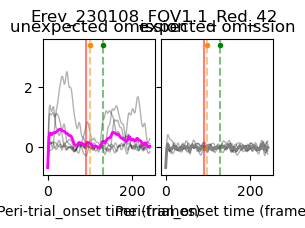

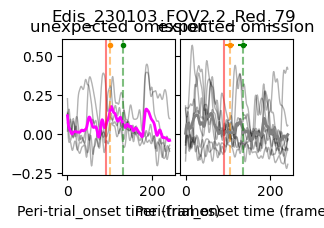

In [34]:
sns.reset_defaults()
modulation_epoch = 'post_reward'
channels = ['Green','Red']
protocols = ['Erev','Edis']
modulation_types = ['unrewarded']
trialtypes = {#'rewarded':['rewarded hit','rewarded FA'],
              #'unrewarded':['unrewarded hit','unrewarded FA']#,
              'unexpected omission':['unrewarded hit','unrewarded hit'],
              'expected omission':['unrewarded FA','unrewarded FA'],

             }
plotting_epoch = 'trial_onset'
pre_window = 0
post_window = 243
# save_ROIs = []
# specific_ROIs = []
# for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
#     if ROI_type in modulation_types:
#         for ID, ID_list in type_dict.items():
#             for ROI in ID_list:
#                 specific_ROIs.append(ROI)
specific_ROIs = ['Erev_230108_FOV1.1_Red_42','Edis_230103_FOV2.2_Red_79',#'Erev_230108_FOV1.1_Green_343','Erev_230108_FOV1.1_Red_89','Edis_230103_FOV2.2_Green_11','Edis_230103_FOV2.2_Green_23',
                 #'Erev_230103_FOV2.2_Red_14','Edis_230103_FOV2.3_Red_24','Edis_230103_FOV2.2_Red_32','Edis_230103_FOV2.2_Red_38',
                ]
save_ROIs = specific_ROIs
figsize = (6.34/1.5*0.7038,2.5*0.7038)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, trace_colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, figsize, save_ROIs)
plt.show()

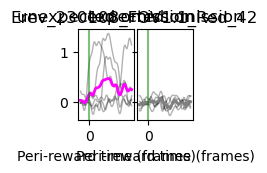

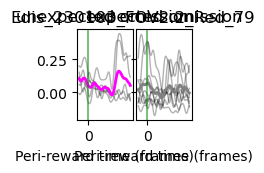

In [35]:
modulation_epoch = 'post_reward'
channels = ['Green','Red']
protocols = ['Erev','Edis']
modulation_types = ['unrewarded','unexpected omission']
trialtypes = {#'rewarded':['rewarded hit','rewarded FA'],
              #'unrewarded':['unrewarded hit','unrewarded FA']#,
              'unexpected omission':['unrewarded hit','unrewarded hit'],
              'expected omission':['unrewarded FA','unrewarded FA'],
             }
plotting_epoch = 'reward'
pre_window = 16
post_window = 76
save_ROIs = []
# specific_ROIs = []
# for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
#     if ROI_type in modulation_types:
#         for ID, ID_list in type_dict.items():
#             for ROI in ID_list:
#                 specific_ROIs.append(ROI)
specific_ROIs = ['Erev_230108_FOV1.1_Red_42','Edis_230103_FOV2.2_Red_79',#'Erev_230108_FOV1.1_Green_343','Erev_230108_FOV1.1_Red_89','Edis_230103_FOV2.2_Green_11','Edis_230103_FOV2.2_Green_23',
                 #'Erev_230103_FOV2.2_Red_14','Edis_230103_FOV2.3_Red_24','Edis_230103_FOV2.2_Red_32','Edis_230103_FOV2.2_Red_38',
                ]
save_ROIs = specific_ROIs
figsize = (6.34/1.5/2*0.7038,2.5/1.5*0.7038)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, trace_colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, figsize, save_ROIs)
plt.show()

## Go stimulus axons post-reversal ##

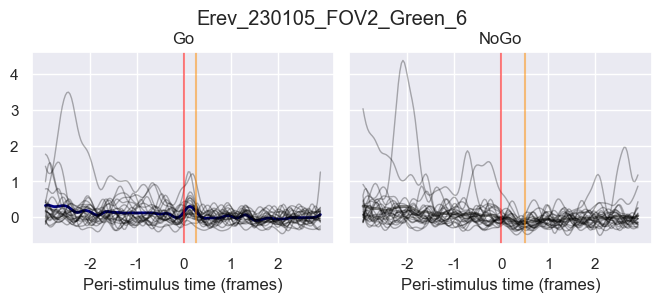

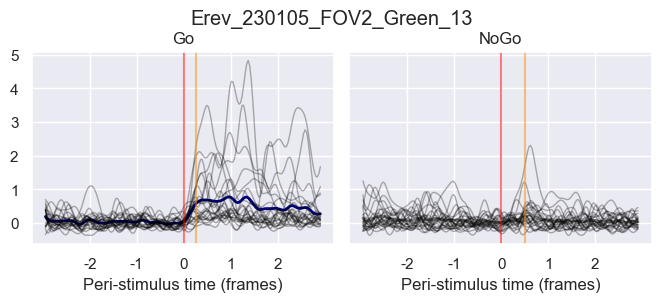

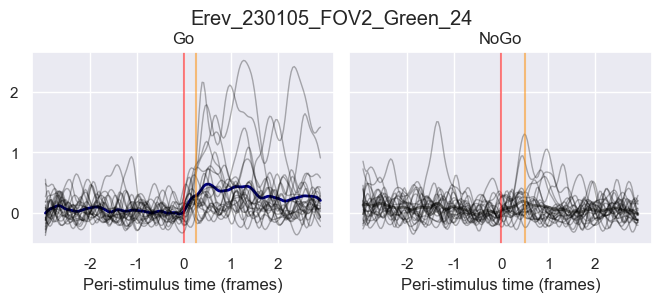

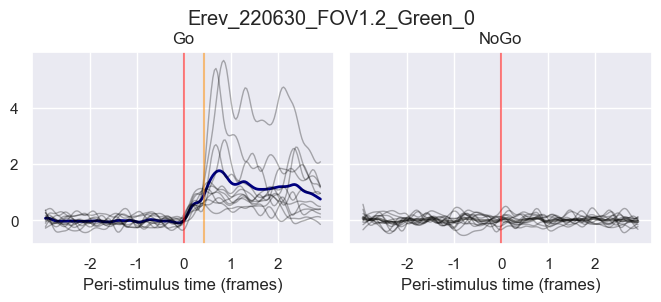

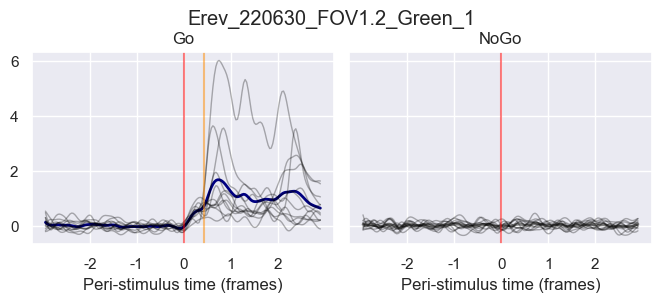

...

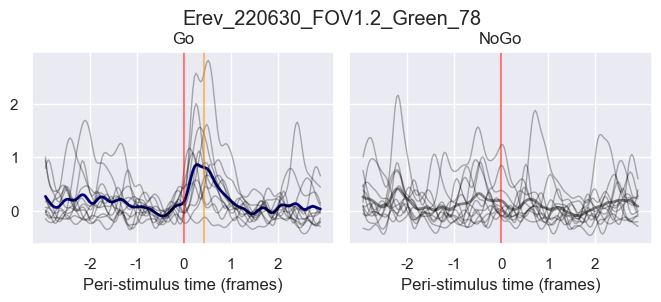

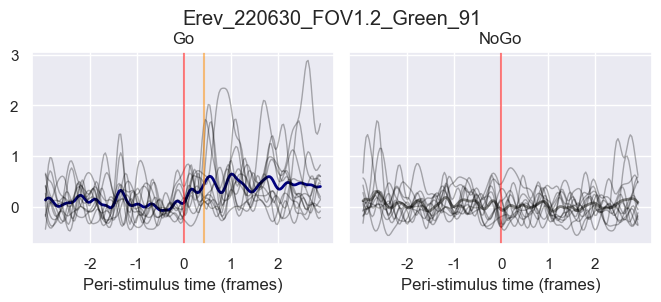

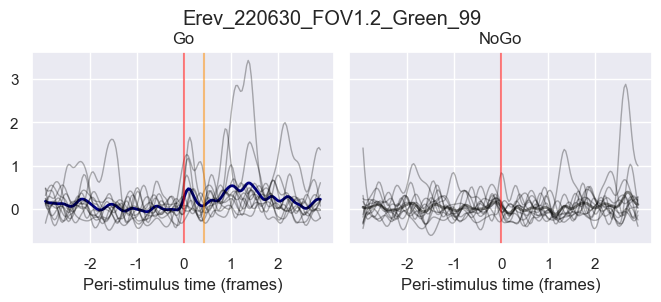

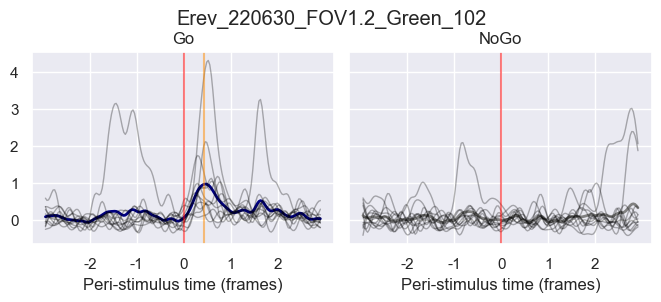

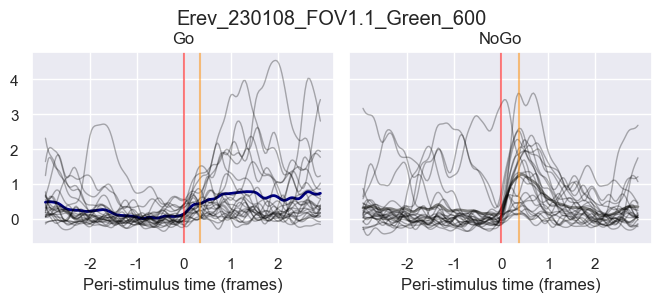

In [189]:
modulation_epoch = 'stimulus'
channels = ['Green']
protocols = ['Erev']
modulation_types = ['NoGo','Go']
trialtypes = {'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']}
plotting_epoch = 'stimulus'
pre_window = 90
post_window = 90
save_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, save_ROIs)
plt.show()

## Response-error dendrites pre-reversal ##

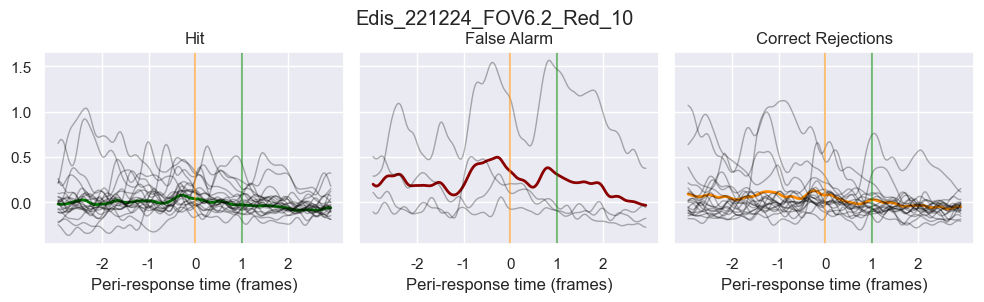

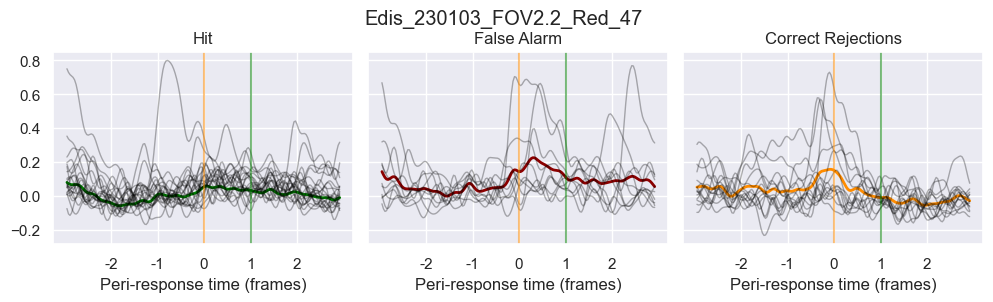

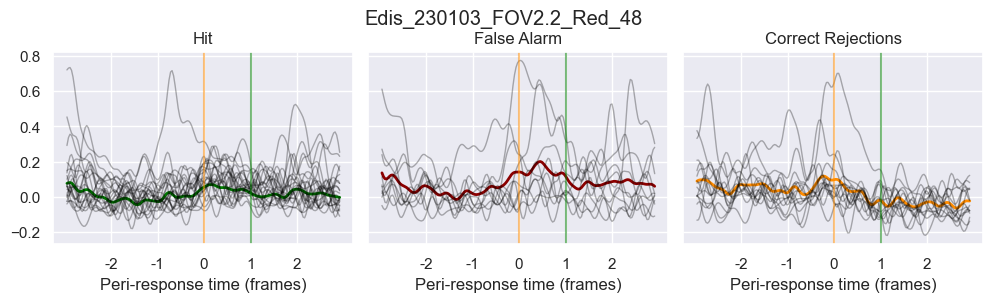

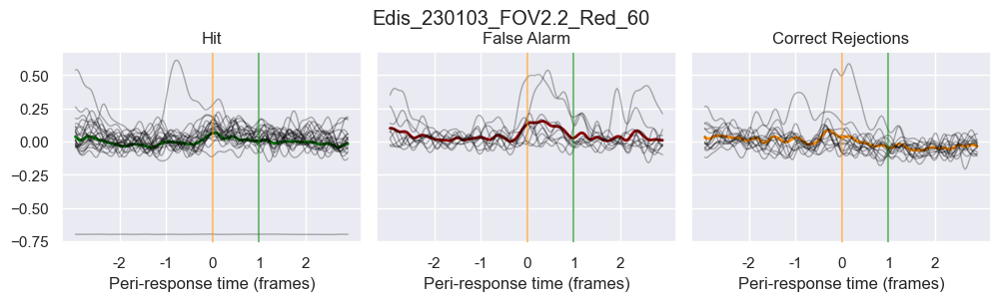

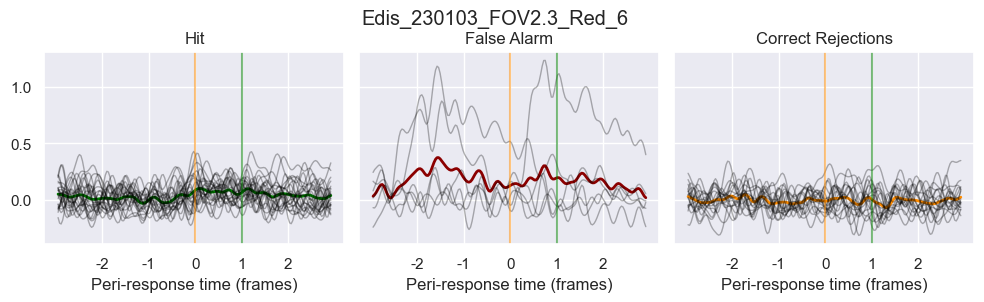

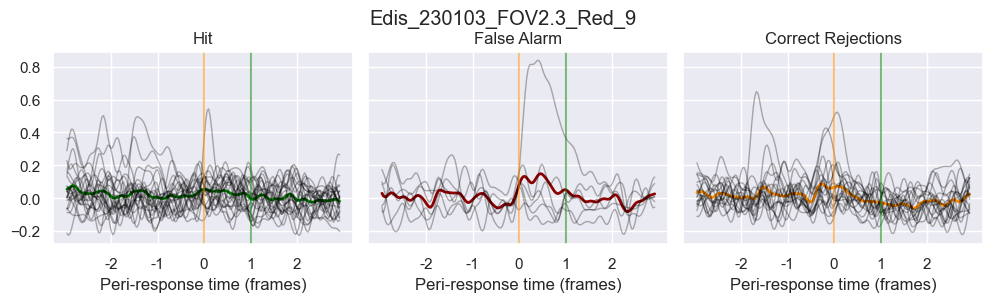

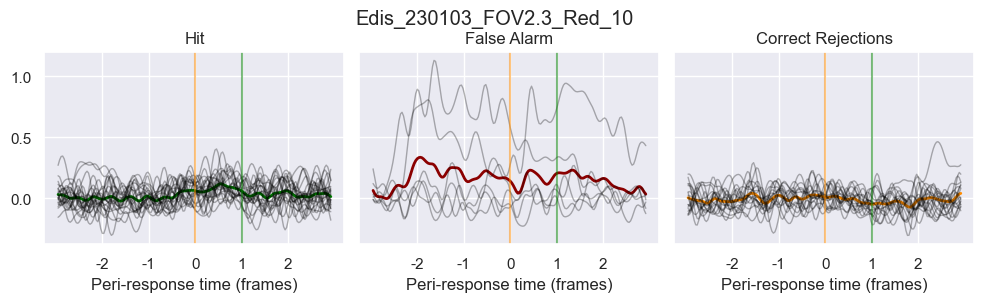

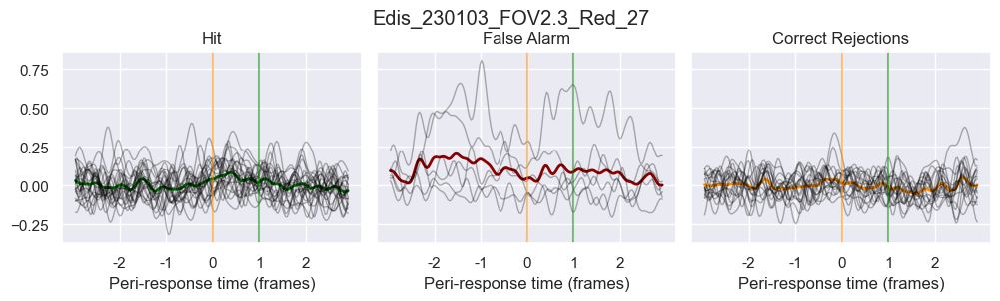

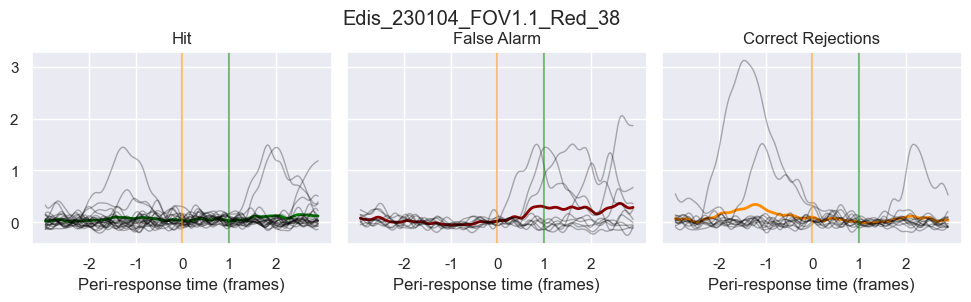

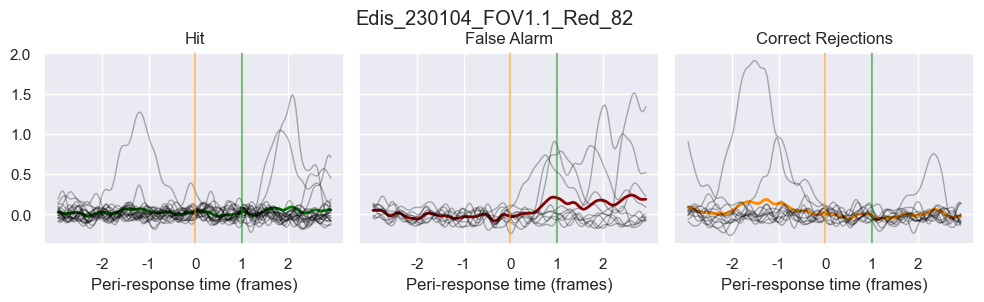

In [20]:
modulation_epoch = 'response'
channels = ['Red']
protocols = ['Edis']
modulation_types = ['incorrect responses']
trialtypes = {'Hit':['rewarded hit','unrewarded hit'],
              'False Alarm':['rewarded FA','unrewarded FA'],
              'Correct Rejections':['unrewarded CR', 'unrewarded CR']}
plotting_epoch = 'response'
pre_window = 90
post_window = 90
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, save_ROIs)
plt.show()

## Reward-anticipating dendrites post-reversal ##

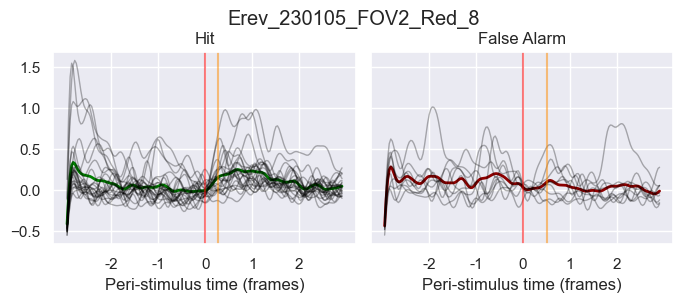

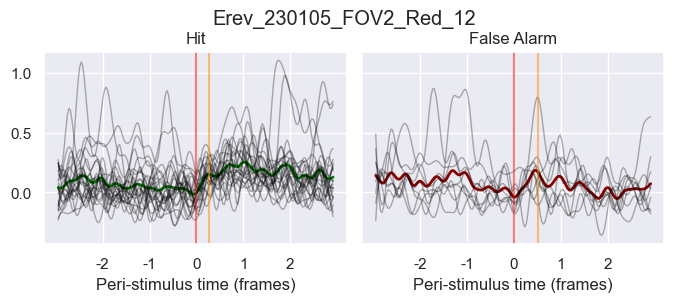

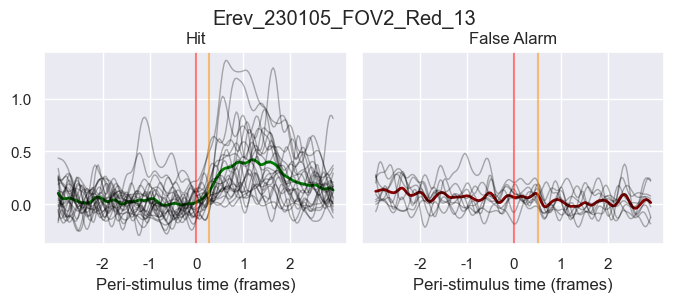

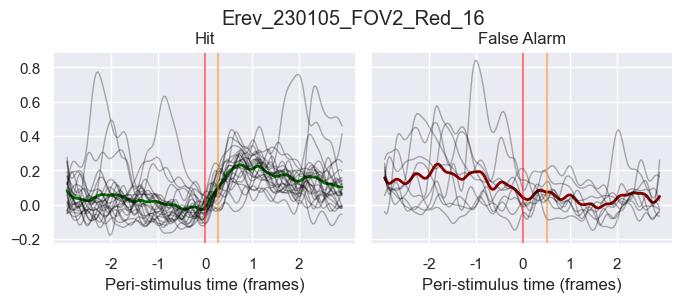

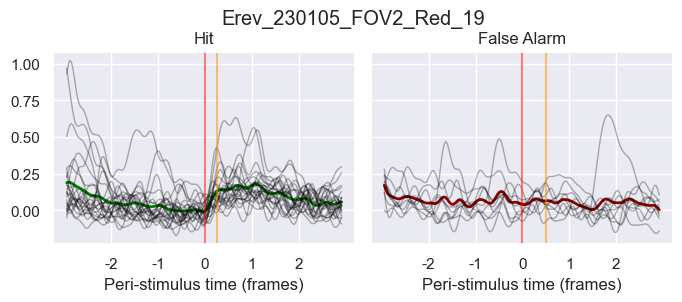

...

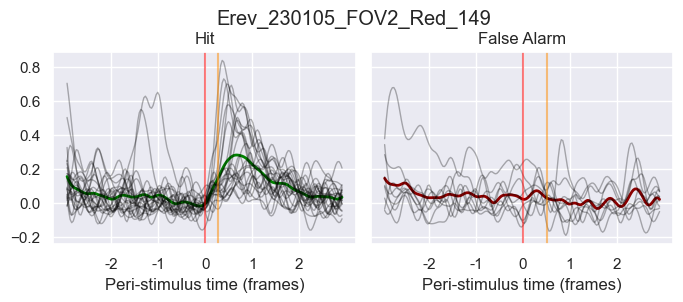

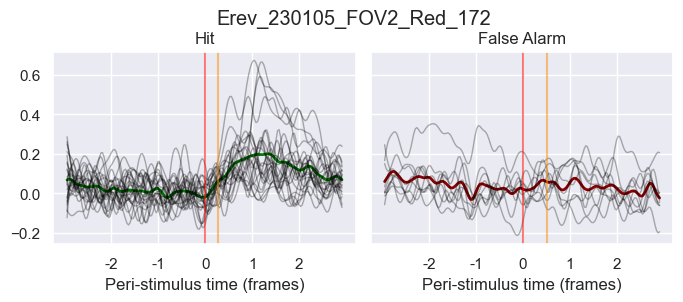

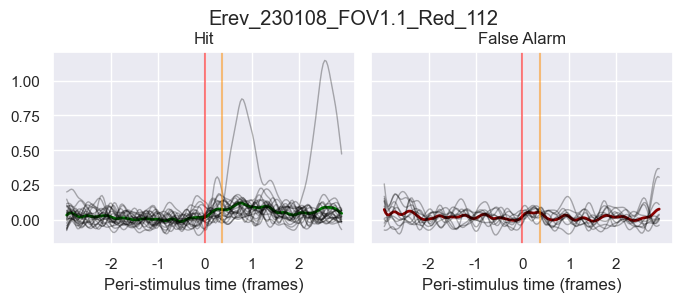

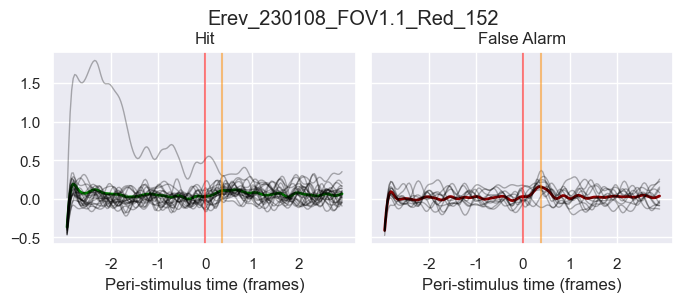

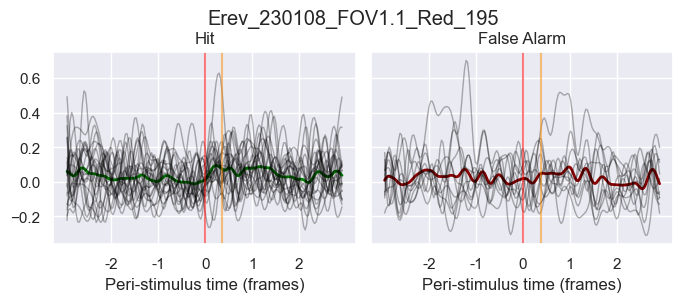

In [21]:
modulation_epoch = 'response'
channels = ['Red']
protocols = ['Erev']
modulation_types = ['correct responses']
trialtypes = {'Hit':['rewarded hit','unrewarded hit'],
              'False Alarm':['rewarded FA','unrewarded FA']}
plotting_epoch = 'stimulus'
pre_window = 90
post_window = 90
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, save_ROIs)
plt.show()

## ITI onset unexpected reward-encoding axons pre-reversal ##

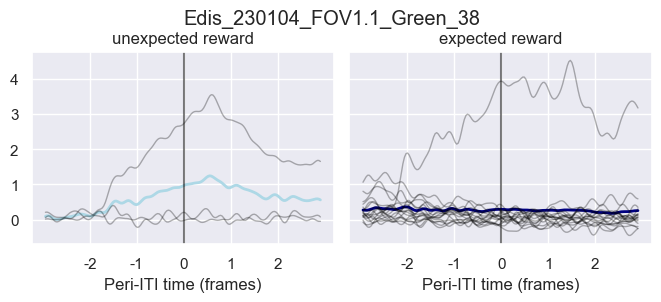

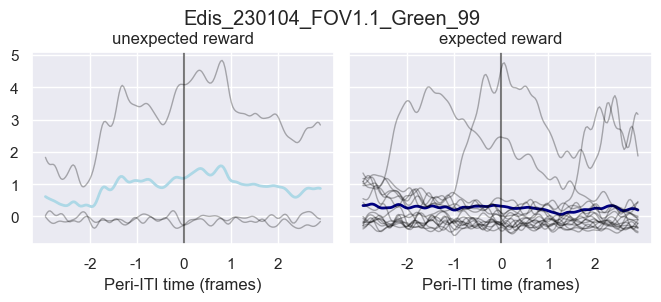

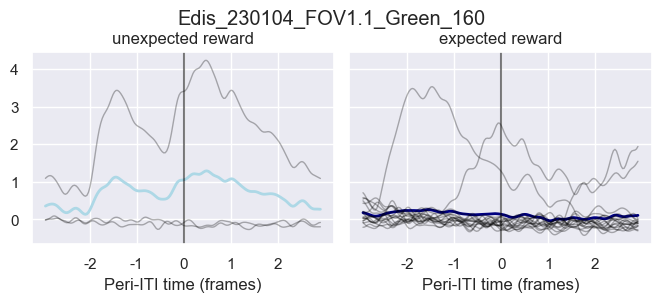

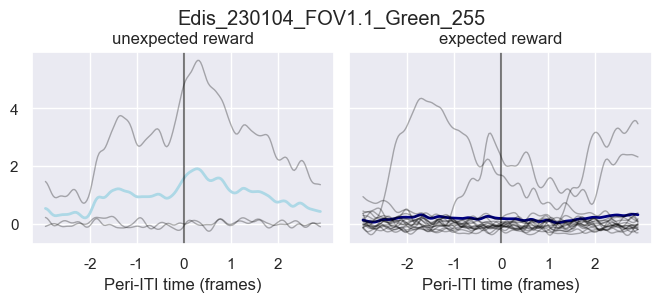

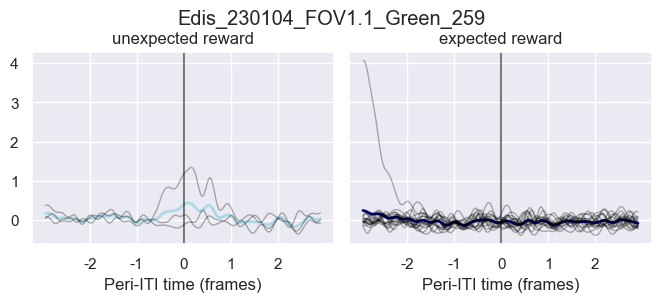

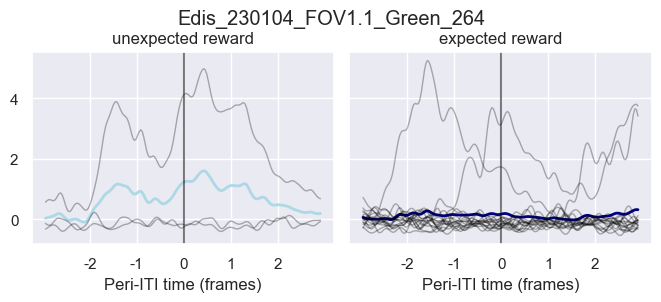

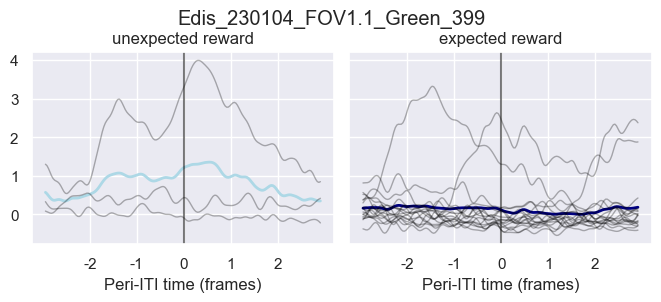

In [22]:
modulation_epoch = 'ITI'
channels = ['Green']
protocols = ['Edis']
modulation_types = ['unexpected reward']
trialtypes = {'unexpected reward':['rewarded FA','rewarded FA'],
              'expected reward':['rewarded hit','rewarded hit']}
plotting_epoch = 'ITI'
pre_window = 90
post_window = 90
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, save_ROIs)
plt.show()

## Reward onset unexpected reward-encoding axons post-reversal ##

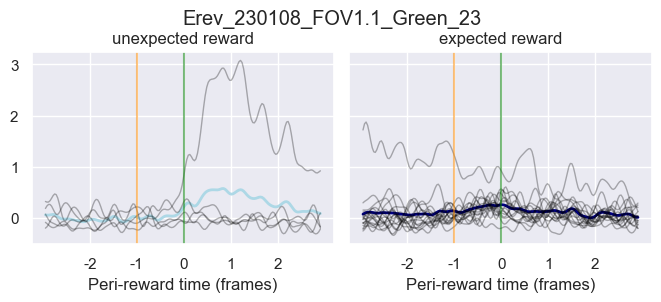

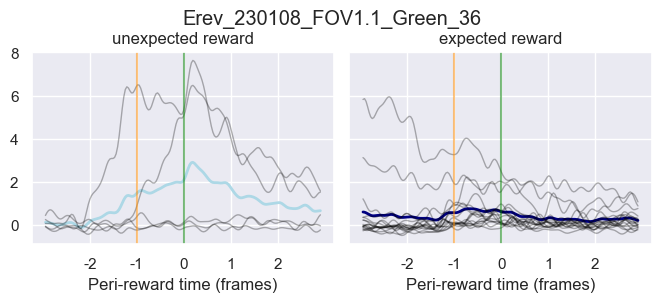

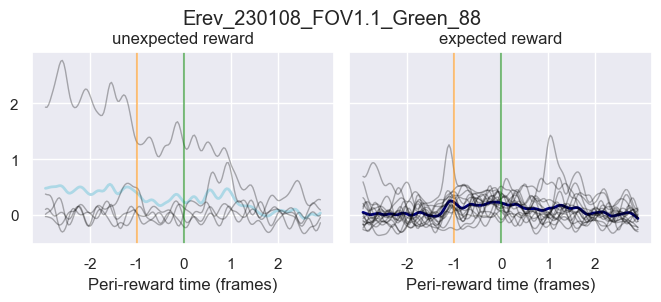

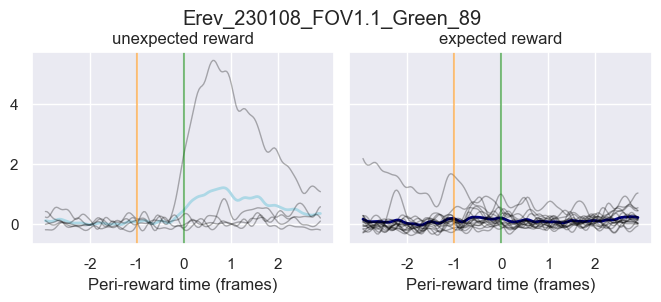

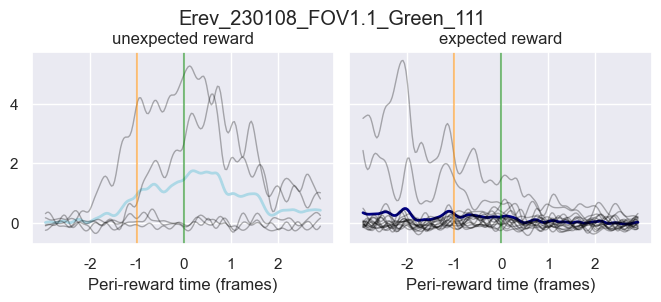

...

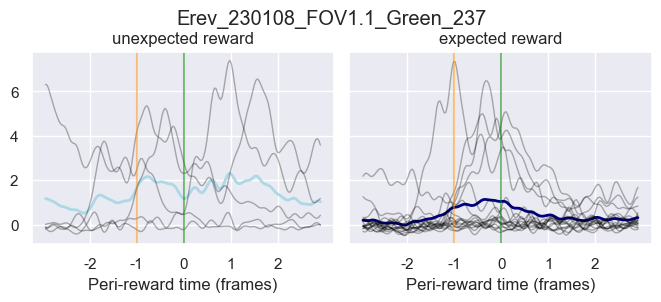

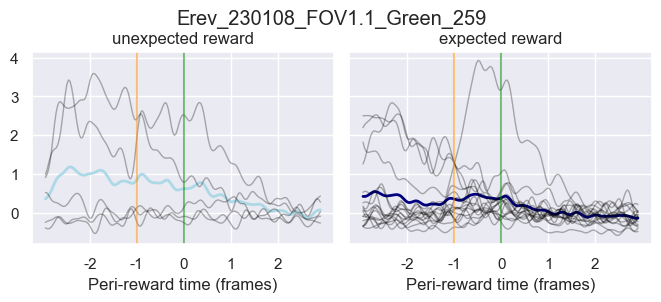

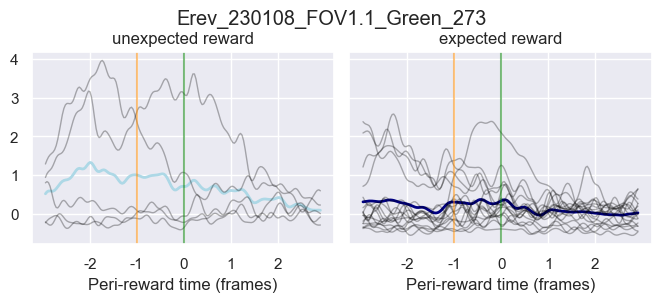

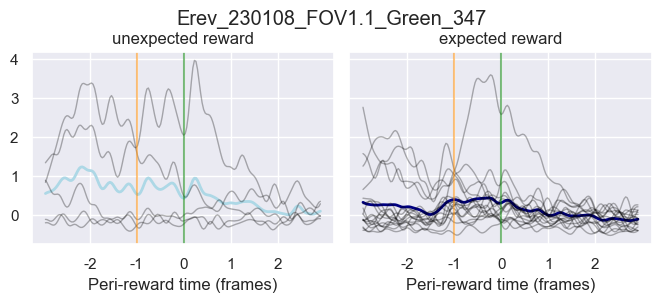

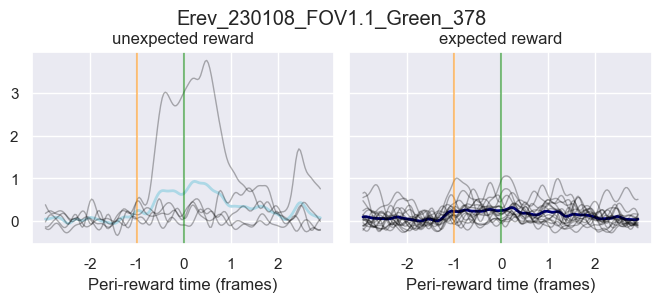

In [23]:
modulation_epoch = 'reward'
channels = ['Green']
protocols = ['Erev']
modulation_types = ['unexpected reward']
trialtypes = {'unexpected reward':['rewarded FA','rewarded FA'],
              'expected reward':['rewarded hit','rewarded hit']}
plotting_epoch = 'reward'
pre_window = 90
post_window = 90
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, save_ROIs)
plt.show()

## ITI onset unexpected reward-encoding axons post-reversal ##

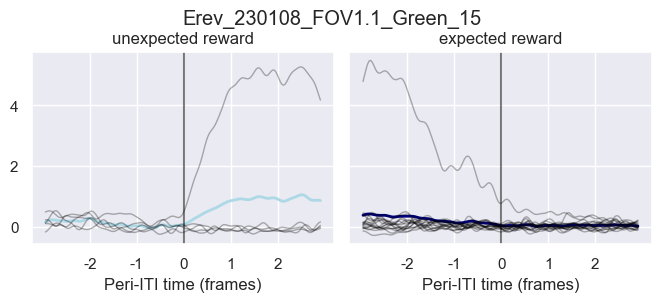

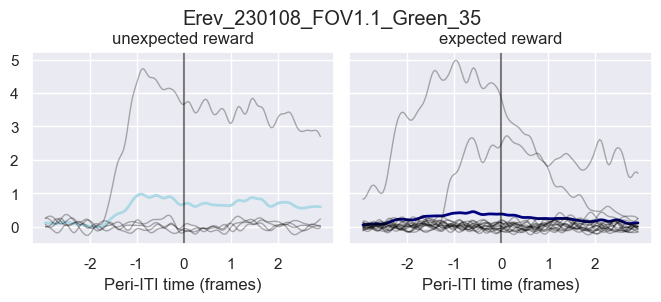

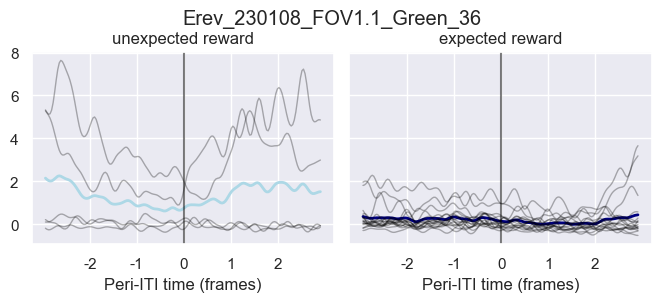

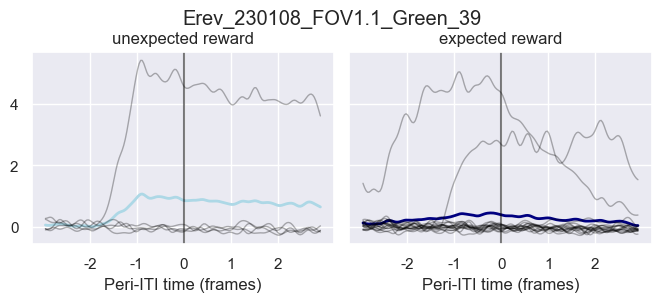

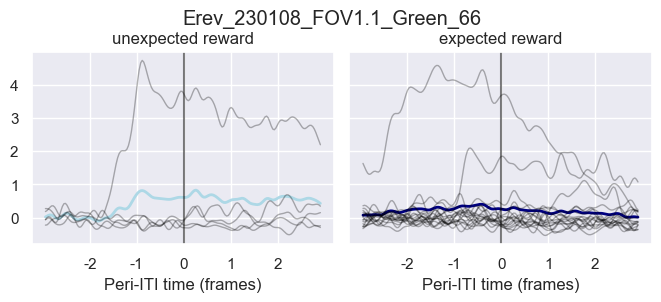

...

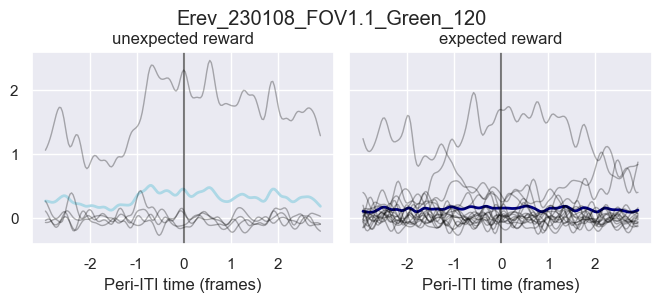

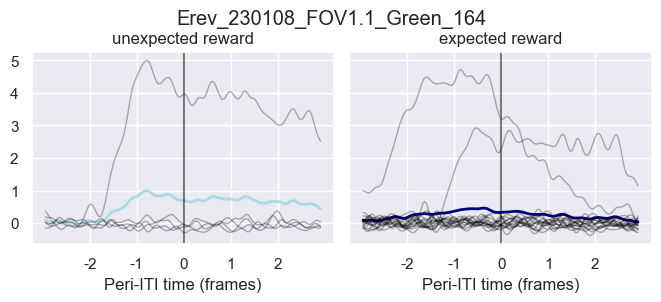

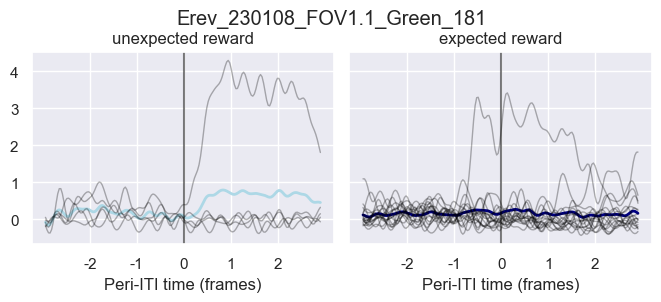

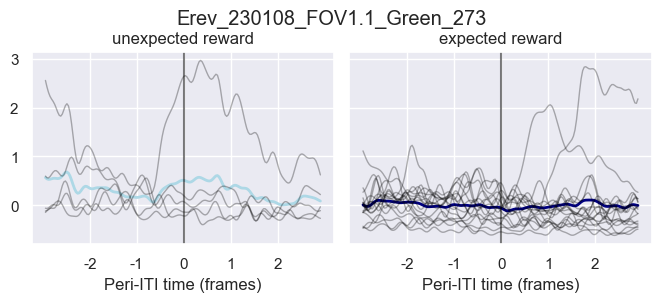

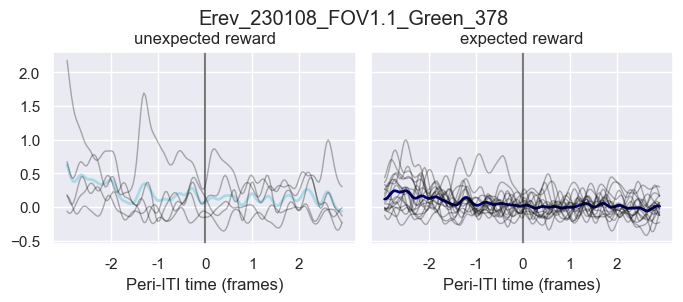

In [24]:
modulation_epoch = 'ITI'
channels = ['Green']
protocols = ['Erev']
modulation_types = ['unexpected reward']
trialtypes = {'unexpected reward':['rewarded FA','rewarded FA'],
              'expected reward':['rewarded hit','rewarded hit']}
plotting_epoch = 'ITI'
pre_window = 90
post_window = 90
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, save_ROIs)
plt.show()

## Reward onset unexpected reward-encoding dendrites post-reversal ##

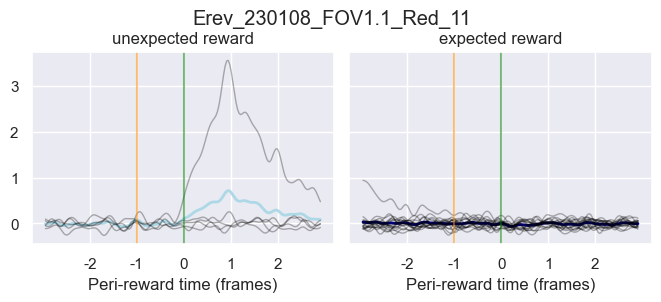

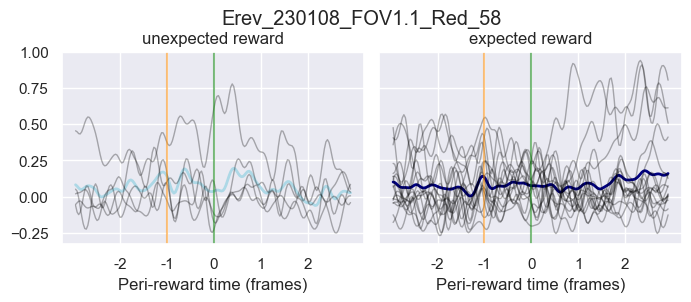

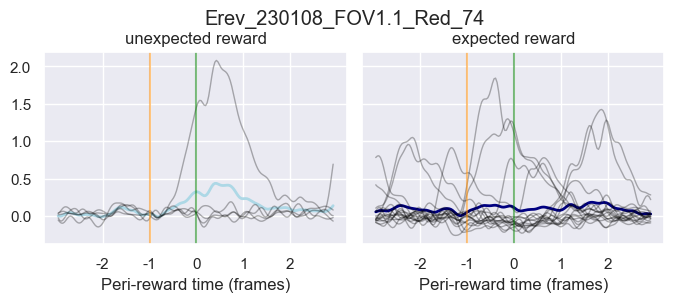

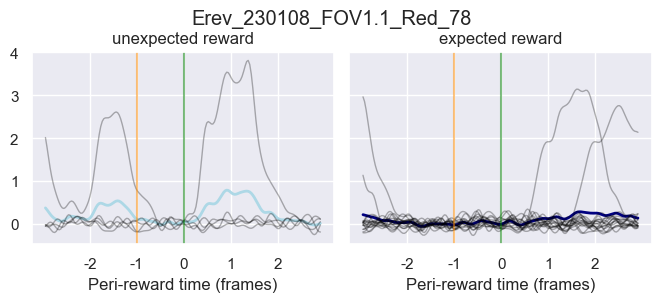

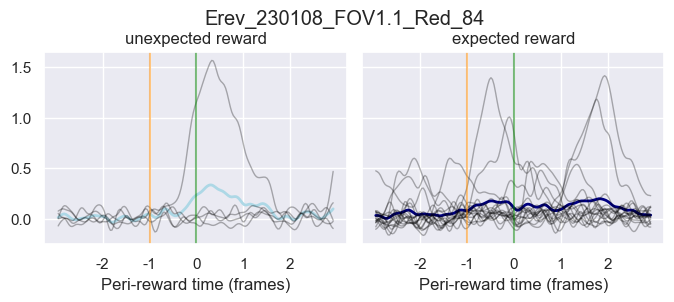

...

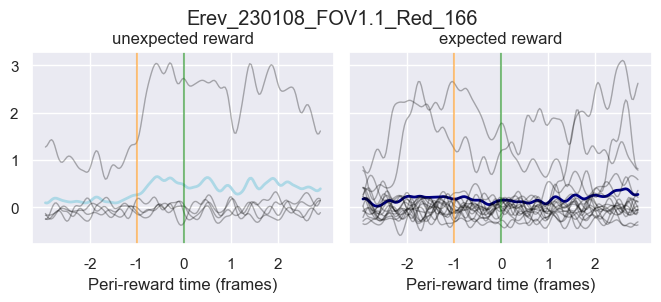

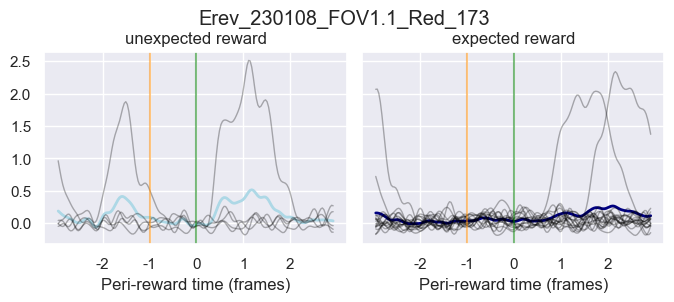

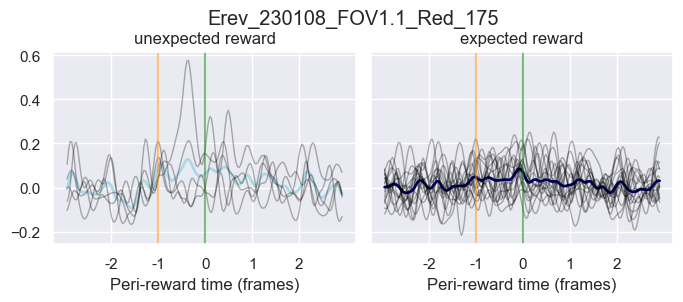

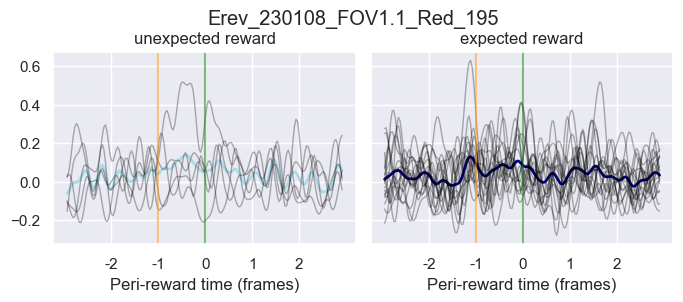

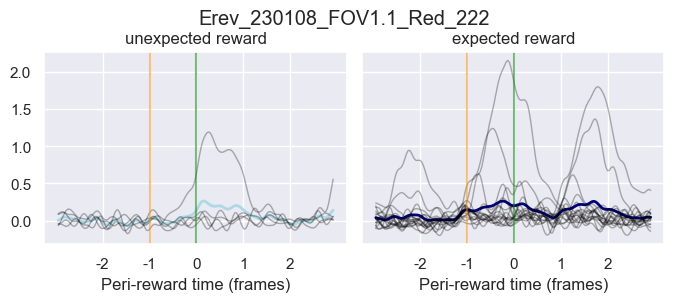

In [25]:
modulation_epoch = 'reward'
channels = ['Red']
protocols = ['Erev']
modulation_types = ['unexpected reward']
trialtypes = {'unexpected reward':['rewarded FA','rewarded FA'],
              'expected reward':['rewarded hit','rewarded hit']}
plotting_epoch = 'reward'
pre_window = 90
post_window = 90
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, save_ROIs)
plt.show()

## ITI onset unexpected reward-encoding dendrites post-reversal ##

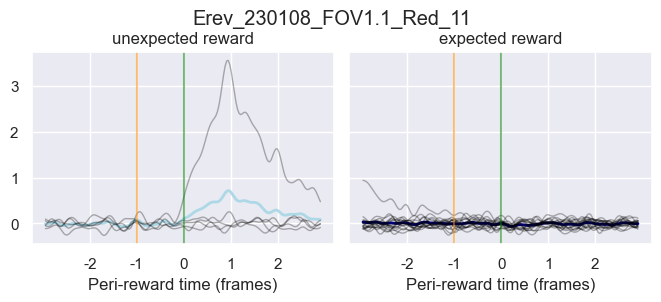

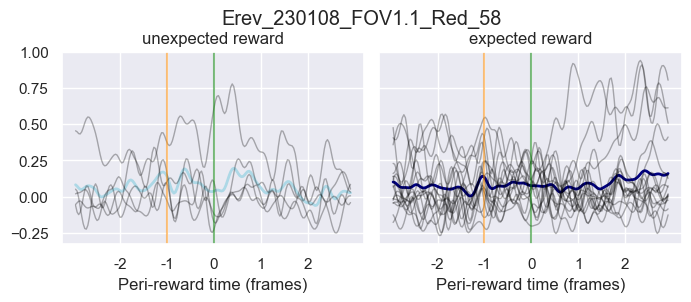

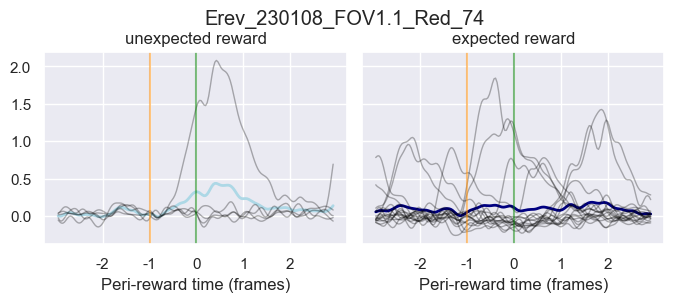

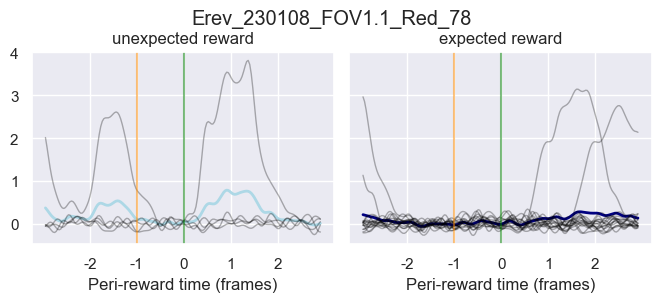

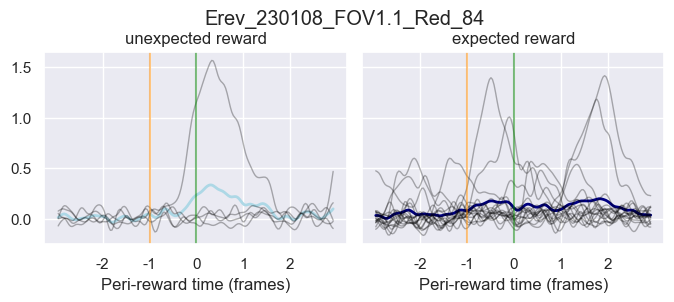

...

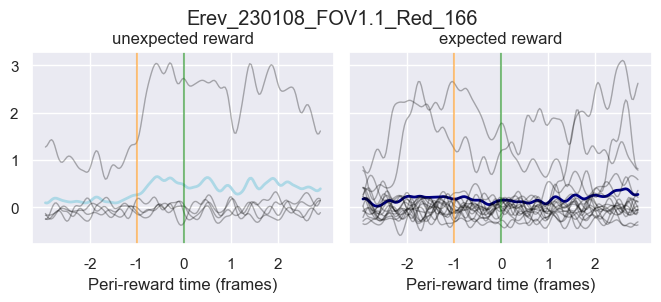

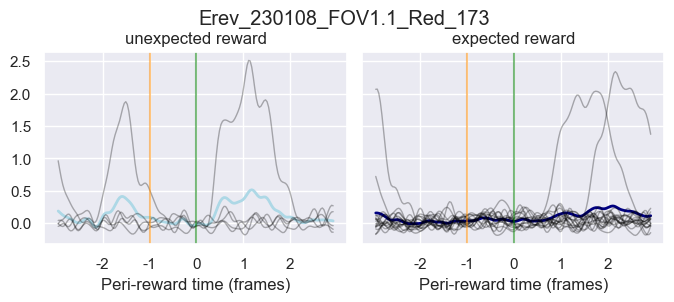

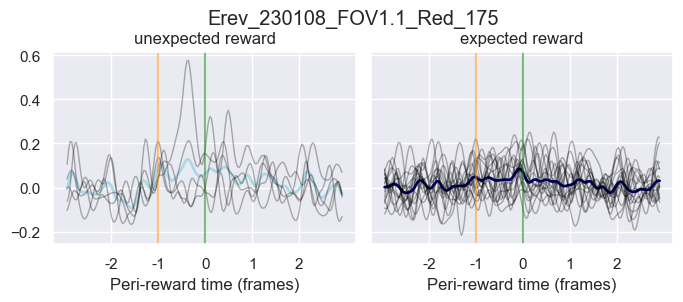

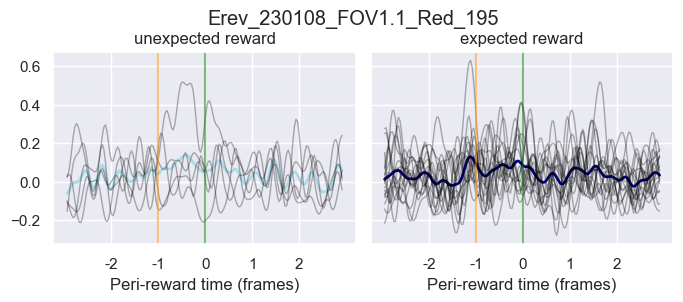

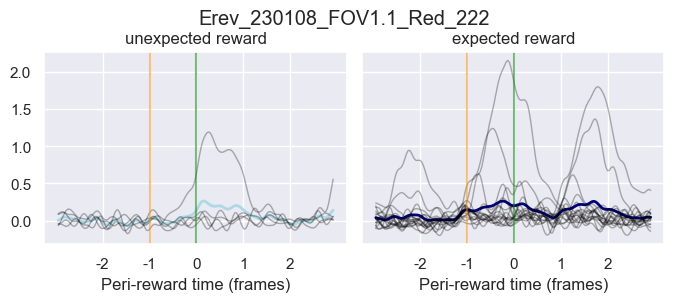

In [26]:
modulation_epoch = 'reward'
channels = ['Red']
protocols = ['Erev']
modulation_types = ['unexpected reward']
trialtypes = {'unexpected reward':['rewarded FA','rewarded FA'],
              'expected reward':['rewarded hit','rewarded hit']}
plotting_epoch = 'reward'
pre_window = 90
post_window = 90
specific_ROIs = []
for ROI_type, type_dict in modulated_ROIs[modulation_epoch].items():
    if ROI_type in modulation_types:
        for ID, ID_list in type_dict.items():
            for ROI in ID_list:
                specific_ROIs.append(ROI)
fn.plot_ROI_by_ROI_traces(cohort_epochs, protocols, channels, trialtypes, colors, specific_ROIs, plotting_epoch, pre_window, post_window, plottype, reversed_sessions, save_ROIs)
plt.show()

## Find out how many ROIs there are in each FOV to see if oversampling minority class of trials is possible ##
1. There are too few trials to have a good representation of unrewarded False Alarms in particular
2. Can we leverage the relatively larger number of ROIs to increase statistical power
3. Does it make sense to create "new trials" made up of a subsample of ROIs on a given trial (i.e. and repeat sub-sampling process to increase trials)?
4. Or is it better to create new trials by combining all neurons from a subsample of trials and repeat this subsampling process?
5. Or maybe a combination of (3) and (4)?
6. The only issue with subsampling across trials is the potential behavioral variability it introduces (i.e. different trials may have slightly different behavior) - maybe this is okay if we make the assumption that the behavior is the same as it is the same trial type

In [32]:
all_df = pd.concat(cohort_epochs['deltaF']['all'])
all_df = fn.reverse_outcome_indexes(all_df, 'deltaF', reversed_sessions)

nROIs = {}
for sesh in all_df.index.get_level_values('Unique session').unique():
    sesh_df = all_df[all_df.index.get_level_values('Unique session') == sesh]
    for channel in sesh_df.index.get_level_values('Channel').unique():
        channel_df = sesh_df[sesh_df.index.get_level_values('Channel') == channel]
        ROIs = channel_df.groupby(channel_df.index.get_level_values('Unique_ROI')).mean().shape[0]
        if channel not in nROIs.keys():
            nROIs[channel] = {}
            nROIs[channel][sesh] = ROIs
        else:
            nROIs[channel][sesh] = ROIs
            
dual_imaging_mice = ['RGECO_GCamP_Batch1_four','RGECO_GCamP_Batch1_muji','RGECO_GCamP_Batch3_muji','RGECO_GCamP_Batch3_one']
dual_imaging_df = pd.concat(cohort_epochs['deltaF']['all'])
dual_imaging_df = dual_imaging_df[dual_imaging_df.index.get_level_values(0).isin(dual_imaging_mice)]
dual_imaging_ROIs = dual_imaging_df.index.get_level_values('Unique_ROI').unique()

- **Define the minimum number of ROIs in a FOV/trial we need in order to create "new trials" from a subsample of ROIs in a FOV**

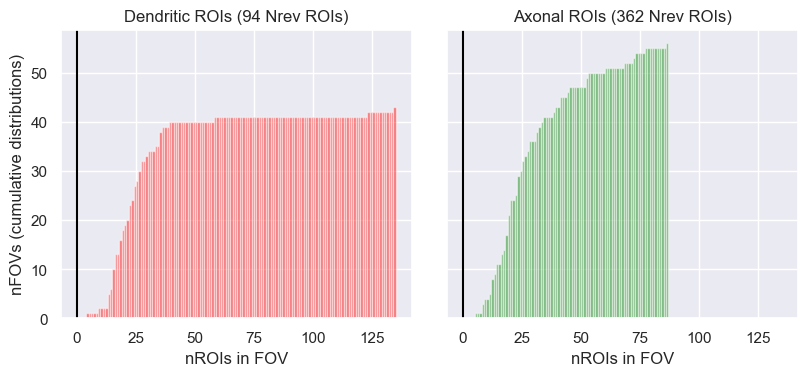

NameError: name 'lick_positive_ROIs' is not defined

In [33]:
ROI_thresh = 0
valid_ROIs = []

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(6.34*1.5, 2.5*1.5), sharey=True, sharex=True, gridspec_kw={'wspace':0.1})
for col, (channel, label, color) in enumerate(zip(['Red','Green'], ['Dendritic ROIs','Axonal ROIs'], ['red','green'])):
    channel_ROIs = nROIs[channel]
    ax[col].hist(channel_ROIs.values(), bins=max(channel_ROIs.values())-min(channel_ROIs.values()), color=color,alpha=0.5, cumulative=True)
    if col == 0:
        ax[col].set_ylabel('nFOVs (cumulative distributions)')
    ax[col].set_xlabel('nROIs in FOV')
    ax[col].axvline(ROI_thresh, color='black')
    
    valid_channel_ROIs = []
    for sesh, n in channel_ROIs.items():
        if n >= ROI_thresh:
            valid_df = all_df[all_df.index.get_level_values('Unique session') == sesh]
            for ROI in valid_df.index.get_level_values('Unique_ROI').unique():
                valid_ROIs.append(ROI)
                valid_channel_ROIs.append(ROI)
    filt_nrev = len([x for x in valid_channel_ROIs if ('Nrev' in x) & (channel in x)])
    ax[col].set_title(f'{label} ({filt_nrev} Nrev ROIs)')
plt.show()

pairwise_cutoff = 0.864
cutoff_on = 'maxes'
nbins = 20
filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]
include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                'correlated_ROIs':correlated_ROI_list,
                'uncorrelated_ROIs':dual_imaging_uncorrelated_ROIs,
                'lick_positive_ROIs':lick_positive_ROIs,
                'rew_positive_ROIs':rew_positive_ROIs,
                'rew_negative_ROIs':rew_negative_ROIs}

In [ ]:
try:
    import importlib
    importlib.reload(fn)
except NameError: # It hasn't been imported yet
    import functions_module as fn

## Trial-by-trial FOV averaged comparisons ##

0.9


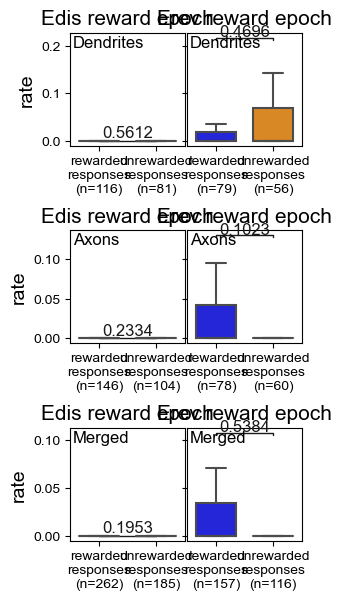

In [33]:
epoch = 'reward'
trialtypes = {#'responses':['rewarded hit','rewarded FA','unrewarded hit','unrewarded FA'],
              #'no responses':['unrewarded miss','unrewarded CR'],
              #'correct responses':['rewarded hit','unrewarded hit'],
              #'incorrect responses':['rewarded FA','unrewarded FA']
              'rewarded responses':['rewarded hit','rewarded FA'],             
              'unrewarded responses':['unrewarded hit','unrewarded FA']
              #'expected reward':['rewarded hit','rewarded hit'],
              #'unexpected reward':['rewarded FA','rewarded FA'],
              #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
              #'expected omission':['unrewarded FA','unrewarded FA'],
              #'unexpected omission':['unrewarded hit','unrewarded hit'],
              #'expected outcomes':['rewarded hit','unrewarded FA'],
              #'unexpected outcomes':['unrewarded hit','rewarded FA'],
             }
ttest = 'non-parametric'
welch = True
merged = True
ROIs_label = 'uncorrelated_ROIs'
figsize = (1.9897*1.5, 2.1987*3)
ylim = False#[-0.025,0.4]
metric = 'rate'

for c in [0.9]:#np.linspace(0.8, 0.95, 16):
    print(c)
    pairwise_cutoff = c
    cutoff_on = 'maxes'
    nbins = 20
    filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
    correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
    dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]
    for std in [0.02]:#np.linspace(0.02, 0.08, 13):
#         print(std)
        mods, lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs, rew_negative_neutral_ROIs = event_based_MI(cohort_epochs, 3, std)
        include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                    'correlated_ROIs':correlated_ROI_list,
                    'uncorrelated_ROIs':dual_imaging_uncorrelated_ROIs,
                    'lick_positive_ROIs':lick_positive_ROIs,
                    'rew_positive_ROIs':rew_positive_ROIs,
                    'rew_negative_ROIs':rew_negative_ROIs}
        all_comparisons = []
        for protocols in [[['Edis'],['Erev']]]:
            ROIs_to_include = include_ROI_dict[ROIs_label]#[x for x in valid_ROIs if ('Red' in x) | (('Green' in x) & (x in include_ROI_dict[ROIs_label]))]

            active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
            final_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch, ROIs_to_include)
            final_metric = merge_final_metrics(final_metric)
#             final_metric_df = combine_final_metrics(final_metric, metric)
#             final_metric_df_correlated = combine_final_metrics(final_metric, metric)
            final_metric_df_uncorrelated = combine_final_metrics(final_metric, metric)
# 
#             all_comparisons.append(final_metric_df)
            sns.reset_defaults()
            fig = plot_box_plots(final_metric, epoch, ttest, figsize, metric, welch, merged, ylim=ylim, remove_labels=False, fliers=False)
        
#             fig.savefig('{}\\{}_{}_{}_{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                       metric,
#                                                       epoch,
#                                                       ROIs_label,   
#                                                       ('_vs_').join(list(trialtypes.keys())),
#                                                       ('_').join([item for sublist in protocols for item in sublist]),
#                                                       ttest,
#                                                       'welch' if welch == True else 'unwelched'),
#                 bbox_inches=0, pad_inches=0)

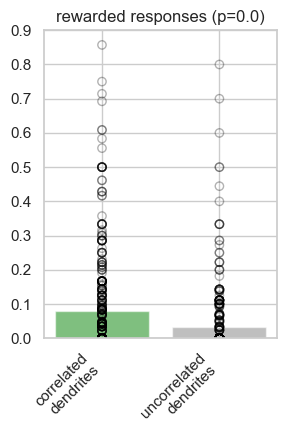

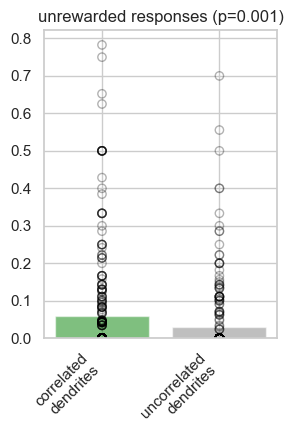

In [37]:
for trialtype in ['rewarded responses','unrewarded responses']:
    corr_type_df = final_metric_df_correlated.T[(final_metric_df_correlated.T.index.get_level_values(1) == trialtype) &
                                (final_metric_df_correlated.T.index.get_level_values(2) == 'merged')].T
    uncorr_type_df = final_metric_df_uncorrelated.T[(final_metric_df_uncorrelated.T.index.get_level_values(1) == trialtype) &
                                (final_metric_df_uncorrelated.T.index.get_level_values(2) == 'merged')].T
    fig, ax = plt.subplots(nrows=1, ncols=1,
                           figsize=(3,4),
                           sharey=True)
    
    y_dict = {}
    for x, (df, title) in enumerate(zip([corr_type_df, uncorr_type_df], ['correlated dendrites','uncorrelated dendrites'])):
        y = []
        for protocol in ['Edis','Erev']:
            protocol_df = df[protocol].dropna()
            xvalues = [x]*protocol_df.shape[0]
            yvalues = protocol_df.to_numpy().reshape(-1)
            ax.scatter(xvalues, yvalues,
                            facecolor='None', edgecolor='black',alpha=0.3,
                            zorder=2)
            y = y + list(yvalues)
        y_dict[title] = np.array(y)
    p = round(float(ttest_ind(y_dict['correlated dendrites'], y_dict['uncorrelated dendrites'])[1]),3)
        
    ax.bar(0, y_dict['correlated dendrites'].mean(),
                color='green',alpha=0.5,
                zorder=1)
    ax.bar(1,  y_dict['uncorrelated dendrites'].mean(),
                color='grey',alpha=0.5,
                zorder=1)
    ax.set_title(f'{trialtype} (p={p})')
    ax.set_xticks([0,1])
    ax.set_xticklabels([x+'\ndendrites' for x in ['correlated','uncorrelated']],
                       rotation=45, ha='right')
    plt.show()

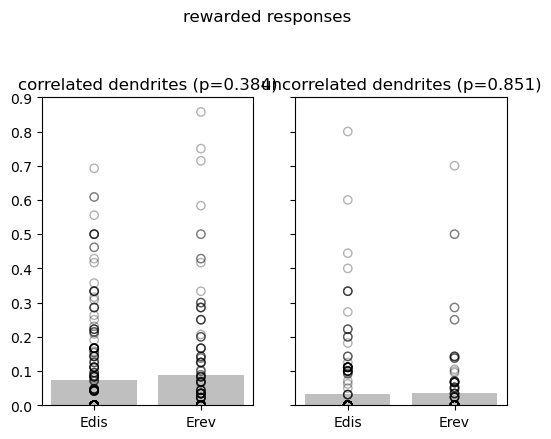

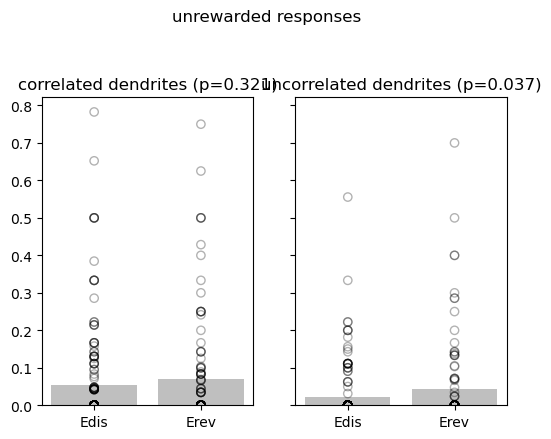

In [40]:
norm_dfs = {}
for df, roitype in zip([final_metric_df_correlated, final_metric_df_uncorrelated],
                       ['correlated','uncorrelated']):
    norm_dfs[roitype] = {}
    
    rew = df.T[(df.T.index.get_level_values(1) == 'rewarded responses') &
               (df.T.index.get_level_values(2) == 'merged')].T
    omit = df.T[(df.T.index.get_level_values(1) == 'unrewarded responses') &
                (df.T.index.get_level_values(2) == 'merged')].T
    rew['Edis'] = (rew['Edis'])# / float(omit['Edis'].mean()))# / (rew['Edis'] + float(omit['Edis'].mean()))
#     rew['Nrev'] = (rew['Nrev'] / float(omit['Nrev'].mean()))# / (rew['Nrev'] + float(omit['Nrev'].mean()))
    rew['Erev'] = (rew['Erev'])# / float(omit['Erev'].mean()))# / (rew['Erev'] + float(omit['Erev'].mean()))

    omit['Edis'] = (omit['Edis'])# / float(rew['Edis'].mean()))# / (omit['Edis'] + float(rew['Edis'].mean()))
#     omit['Nrev'] = (omit['Nrev'] / float(rew['Nrev'].mean()))# / (omit['Nrev'] + float(rew['Nrev'].mean()))
    omit['Erev'] = (omit['Erev'])# / float(rew['Erev'].mean()))# / (omit['Erev'] + float(rew['Erev'].mean()))
    
    norm_dfs[roitype]['rewarded responses'] = rew
    norm_dfs[roitype]['unrewarded responses'] = omit
    
for trialtype in ['rewarded responses','unrewarded responses']:
    corr_type_df = norm_dfs['correlated'][trialtype]
    uncorr_type_df = norm_dfs['uncorrelated'][trialtype]

    sns.reset_defaults()
    fig, ax = plt.subplots(nrows=1, ncols=2,
                           figsize=(6,4),
                           sharey=True)
    fig.suptitle(trialtype, y=1.1)
    
    for col, (df, title) in enumerate(zip([corr_type_df, uncorr_type_df], ['correlated dendrites','uncorrelated dendrites'])):
        y = {}
        for x, (protocol) in enumerate(['Edis','Erev']):
            protocol_df = df[protocol].dropna()
            xvalues = np.array([x]*protocol_df.shape[0]).reshape(-1,1)
            yvalues = protocol_df.to_numpy()
            ax[col].scatter(xvalues, yvalues,
                            facecolor='None', edgecolor='black',alpha=0.3,
                            zorder=2)
            y[protocol] = yvalues
        p = round(float(ttest_ind(y['Edis'], y['Erev'])[1]),3)
        
        ax[col].bar(0, y['Edis'].mean(),
                    color='grey',alpha=0.5,
                    zorder=1)
#         ax[col].bar(1,  y['Nrev'].mean(),
#             color='grey',alpha=0.5,
#             zorder=1)
        ax[col].bar(1,  y['Erev'].mean(),
                    color='grey',alpha=0.5,
                    zorder=1)
        ax[col].set_title(f'{title} (p={p})')
        ax[col].set_xticks([0,1])
        ax[col].set_xticklabels(['Edis','Erev'])
    plt.show()

In [346]:
print(final_metric_df['Nrev']['rewarded responses']['Green'].mean())
print(final_metric_df['Nrev']['rewarded responses']['Green'].sem())
print(final_metric_df['Nrev']['rewarded responses']['Green'].dropna().shape)

print(final_metric_df['Nrev']['unrewarded responses']['Green'].mean())
print(final_metric_df['Nrev']['unrewarded responses']['Green'].sem())
print(final_metric_df['Nrev']['unrewarded responses']['Green'].dropna().shape)

rate    0.108771
dtype: float64
rate    0.009401
dtype: float64
(145, 1)
rate    0.086266
dtype: float64
rate    0.008698
dtype: float64
(122, 1)


## ROI-by-ROI trial-averaged comparisons ##

reward ALL_ROIs


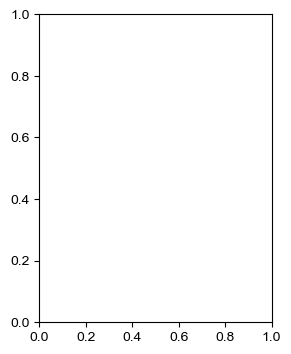

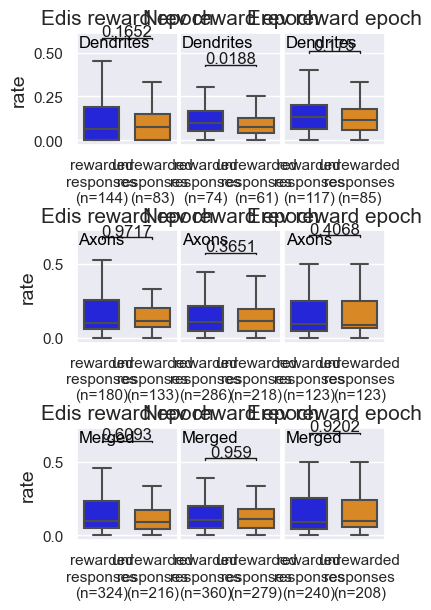

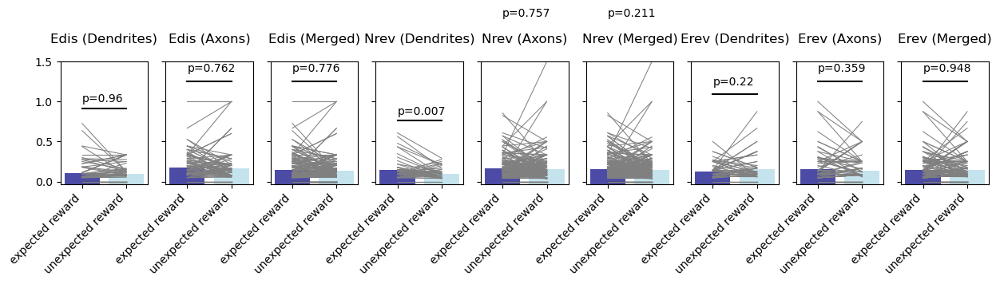

In [143]:
comparisons = [{'epoch':'reward', 'modulation':['all'], 't1':'rewarded responses', 't2':'unrewarded responses'}]

# specific_IDs = ['RGECO_GCamP_Batch1_four','RGECO_GCamP_Batch1_muji','RGECO_GCamP_Batch3_muji','RGECO_GCamP_Batch3_one']
# cohort_deltaF = cohort_deltaF[cohort_deltaF.index.get_level_values(0).isin(specific_IDs)]

metric = 'rate'
channels = ['Red','Green']
modulation_protocols = ['Edis','Nrev','Erev']
reverse = False
active_ROIs = False
ttest = 'parametric'
welch = True
merged = True
figsize = (1.9897*2, 2.1987*3)
remove_labels = False
analysis_epoch = 'reward'
ylim = False#[-0.025,1.5]
score_by = 'reward'
score_data = 'session-by-session'
score_metric = 'events'

score_type = 'norm' if 'normalized' in metric else 'zscore' if 'zscored' in metric else 'raw'
for c in [0.9]:#np.linspace(0.855, 0.87, 4):
    pairwise_cutoff = c
    cutoff_on = 'maxes'
    nbins = 20
    filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
    correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
    dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]

    for std in [0]:#np.linspace(0, 0.07, 8):
#         print(f'correlation thresh: {c}')
#         print(f'modulation thresh: {std}')
        mods, lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs, rew_negative_neutral_ROIs = event_based_MI(cohort_epochs, 3, std)
        
        include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                'correlated_ROIs':correlated_ROI_list,
                'uncorrelated_ROIs':dual_imaging_uncorrelated_ROIs,
                'lick_positive_ROIs':lick_positive_ROIs,
                'rew_positive_ROIs':rew_positive_ROIs,
                'rew_negative_ROIs':rew_negative_ROIs}
        for analysis_epoch in ['reward']:
            score_by = 'all'
            for ROI_label in ['ALL_ROIs']:
                print(f'{analysis_epoch} {ROI_label}')
                ROIs_to_include = include_ROI_dict[ROI_label]#[x for x in valid_ROIs if ('Red' in x) | (('Green' in x) & (x in include_ROI_dict['correlated_ROIs']))]
        #         ROIs_to_include = [x for x in ROIs_to_include if x in dual_imaging_ROIs]

                metrics_modulated = generate_metrics_modulated(comparisons, cohort_epochs, metric, channels, modulation_protocols, analysis_epoch, score_by, score_data, score_metric, score_type, active_ROIs=active_ROIs, reverse=reverse, specific_IDs = ROIs_to_include)
                metrics_modulated = merge_final_metrics(metrics_modulated) if merged == True else metrics_modulated
        #         sns.reset_defaults()
                fig = plot_box_plots(metrics_modulated, analysis_epoch, ttest, figsize, metric, welch, merged, ylim=ylim, remove_labels=remove_labels)
                sns.reset_defaults()
                fig = plot_paired(metrics_modulated, metric, merged)
                plt.show()
        #         fig.savefig('{}\\{}_{}_{}_{}_{}_{}_{}_paired_plots.svg'.format(data_directory,
        #                                                   metric,
        #                                                   epoch,
        #                                                   ROIs_label,   
        #                                                   ('_vs_').join(list(trialtypes.keys())),
        #                                                   ('_').join([item for sublist in protocol_list for item in sublist]),
        #                                                   ttest,
        #                                                   'welch' if welch == True else 'unwelched'),
        #             bbox_inches=0, pad_inches=0)

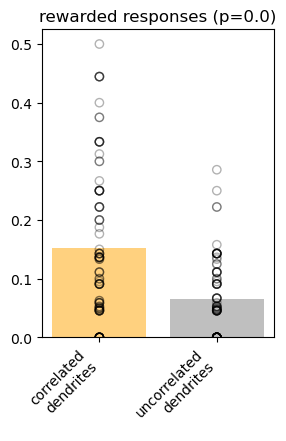

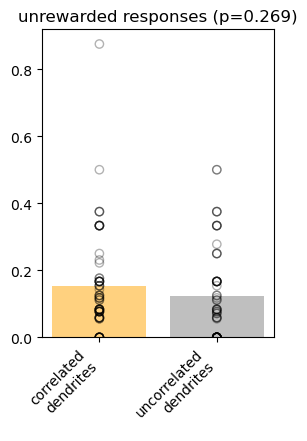

In [152]:
all_ROI_dict = {}
for protocol, protocol_dict in metrics_modulated.items():
    protocol_dfs = {}
    for trialtype, trialtype_dict in protocol_dict.items():
        ttype_dfs = {}
        for channel in ['Red','Green','merged']:
            channel_dict = trialtype_dict[channel]
            channel_df = pd.DataFrame(channel_dict.values(), channel_dict.keys(), columns=['rate'])
            ttype_dfs[channel] = channel_df
        ttype_df = pd.concat(ttype_dfs, axis=1)
        protocol_dfs[trialtype] = ttype_df
    protocol_df = pd.concat(protocol_dfs, axis=1)
    all_ROI_dict[protocol] = protocol_df
all_ROI_df = pd.concat(all_ROI_dict, axis=1)
corr_df = all_ROI_df[all_ROI_df.index.isin(correlated_ROI_list)]#[x+'_Green' for x in correlated_ROI_list] + [x+'_Red' for x in correlated_ROI_list])]
uncorr_df = all_ROI_df[all_ROI_df.index.isin(dual_imaging_uncorrelated_ROIs)]#[x+'_Green' for x in dual_imaging_uncorrelated_ROIs] + [x+'_Red' for x in dual_imaging_uncorrelated_ROIs])]


for trialtype in ['rewarded responses','unrewarded responses']:
    corr_type_df = corr_df.T[(corr_df.T.index.get_level_values(1) == trialtype) &
                                (corr_df.T.index.get_level_values(2) == 'Red')].T
    
    uncorr_type_df = uncorr_df.T[(uncorr_df.T.index.get_level_values(1) == trialtype) &
                                (uncorr_df.T.index.get_level_values(2) == 'Red')].T
    
    fig, ax = plt.subplots(nrows=1, ncols=1,
                           figsize=(3,4),
                           sharey=True)
    
    y_dict = {}
    for x, (df, title) in enumerate(zip([corr_type_df, uncorr_type_df], ['correlated dendrites','uncorrelated dendrites'])):
        y = []
        for protocol in ['Edis','Erev']:
            protocol_df = df[protocol].dropna()
            xvalues = [x]*protocol_df.shape[0]
            yvalues = protocol_df.to_numpy().reshape(-1)
            ax.scatter(xvalues, yvalues,
                            facecolor='None', edgecolor='black',alpha=0.3,
                            zorder=2)
            y = y + list(yvalues)
        y_dict[title] = np.array(y)
    p = round(float(ttest_ind(y_dict['correlated dendrites'], y_dict['uncorrelated dendrites'])[1]),3)
        
    ax.bar(0, y_dict['correlated dendrites'].mean(),
                color='orange',alpha=0.5,
                zorder=1)
    ax.bar(1,  y_dict['uncorrelated dendrites'].mean(),
                color='grey',alpha=0.5,
                zorder=1)
    ax.set_title(f'{trialtype} (p={p})')
    ax.set_xticks([0,1])
    ax.set_xticklabels([x+'\ndendrites' for x in ['correlated','uncorrelated']],
                       rotation=45, ha='right')
    plt.show()

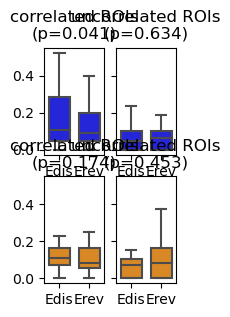

In [96]:
norm_dfs = {}
for df, roitype in zip([corr_df, uncorr_df],
                       ['correlated','uncorrelated']):
    norm_dfs[roitype] = {}
    
    rew = {}
    omit = {}
    for protocol in ['Edis','Erev']:
        r = df[protocol]['rewarded responses']['merged']
        o = df[protocol]['unrewarded responses']['merged']
        protocol_rew = r#(r-o) / (r+o)
        rew[protocol] = protocol_rew
        
        protocol_omit = o#(o-r) / (o+r)
        omit[protocol] = protocol_omit
    rew = pd.concat(rew, axis=1)
    omit = pd.concat(omit, axis=1)

    norm_dfs[roitype]['rewarded responses'] = rew
    norm_dfs[roitype]['unrewarded responses'] = omit
    
fig, ax = plt.subplots(nrows=2, ncols=2,
                       figsize=(1.7,1.53*2),
                       sharey=True)    
for row, (trialtype) in enumerate(['rewarded responses','unrewarded responses']):
    corr_type_df = norm_dfs['correlated'][trialtype]
    uncorr_type_df = norm_dfs['uncorrelated'][trialtype]

    sns.reset_defaults()

#     fig.suptitle(trialtype, y=1.1)
    
    for col, (df, title) in enumerate(zip([corr_type_df, uncorr_type_df], ['correlated ROIs','uncorrelated ROIs'])):
        channel_df = df.T
        xvalues = list(channel_df.index.get_level_values(0))
        idx = [('\n').join((f'{x} (n={len(channel_df.T[x].dropna())})').split(' ')) for x in xvalues]
        melted_df = channel_df.T.set_axis(idx, axis=1).melt(var_name='Variable', value_name='Accuracy')
        palette = [boxplot_colors[trialtype] for x in xvalues]
        sns.boxplot(data=melted_df, x='Variable', y='Accuracy', hue='Variable', palette=palette, ax=ax[row,col], showfliers=False, dodge=False, width=0.7, saturation=0.7)        
#         color = 'orange' if col == 0 else 'grey'
        y = {}
        for x, (protocol) in enumerate(['Edis','Erev']):
            protocol_df = df[protocol].dropna()
            xvalues = np.array([x]*protocol_df.shape[0]).reshape(-1,1)
            yvalues = protocol_df.to_numpy()
#             ax[row,col].scatter(xvalues, yvalues,
#                             facecolor='None', edgecolor='black',alpha=0.3,
#                             zorder=2, s=10)
            y[protocol] = yvalues.reshape(-1)
        p = round(float(ttest_ind(y['Edis'], y['Erev'])[1]),3)
#         sns.boxplot(y, x=y.keys(), y=y.values(), ax=ax[row,col])
        
#         pre_mean = round(y['Edis'].mean(),3)
#         pre_std = y['Edis'].std()
#         pre_n = len(y['Edis'])
#         pre_sem = pre_std / np.sqrt(pre_n)

#         post_mean = round(y['Erev'].mean(),3)
#         post_std = y['Erev'].std()
#         post_n = len(y['Erev'])
#         post_sem = post_std / np.sqrt(post_n)
        
#         print(f'Pre-reversal: {pre_mean} +/- {pre_sem}, n={pre_n}')
#         print(f'Post-reversal: {post_mean} +/- {post_sem}, n={post_n}')
        
#         ax[row,col].bar(0, y['Edis'].mean(),
#                     color=color,alpha=0.5,
#                     zorder=1)
# #         ax[row,col].bar(1,  y['Nrev'].mean(),
# #             color='grey',alpha=0.5,
# #             zorder=1)
#         ax[row,col].bar(1,  y['Erev'].mean(),
#                     color=color,alpha=0.5,
#                     zorder=1)
        ax[row,col].set_title(f'{title}\n(p={p})')
        ax[row,col].set_xticks([0,1])
        ax[row,col].set_xticklabels(['Edis','Erev'])
        ax[row,col].legend_.remove()
        ax[row,col].set_xlabel('')
        ax[row,col].set_ylabel('')
plt.show()
fig.savefig(os.path.join(data_directory, 'correlated_and_uncorrelated_ROIs_merged_rewarded_rates_boxplot.svg'))

ITI correlated_ROIs


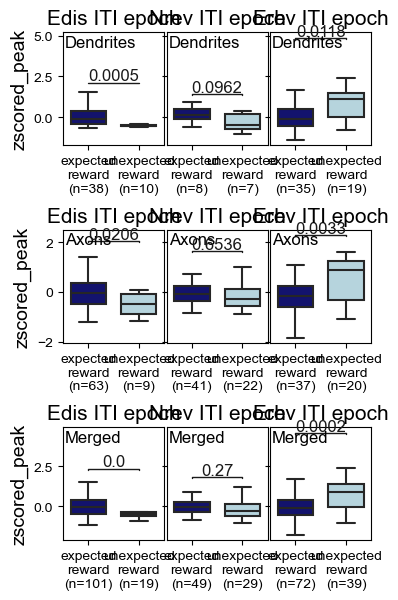

In [136]:
comparisons = [{'epoch':'responses', 'modulation':['all'], 't1':'expected reward', 't2':'unexpected reward'}]

# specific_IDs = ['RGECO_GCamP_Batch1_four','RGECO_GCamP_Batch1_muji','RGECO_GCamP_Batch3_muji','RGECO_GCamP_Batch3_one']
# cohort_deltaF = cohort_deltaF[cohort_deltaF.index.get_level_values(0).isin(specific_IDs)]

metric = 'zscored_peak'
channels = ['Red','Green']
modulation_protocols = ['Edis','Nrev','Erev']
reverse = False
active_ROIs = False
ttest = 'parametric'
welch = True
merged = True
figsize = (1.9897*2, 2.1987*3)
remove_labels = False
analysis_epoch = 'ITI'
ylim = False#[-0.025,1.5]
score_by = 'ITI'
score_data = 'ROI-by-ROI'
score_metric = 'events'

score_type = 'norm' if 'normalized' in metric else 'zscore' if 'zscored' in metric else 'raw'
for c in [0.9]:#np.linspace(0.855, 0.87, 4):
    pairwise_cutoff = c
    cutoff_on = 'maxes'
    nbins = 20
    filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
    correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
    dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]

    for std in [0]:#np.linspace(0, 0.07, 8):
#         print(f'correlation thresh: {c}')
#         print(f'modulation thresh: {std}')
        mods, lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs, rew_negative_neutral_ROIs = event_based_MI(cohort_epochs, 3, std)
        
        include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                'correlated_ROIs':correlated_ROI_list,
                'uncorrelated_ROIs':dual_imaging_uncorrelated_ROIs,
                'lick_positive_ROIs':lick_positive_ROIs,
                'rew_positive_ROIs':rew_positive_ROIs,
                'rew_negative_ROIs':rew_negative_ROIs}
        for analysis_epoch in ['ITI']:
            score_by = analysis_epoch
            for ROI_label in ['correlated_ROIs']:
                print(f'{analysis_epoch} {ROI_label}')
                ROIs_to_include = include_ROI_dict[ROI_label]#[x for x in valid_ROIs if ('Red' in x) | (('Green' in x) & (x in include_ROI_dict['correlated_ROIs']))]
        #         ROIs_to_include = [x for x in ROIs_to_include if x in dual_imaging_ROIs]

                metrics_modulated = generate_metrics_modulated(comparisons, cohort_epochs, metric, channels, modulation_protocols, analysis_epoch, score_by, score_data, score_metric, score_type, active_ROIs=active_ROIs, reverse=reverse, specific_IDs = ROIs_to_include)
                metrics_modulated = merge_final_metrics(metrics_modulated) if merged == True else metrics_modulated
                sns.reset_defaults()
                fig = plot_box_plots(metrics_modulated, analysis_epoch, ttest, figsize, metric, welch, merged, ylim=ylim, remove_labels=remove_labels)
                sns.reset_defaults()
#                 fig = plot_paired(metrics_modulated, metric, merged)
                plt.show()
                fig.savefig('{}\\{}_{}_{}_{}_{}_{}_{}_paired_plots.svg'.format(data_directory,
                                                          metric,
                                                          epoch,
                                                          ROIs_label,   
                                                          ('_vs_').join(list(trialtypes.keys())),
                                                          ('_').join([item for sublist in protocol_list for item in sublist]),
                                                          ttest,
                                                          'welch' if welch == True else 'unwelched'),
                    bbox_inches=0, pad_inches=0)

In [210]:
data = {}
for protocol, protocol_dict in metrics_modulated.items():
    for ttype, ttype_dict in protocol_dict.items():       
        chan = ttype_dict['Green']
        df = pd.DataFrame(chan.values(), chan.keys())
        
        mean = round(float(df.mean()),3)
        sem = round(float(df.sem()),3)
        n = df.dropna().shape[0]
        
        label = f'{protocol} {ttype}'
        print(f'{label}: {mean} +/- {sem}, n={n}')
        print()
        
        data[label] = df.dropna()
p_expected = round(float(ttest_ind(data['Edis expected reward'], data['Erev expected reward'])[1]),3)
p_unexpected = round(float(ttest_ind(data['Edis unexpected reward'], data['Erev unexpected reward'])[1]),3)

print(f'Pre-reversal vs. Post-reversal expected: {p_expected}')
print(f'Pre-reversal vs. Post-reversal unexpected: {p_unexpected}')

Edis expected reward: -0.055 +/- 0.085, n=63

Edis unexpected reward: -0.498 +/- 0.147, n=9

Nrev expected reward: -0.013 +/- 0.101, n=41

Nrev unexpected reward: -0.094 +/- 0.147, n=22

Erev expected reward: -0.15 +/- 0.107, n=37

Erev unexpected reward: 0.554 +/- 0.193, n=20

Pre-reversal vs. Post-reversal expected: 0.495
Pre-reversal vs. Post-reversal unexpected: 0.002


ITI correlated_ROIs


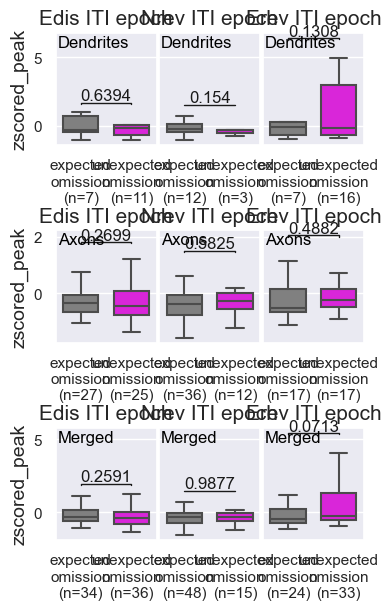

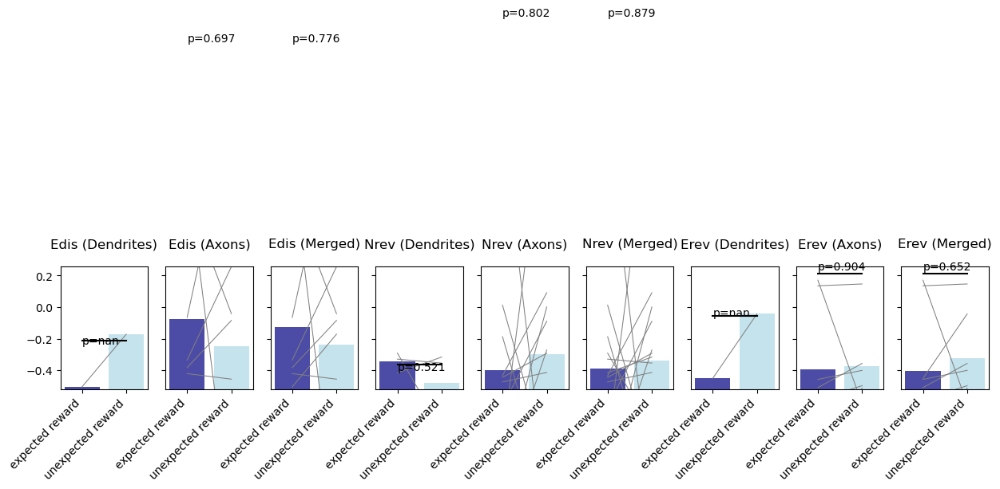

In [152]:
comparisons = [{'epoch':'responses', 'modulation':['all'], 't1':'expected omission', 't2':'unexpected omission'}]

# specific_IDs = ['RGECO_GCamP_Batch1_four','RGECO_GCamP_Batch1_muji','RGECO_GCamP_Batch3_muji','RGECO_GCamP_Batch3_one']
# cohort_deltaF = cohort_deltaF[cohort_deltaF.index.get_level_values(0).isin(specific_IDs)]

metric = 'zscored_peak'
channels = ['Red','Green']
modulation_protocols = ['Edis','Nrev','Erev']
reverse = False
active_ROIs = False
ttest = 'parametric'
welch = True
merged = True
figsize = (1.9897*2, 2.1987*3)
remove_labels = False
analysis_epoch = 'reward'
ylim = False#[-0.025,1.5]
score_by = 'reward'
score_data = 'ROI-by-ROI'
score_metric = 'events'

score_type = 'norm' if 'normalized' in metric else 'zscore' if 'zscored' in metric else 'raw'
for c in [0.9]:#np.linspace(0.855, 0.87, 4):
    pairwise_cutoff = c
    cutoff_on = 'maxes'
    nbins = 20
    filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
    correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
    dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]

    for std in [0]:#np.linspace(0, 0.07, 8):
#         print(f'correlation thresh: {c}')
#         print(f'modulation thresh: {std}')
        mods, lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs, rew_negative_neutral_ROIs = event_based_MI(cohort_epochs, 3, std)
        
        include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                'correlated_ROIs':correlated_ROI_list,
                'uncorrelated_ROIs':dual_imaging_uncorrelated_ROIs,
                'lick_positive_ROIs':lick_positive_ROIs,
                'rew_positive_ROIs':rew_positive_ROIs,
                'rew_negative_ROIs':rew_negative_ROIs}
        for analysis_epoch in ['ITI']:
            score_by = analysis_epoch
            for ROI_label in ['correlated_ROIs']:
                print(f'{analysis_epoch} {ROI_label}')
                ROIs_to_include = include_ROI_dict[ROI_label]#[x for x in valid_ROIs if ('Red' in x) | (('Green' in x) & (x in include_ROI_dict['correlated_ROIs']))]
        #         ROIs_to_include = [x for x in ROIs_to_include if x in dual_imaging_ROIs]

                metrics_modulated = generate_metrics_modulated(comparisons, cohort_epochs, metric, channels, modulation_protocols, analysis_epoch, score_by, score_data, score_metric, score_type, active_ROIs=active_ROIs, reverse=reverse, specific_IDs = ROIs_to_include)
                metrics_modulated = merge_final_metrics(metrics_modulated) if merged == True else metrics_modulated
        #         sns.reset_defaults()
                fig = plot_box_plots(metrics_modulated, analysis_epoch, ttest, figsize, metric, welch, merged, ylim=ylim, remove_labels=remove_labels)
                sns.reset_defaults()
                fig = plot_paired(metrics_modulated, metric, merged)
                plt.show()
        #         fig.savefig('{}\\{}_{}_{}_{}_{}_{}_{}_paired_plots.svg'.format(data_directory,
        #                                                   metric,
        #                                                   epoch,
        #                                                   ROIs_label,   
        #                                                   ('_vs_').join(list(trialtypes.keys())),
        #                                                   ('_').join([item for sublist in protocol_list for item in sublist]),
        #                                                   ttest,
        #                                                   'welch' if welch == True else 'unwelched'),
        #             bbox_inches=0, pad_inches=0)

reward ALL_ROIs


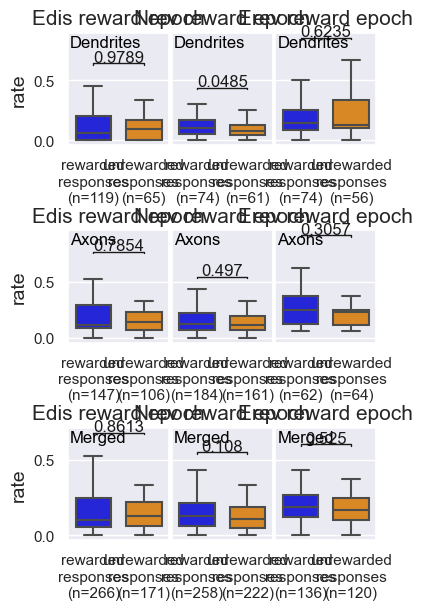

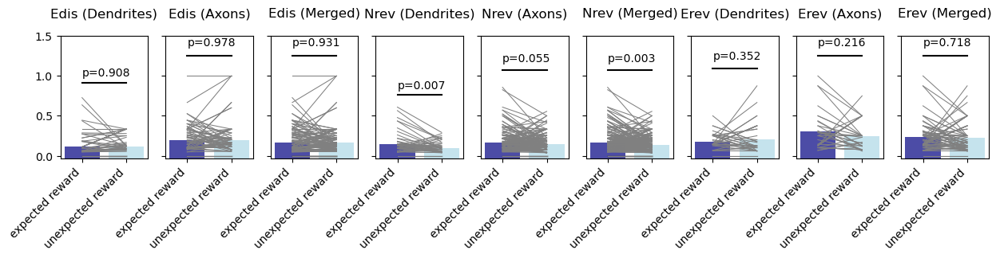

In [326]:
comparisons = [{'epoch':'responses', 'modulation':['all'], 't1':'expected outcomes', 't2':'unexpected outcomes'}]

# specific_IDs = ['RGECO_GCamP_Batch1_four','RGECO_GCamP_Batch1_muji','RGECO_GCamP_Batch3_muji','RGECO_GCamP_Batch3_one']
# cohort_deltaF = cohort_deltaF[cohort_deltaF.index.get_level_values(0).isin(specific_IDs)]

metric = 'rate'
channels = ['Red','Green']
modulation_protocols = ['Edis','Nrev','Erev']
reverse = False
active_ROIs = False
ttest = 'non-parametric'
welch = True
merged = True
figsize = (1.9897*2, 2.1987*3)
remove_labels = False
analysis_epoch = 'reward'
ylim = False#[-0.025,1.5]
score_by = 'reward'
score_data = 'ROI-by-ROI'
score_metric = 'events'

score_type = 'norm' if 'normalized' in metric else 'zscore' if 'zscored' in metric else 'raw'
for c in [0.9]:#np.linspace(0.855, 0.87, 4):
    pairwise_cutoff = c
    cutoff_on = 'maxes'
    nbins = 20
    filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
    correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
    dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]

    for std in [0]:#np.linspace(0, 0.07, 8):
#         print(f'correlation thresh: {c}')
#         print(f'modulation thresh: {std}')
        mods, lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs, rew_negative_neutral_ROIs = event_based_MI(cohort_epochs, 3, std)
        
        include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                'correlated_ROIs':correlated_ROI_list,
                'uncorrelated_ROIs':dual_imaging_uncorrelated_ROIs,
                'lick_positive_ROIs':lick_positive_ROIs,
                'rew_positive_ROIs':rew_positive_ROIs,
                'rew_negative_ROIs':rew_negative_ROIs}
        for analysis_epoch in ['reward','delayed_reward','early_post_reward','post_reward','ITI']:
            for ROI_label in ['ALL_ROIs','correlated_ROIs']:
                print(f'{analysis_epoch} {ROI_label}')
                ROIs_to_include = include_ROI_dict[ROI_label]#[x for x in valid_ROIs if ('Red' in x) | (('Green' in x) & (x in include_ROI_dict['correlated_ROIs']))]
        #         ROIs_to_include = [x for x in ROIs_to_include if x in dual_imaging_ROIs]

                metrics_modulated = generate_metrics_modulated(comparisons, cohort_epochs, metric, channels, modulation_protocols, analysis_epoch, score_by, score_data, score_metric, score_type, active_ROIs=active_ROIs, reverse=reverse, specific_IDs = ROIs_to_include)
                metrics_modulated = merge_final_metrics(metrics_modulated) if merged == True else metrics_modulated
        #         sns.reset_defaults()
                fig = plot_box_plots(metrics_modulated, analysis_epoch, ttest, figsize, metric, welch, merged, ylim=ylim, remove_labels=remove_labels)
                sns.reset_defaults()
                fig = plot_paired(metrics_modulated, metric, merged)
                plt.show()
        #         fig.savefig('{}\\{}_{}_{}_{}_{}_{}_{}_paired_plots.svg'.format(data_directory,
        #                                                   metric,
        #                                                   epoch,
        #                                                   ROIs_label,   
        #                                                   ('_vs_').join(list(trialtypes.keys())),
        #                                                   ('_').join([item for sublist in protocol_list for item in sublist]),
        #                                                   ttest,
        #                                                   'welch' if welch == True else 'unwelched'),
        #             bbox_inches=0, pad_inches=0)

In [ ]:
for roi in rew_deltaF.index.get_level_values('Unique_ROI'):
    roi_df = rew_deltaF[rew_deltaF.index.get_level_values('Unique_ROI') == roi]
    
    col = 0
    for water, rew in zip([float(1), float(0)],['rewarded','unrewarded']):
        color = 'dodgerblue' if rew == 'rewarded' else 'magenta'
        for protocol in ['Edis','Erev']:    

In [324]:
print(final_metric_df['Erev']['rewarded responses']['Red'].mean())
print(final_metric_df['Erev']['rewarded responses']['Red'].sem())
print(final_metric_df['Erev']['rewarded responses']['Red'].dropna().shape)

print(final_metric_df['Erev']['unrewarded responses']['Red'].mean())
print(final_metric_df['Erev']['unrewarded responses']['Red'].sem())
print(final_metric_df['Erev']['unrewarded responses']['Red'].dropna().shape)

NameError: name 'final_metric_df' is not defined

In [357]:
from scipy.stats import linregress, pearsonr, spearmanr
def plot_bestfit_line(x,y,ax_obj):
    slope = linregress(x,y).slope #calculate slope of line
    intercept = linregress(x,y).intercept #calculate intercept of line
    
    xvalues = np.linspace(np.min(x), np.max(x), 100) #create an array of length 100 between the minimum and maximum x-values
    yvalues = xvalues*slope + intercept #evaluate the y-values at each of the x-values defined above
    ax_obj.plot(xvalues, yvalues, color='black', lw=3) #plot the line of x-values vs. y values to specified axes object

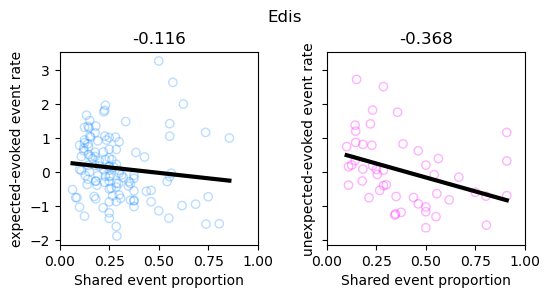

Edis
0.206
0.009



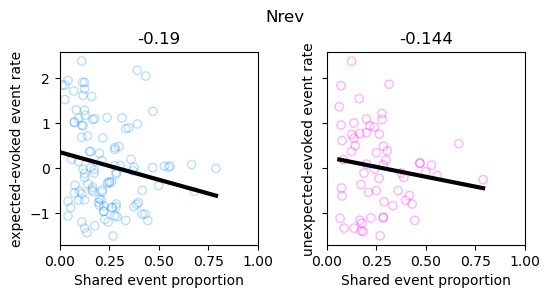

Nrev
0.048
0.263



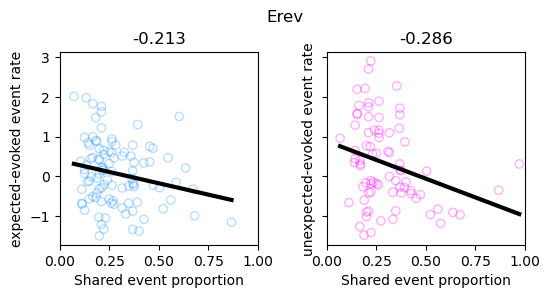

Erev
0.033
0.011



In [444]:
ratio_df = filtered_ROI_dfs['Green']

for protocol in ['Edis','Nrev','Erev']:
    fig, ax = plt.subplots(nrows=1, ncols=2,
                           figsize=(6,2.5),
                           sharex=True, sharey=True,
                           gridspec_kw={'wspace':0.35})
    fig.suptitle(protocol, y=1.05)
    
    protocol_ratios = ratio_df[(ratio_df.index.get_level_values(1).str.contains(protocol))]
    rew_rate = metrics_modulated[protocol]['expected outcomes']['Green']
    omit_rate = metrics_modulated[protocol]['unexpected outcomes']['Green']
    
    rew_x = []
    omit_x = []
    rew_y = []
    omit_y = []
    MI_x = []
    MI_y = []
    for index, rows in protocol_ratios.iterrows():
        roi = index[1]
        if (roi in rew_rate.keys()) & (roi in omit_rate.keys()):
            roi_proportion = float(protocol_ratios[protocol_ratios.index.get_level_values(1) == roi][0])
            roi_rew = rew_rate[roi]
            if np.isnan(roi_rew) == False:
                ax[0].scatter(roi_proportion, roi_rew,
                              facecolor='None',edgecolor='dodgerblue',
                              alpha=0.3)
                ax[0].set_ylabel('expected-evoked event rate')
                rew_y.append(roi_rew)
                rew_x.append(roi_proportion)

            roi_omit = omit_rate[roi]
            if np.isnan(roi_omit) == False:
                ax[1].scatter(roi_proportion, roi_omit,
                              facecolor='None',edgecolor='magenta',
                              alpha=0.3)
                ax[1].set_ylabel('unexpected-evoked event rate')   
                omit_y.append(roi_omit)
                omit_x.append(roi_proportion)
                
#             roi_MI = (roi_rew - roi_omit) / (roi_rew + roi_omit)
#             if (np.isnan(roi_MI) == False):                
#                 ax[2].scatter(roi_proportion, roi_MI,
#                               facecolor='None',edgecolor='navy',
#                               alpha=0.3)                
#                 ax[2].set_ylabel('reward event MI')
#                 MI_y.append(roi_MI)
#                 MI_x.append(roi_proportion)
                
    rew_r = round(pearsonr(rew_x, rew_y)[0],3)
    ax[0].set_title(rew_r)
    plot_bestfit_line(rew_x, rew_y, ax[0])

    omit_r = round(pearsonr(omit_x, omit_y)[0],3)
    ax[1].set_title(omit_r)
    plot_bestfit_line(omit_x, omit_y, ax[1])    

#     MI_r = round(pearsonr(MI_x, MI_y)[0],3)
#     ax[2].set_title(MI_r)
#     plot_bestfit_line(MI_x, MI_y, ax[2])  

    for col in range(2):
        ax[col].set_xlabel('Shared event proportion')
        ax[col].set_xlim(0,1)
    plt.show()
    print(protocol)
    print(round(pearsonr(rew_x, rew_y)[1],3))
    print(round(pearsonr(omit_x, omit_y)[1],3))
    print()

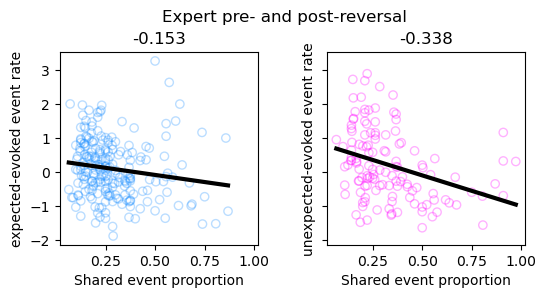

0.023
0.0


In [445]:
ratio_df = filtered_ROI_dfs['Green']
fig, ax = plt.subplots(nrows=1, ncols=2,
                       figsize=(6,2.5),
                       sharex=True, sharey=True,
                       gridspec_kw={'wspace':0.35})
fig.suptitle('Expert pre- and post-reversal', y=1.05)

rew_x = []
omit_x = []
rew_y = []
omit_y = []
MI_x = []
MI_y = []
for protocol in ['Edis','Erev']:

    
    protocol_ratios = ratio_df[(ratio_df.index.get_level_values(1).str.contains(protocol))]
    rew_rate = metrics_modulated[protocol]['expected outcomes']['Green']
    omit_rate = metrics_modulated[protocol]['unexpected outcomes']['Green']
    

    for index, rows in protocol_ratios.iterrows():
        roi = index[1]
        if (roi in rew_rate.keys()) & (roi in omit_rate.keys()):
            roi_proportion = float(protocol_ratios[protocol_ratios.index.get_level_values(1) == roi][0])
            roi_rew = rew_rate[roi]
            if np.isnan(roi_rew) == False:
                ax[0].scatter(roi_proportion, roi_rew,
                              facecolor='None',edgecolor='dodgerblue',
                              alpha=0.3)
                ax[0].set_ylabel('expected-evoked event rate')
                rew_y.append(roi_rew)
                rew_x.append(roi_proportion)

            roi_omit = omit_rate[roi]
            if np.isnan(roi_omit) == False:
                ax[1].scatter(roi_proportion, roi_omit,
                              facecolor='None',edgecolor='magenta',
                              alpha=0.3)
                ax[1].set_ylabel('unexpected-evoked event rate')   
                omit_y.append(roi_omit)
                omit_x.append(roi_proportion)
                
#             roi_MI = (roi_rew - roi_omit) / (roi_rew + roi_omit)
#             if (np.isnan(roi_MI) == False):                
#                 ax[2].scatter(roi_proportion, roi_MI,
#                               facecolor='None',edgecolor='navy',
#                               alpha=0.3)                
#                 ax[2].set_ylabel('reward event MI')
#                 MI_y.append(roi_MI)
#                 MI_x.append(roi_proportion)
                
rew_r = round(pearsonr(rew_x, rew_y)[0],3)
ax[0].set_title(rew_r)
plot_bestfit_line(rew_x, rew_y, ax[0])

omit_r = round(pearsonr(omit_x, omit_y)[0],3)
ax[1].set_title(omit_r)
plot_bestfit_line(omit_x, omit_y, ax[1])    

# MI_r = round(pearsonr(MI_x, MI_y)[0],3)
# ax[2].set_title(MI_r)
# plot_bestfit_line(MI_x, MI_y, ax[2])  

for col in range(2):
    ax[col].set_xlabel('Shared event proportion')
plt.show()
print(round(pearsonr(rew_x, rew_y)[1],3))
print(round(pearsonr(omit_x, omit_y)[1],3))

In [71]:
from scipy.stats import ttest_rel
from scipy.stats import ttest_ind

## Individual event-by-event comparisons ##

0.864


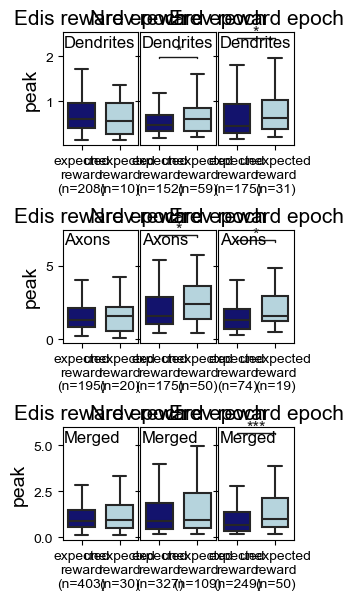

In [387]:
sns.reset_defaults()
epoch = 'reward'
trialtypes = {#'Hit':['rewarded hit','unrewarded hit'],
              #'Miss':['unrewarded miss','unrewarded miss'],
              #'FA':['rewarded FA','unrewarded FA'],
              #'CR':['unrewarded CR','unrewarded CR'],
              #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
              'responses':['rewarded hit','rewarded FA','unrewarded hit','unrewarded FA'],
              'no responses':['unrewarded miss','unrewarded CR'],
              #'rewarded responses':['rewarded hit','rewarded FA'],
              #'unrewarded responses':['unrewarded hit','unrewarded FA']
              'expected reward':['rewarded hit','rewarded hit'],
              'unexpected reward':['rewarded FA','rewarded FA'],
              #'expected omission':['unrewarded FA','unrewarded FA'],
              #'unexpected omission':['unrewarded hit','unrewarded hit'],
              #'expected outcomes':['rewarded hit','unrewarded FA'],
              #'unexpected outcomes':['unrewarded hit','rewarded FA'],
             }
ttest = 'parametric'
welch = False
ROIs_label = 'correlated_ROIs'
protocol_list = [['Edis'],['Nrev'],['Erev']]
metric = 'peak'
scale_by = 'all'
figsize = (1.9897*1.5, 2.1987*3)
ylim = False#[0,2]
remove_labels = False

## Clean up event metrics ##
scale_type = 'norm' if 'normalized' in metric else 'zscore' if 'zscored' in metric else 'raw'
epoch_events = centre_and_scale(epoch, scale_by, scale_type)

for c in [0.864]:#np.linspace(0.8, 0.95, 16):
    print(c)
    pairwise_cutoff = c
    cutoff_on = 'maxes'
    nbins = 20
    
    filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
    correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
    dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]
    
    mods, lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs, rew_negative_neutral_ROIs = event_based_MI(cohort_epochs, 3, 0.005)
    
    include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                    'correlated_ROIs':correlated_ROI_list,
                    'uncorrelated_ROIs':dual_imaging_uncorrelated_ROIs,
                    'lick_positive_ROIs':lick_positive_ROIs,
                    'rew_positive_ROIs':rew_positive_ROIs,
                    'rew_negative_ROIs':rew_negative_ROIs}
    ROIs_to_include = [x for x in valid_ROIs if ('Red' in x) | (('Green' in x) & (x in include_ROI_dict[ROIs_label]))]
    ROIs_events = epoch_events[epoch_events['Unique_ROI'].isin(ROIs_to_include)]
    
    individual_metric = {}
    for protocols in protocol_list:
        protocol_label = ('_').join(protocols)
        individual_metric[protocol_label] = {}
        protocol_events = ROIs_events[ROIs_events.Protocol.isin(protocols)]
        
        for ttype, ttype_list in trialtypes.items():
            individual_metric[protocol_label][ttype] = {}
            individual_metric[protocol_label][ttype]['merged'] = {}
            individual_metric[protocol_label][ttype]['Red'] = {}
            individual_metric[protocol_label][ttype]['Green'] = {}
            t_list = []
            for t in ttype_list:
                t_list.append('Tactile '+t)
                t_list.append('Auditory '+t)
            ttype_events = protocol_events[protocol_events['Final Outcome'].isin(t_list)]
            
            for i, (index, event) in enumerate(ttype_events.iterrows()):
                ROI = event['Unique_ROI']
                trial = event['Trial']
                event_label = f'event{i}_{ROI}_trial_{trial}'
                individual_metric[protocol_label][ttype]['merged'][event_label] = event[metric]
                
                if 'Red' in event['Unique_ROI']:
                    individual_metric[protocol_label][ttype]['Red'][event_label] = event[metric]
                
                if 'Green' in event['Unique_ROI']:
                    individual_metric[protocol_label][ttype]['Green'][event_label] = event[metric]
    individual_metric_df = combine_final_metrics(individual_metric, metric)
#     individual_metric = normalize_across_protocols(individual_metric_df)
    sns.reset_defaults()
    fig = plot_box_plots(individual_metric, epoch, ttest, figsize, metric, welch, ylim=ylim, remove_labels=remove_labels)#, manual_color='grey')
    fig.savefig('{}\\{}_{}_{}_{}_{}_{}_{}_boxplots.svg'.format(data_directory,
                                                      metric,
                                                      epoch,
                                                      ROIs_label,   
                                                      ('_vs_').join(list(trialtypes.keys())),
                                                      ('_').join([item for sublist in protocol_list for item in sublist]),
                                                      ttest,
                                                      'welch' if welch == True else 'unwelched'),
                bbox_inches=0, pad_inches=0)

0.9


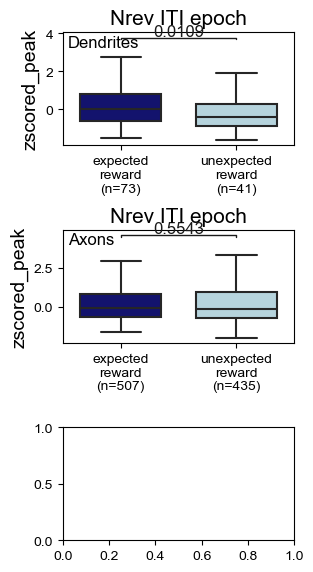

In [137]:
sns.reset_defaults()
epoch = 'ITI'
trialtypes = {#'Hit':['rewarded hit','unrewarded hit'],
              #'Miss':['unrewarded miss','unrewarded miss'],
              #'FA':['rewarded FA','unrewarded FA'],
              #'CR':['unrewarded CR','unrewarded CR'],
              #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
              #'responses':['rewarded hit','rewarded FA','unrewarded hit','unrewarded FA'],
              #'no responses':['unrewarded miss','unrewarded CR'],
              #'rewarded responses':['rewarded hit','rewarded FA'],
              #'unrewarded responses':['unrewarded hit','unrewarded FA']
              'expected reward':['rewarded hit','rewarded hit'],
              'unexpected reward':['rewarded FA','rewarded FA'],
              #'expected omission':['unrewarded FA','unrewarded FA'],
              #'unexpected omission':['unrewarded hit','unrewarded hit'],
              #'expected outcomes':['rewarded hit','unrewarded FA'],
              #'unexpected outcomes':['unrewarded hit','rewarded FA'],
             }
ttest = 'parametric'
welch = True
ROIs_label = 'ALL_ROIs'
protocol_list = [['Nrev']]
merged = False
figsize = (1.9897*1.5, 2.1987*3)
ylim = False#[0,2]
remove_labels = False

## Clean up event metrics ##
metric = 'zscored_peak'
score_by = 'ITI'
score_data = 'ROI-by-ROI'
score_metric = 'events'
score_type = 'norm' if 'normalized' in metric else 'zscore' if 'zscored' in metric else 'raw'
epoch_events = centre_and_scale(epoch, score_by, score_data, score_metric, score_type)

for c in [0.9]:#np.linspace(0.8, 0.95, 16):
    print(c)
    pairwise_cutoff = c
    cutoff_on = 'maxes'
    nbins = 20
    
    filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
    correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
    dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]
    
    mods, lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs, rew_negative_neutral_ROIs = event_based_MI(cohort_epochs, 3, 0.005)
    
    include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                    'correlated_ROIs':correlated_ROI_list,
                    'uncorrelated_ROIs':dual_imaging_uncorrelated_ROIs,
                    'lick_positive_ROIs':lick_positive_ROIs,
                    'rew_positive_ROIs':rew_positive_ROIs,
                    'rew_negative_ROIs':rew_negative_ROIs}
    ROIs_to_include = include_ROI_dict[ROIs_label]#[x for x in valid_ROIs if ('Red' in x) | (('Green' in x) & (x in include_ROI_dict[ROIs_label]))]
    ROIs_events = epoch_events[epoch_events['Unique_ROI'].isin(ROIs_to_include)]
    
    individual_metric = {}
    for protocols in protocol_list:
        protocol_label = ('_').join(protocols)
        individual_metric[protocol_label] = {}
        protocol_events = ROIs_events[ROIs_events.Protocol.isin(protocols)]
        
        for ttype, ttype_list in trialtypes.items():
            individual_metric[protocol_label][ttype] = {}
#             individual_metric[protocol_label][ttype]['merged'] = {}
            individual_metric[protocol_label][ttype]['Red'] = {}
            individual_metric[protocol_label][ttype]['Green'] = {}
            t_list = []
            for t in ttype_list:
                t_list.append('Tactile '+t)
                t_list.append('Auditory '+t)
            ttype_events = protocol_events[protocol_events['Final Outcome'].isin(t_list)]
            
            for i, (index, event) in enumerate(ttype_events.iterrows()):
                ROI = event['Unique_ROI']
                trial = event['Trial']
                event_label = f'event{i}_{ROI}_trial_{trial}'
#                 individual_metric[protocol_label][ttype]['merged'][event_label] = event[metric]
                
                if 'Red' in event['Unique_ROI']:
                    individual_metric[protocol_label][ttype]['Red'][event_label] = event[metric]
                
                if 'Green' in event['Unique_ROI']:
                    individual_metric[protocol_label][ttype]['Green'][event_label] = event[metric]
    individual_metric_df = combine_final_metrics(individual_metric, metric)
#     individual_metric = normalize_across_protocols(individual_metric_df)
    sns.reset_defaults()
    fig = plot_box_plots(individual_metric, epoch, ttest, figsize, metric, welch, merged, ylim=ylim, remove_labels=remove_labels)#, manual_color='grey')
#     fig.savefig('{}\\{}_{}_{}_{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                       metric,
#                                                       epoch,
#                                                       ROIs_label,   
#                                                       ('_vs_').join(list(trialtypes.keys())),
#                                                       ('_').join([item for sublist in protocol_list for item in sublist]),
#                                                       ttest,
#                                                       'welch' if welch == True else 'unwelched'),
#                 bbox_inches=0, pad_inches=0)

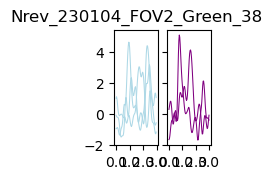

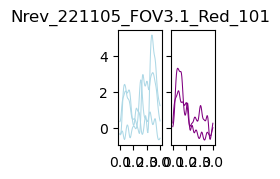

In [141]:
all_deltaF_df = pd.concat(cohort_epochs['deltaF']['all'])
all_deltaF_df = fn.reverse_outcome_indexes(all_deltaF_df, 'deltaF', reversed_sessions)
all_deltaF_df = all_deltaF_df.groupby(all_deltaF_df.index.get_level_values('Unique_ROI')).apply(zscore)
peaks = pd.concat(cohort_epochs['events']['all']).reset_index().set_index(['level_0','Unique_ROI','Trial'])[['peak_time','peak']]
ROIs = list(set([('_').join(x.split('_')[1:6]) for x in individual_metric_df.index]))
sns.reset_defaults()

# for protocol in ['Edis','Erev']:
#     protocol_df = individual_metric_df.T[individual_metric_df.T.index.get_level_values(0) == protocol]
#     for channel in ['Red','Green']:
#         channel_df = protocol_df[protocol_df.index.get_level_values(2) == channel].T
#         sns.reset_defaults()
for ROI in ['Nrev_230104_FOV2_Green_38','Nrev_221105_FOV3.1_Red_101']:#ROIs:#['Edis_230104_FOV1.1_Red_38','Edis_221104_FOV3.2_Green_164','Erev_230105_FOV6.2_Red_2','Erev_221230_FOV3.1_Green_10']):#['Erev_221230_FOV3.2_Green_59','Edis_230103_FOV2.3_Green_2','Erev_230105_FOV6.2_Red_2','Erev_230108_FOV1.1_Green_600']):#['Edis_230103_FOV2.1_Green',  'Erev_230108_FOV1.1_Red','Edis_230104_FOV1.1_Green' , 'Erev_230108_FOV1.1_Green']):#FOVs:
    protocol = ROI.split('_')[0]
    channel = ROI.split('_')[-2]
    protocol_df = individual_metric_df.T[individual_metric_df.T.index.get_level_values(0) == protocol]
    channel_df = protocol_df[protocol_df.index.get_level_values(2) == channel].T

    ROI_df = channel_df[channel_df.index.str.contains(ROI)]
    t1 = ROI_df.iloc[:,0].dropna()
    t2 = ROI_df.iloc[:,1].dropna()

    if (len(t1) > 2) & (len(t2) > 2):
        fig, ax = plt.subplots(nrows=1, ncols=2,
                               sharey='row', sharex=False,
                                figsize=(1.25,1.5))
        for col, (t) in enumerate([t1, t2]):  
            color = 'lightblue' if col == 0 else 'purple'
            trials = [int(x.split('_')[-1]) for x in t.index]

            peri_arrays = []
            used_trials = []
            for trial in trials:
                trial_df = all_deltaF_df[(all_deltaF_df.index.get_level_values('Unique_ROI') == ROI) &
                              (all_deltaF_df.index.get_level_values('Trial') == trial)]

                ID = trial_df.index.get_level_values(0)[0]
                reward_time = [math.floor(int(x)/1000*30.42) if x != '-' else math.floor(8*30.42) for x in trial_df.index.get_level_values('Timeout_end')]
                trial_arrays = trial_df.to_numpy()
                ROI_arrays = np.array(trial_df.index.get_level_values('Unique_ROI'))
                for i, (array, rew, roi) in enumerate(zip(trial_arrays, reward_time, ROI_arrays)):
                    peri_reward = array[rew:rew+90]
#                             try:
#                                 tpeak = peaks[(peaks.index.get_level_values('Unique_ROI') == roi) &
#                                               (peaks.index.get_level_values('Trial') == trial) &
#                                               (peaks.index.get_level_values('level_0') == ID)
#                                              ].iloc[i,:]
#                                 amp = float(tpeak['peak'])
#                                 time = float(tpeak['peak_time']*30.42)
#                                 ax[col].scatter(time, amp, marker='*', color='black')
#                             except IndexError:
#                                 print(f'Event number {i+1} not found for {ROI} trial {trial}')

                    if trial not in used_trials:
                        peri_arrays.append(peri_reward)
                        ax[col].plot(peri_reward, color=color, alpha=1, lw=0.75)
                        used_trials.append(trial)
            mean = np.mean(np.array(peri_arrays), axis=0)
            std = np.std(np.array(peri_arrays), axis=0)
            sem = std / np.sqrt(np.array(peri_arrays).shape[0])
#             ax[col].plot(mean, color=color, lw=3)
#             ax[col].fill_between(list(range(mean.shape[0])), y1=mean-sem, y2=mean+sem, color=color, alpha=0.3)                           
            ax[col].set_xticks(np.linspace(0,90,4))
            ax[col].set_xticklabels([str(x) for x in np.linspace(0,3,4)])
            ax[col].set_title(ROI) if col == 0 else None
        plt.show()
        fig.savefig(os.path.join(data_directory, ROI+'_overlaid_traces_expected_reward_vs_unexpected_reward_ZOOMED.svg'))

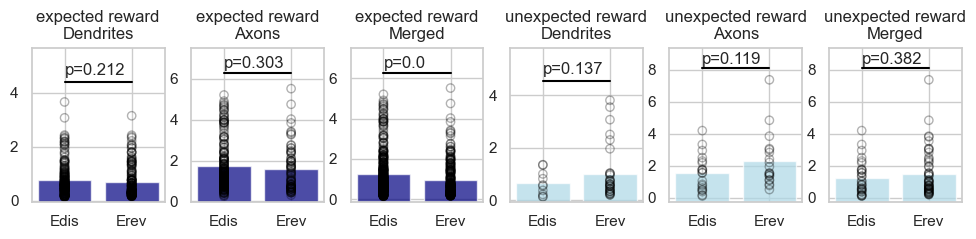

In [381]:
welch = True

equal_var = True if welch == False else False
final_metric_df = combine_final_metrics(individual_metric, metric)
fig, ax = plt.subplots(nrows=1, ncols=6,
                       figsize=(12,2),
                       sharey=False)
col = 0
for ttype in ['expected reward','unexpected reward']:
    color = 'navy' if ttype == 'expected reward' else 'lightblue'
    for compartment in ['Red','Green','merged']:
        comp = 'Dendrites' if compartment == 'Red' else 'Axons' if compartment == 'Green' else 'Merged'
        unpaired = final_metric_df.T[(final_metric_df.T.index.get_level_values(1) == ttype) &
                                     (final_metric_df.T.index.get_level_values(2) == compartment)].T
        p = round(ttest_ind(unpaired.iloc[:,0].dropna(), 
                            unpaired.iloc[:,1].dropna(),
                            equal_var=equal_var).pvalue,3)
        for index, rows in unpaired.iterrows():
            ax[col].scatter([0, 1], [rows[0], rows[1]], edgecolor='black', facecolor='None', alpha=0.3, zorder=2)
        ax[col].bar(0, unpaired.iloc[:,0].mean()-ax[col].get_ylim()[0], bottom=ax[col].get_ylim()[0], color=color, alpha=0.7, zorder=1)
        ax[col].bar(1, unpaired.iloc[:,1].mean()-ax[col].get_ylim()[0], bottom=ax[col].get_ylim()[0], color=color, alpha=0.7, zorder=1)
        ax[col].set_xticks([0,1])
        ax[col].set_xticklabels(['Edis', 'Erev'])
        ax[col].set_title(f'{ttype}\n{comp}')
        ax[col].plot([0,1], [unpaired.max().max()+0.75, unpaired.max().max()+0.75], color='black')
        ax[col].text(x=0, y=unpaired.max().max()+1, s=f'p={p}')
        ax[col].set_ylim(ax[col].get_ylim()[0],unpaired.max().max()+2)
        col += 1
plt.show()

0.9


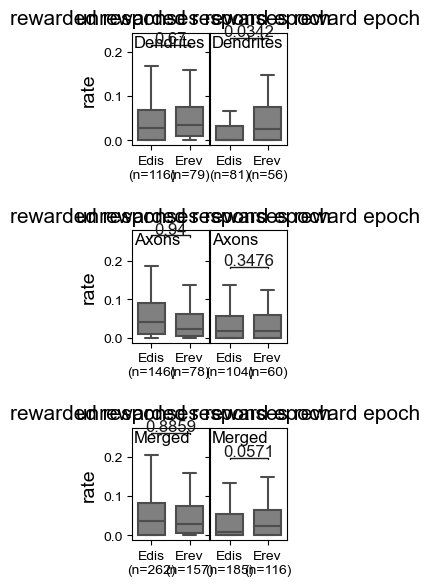

In [38]:
for c in [0.9]:#
    print(c)
    pairwise_cutoff = c
    cutoff_on = 'maxes'
    nbins = 20
    filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
    correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
    dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]
    
    include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                    'correlated_ROIs':correlated_ROI_list,
                    'uncorrelated_ROIs':dual_imaging_uncorrelated_ROIs,
#                     'lick_positive_ROIs':lick_positive_ROIs,
#                     'rew_positive_ROIs':rew_positive_ROIs,
#                     'rew_negative_ROIs':rew_negative_ROIs
                       }
    ttest = 'parametric'
    welch = False
    merged = True
    ROIs_label = 'ALL_ROIs'
    norm = 'raw'
    figsize = (1.9897*1, 2.1987*3)
    ylim = False#[-0.025,1.5]
    metric = 'rate'   
    ROIs_to_include = include_ROI_dict[ROIs_label]
    
    for protocols in [[['Edis'],['Erev']]]:    
        final_metrics = {}
        for i, (epoch, trialtypes) in enumerate(zip(['reward'],
                                          [
                                           {'rewarded responses':['rewarded hit','rewarded FA'],
                                            'unrewarded responses':['unrewarded hit','unrewarded FA']}
                                           ])):
            active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
            epoch_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch, ROIs_to_include)
            final_metrics[epoch] = epoch_metric
            
        final_metric = {}
        for epoch_key, epoch_values in final_metrics.items():
            for protocol_key, protocol_values in epoch_values.items():
                for modulation_key, modulation_values in protocol_values.items():
                    new_key = f'{modulation_key} ({epoch_key})'
                    if protocol_key not in final_metric.keys():
                        final_metric[protocol_key] = {}
                        final_metric[protocol_key][modulation_key] = modulation_values
                    else:
                        final_metric[protocol_key][modulation_key] = modulation_values
        
        final_metric_df = combine_final_metrics(final_metric, metric)
        if norm == 'normalize_within':
            normalized_metrics = normalize_within_protocols(final_metric_df)
            final_data = normalized_metrics
            manual_color = 'grey'
        elif norm == 'normalize_across':
            normalized_metrics = normalize_across_protocols(final_metric_df)
            final_data = normalized_metrics
            manual_color = 'grey'
        else:
            final_data = raw_across_protocols(final_metric_df)
            manual_color = 'grey'
        final_data = merge_final_metrics(final_data)    
    #     all_comparisons.append(final_metric_df)
        sns.reset_defaults()
        fig = plot_box_plots(final_data, epoch, ttest, figsize, metric, welch, merged, ylim, remove_labels=False, fliers=False, manual_color=manual_color)
#         fig.savefig('{}\\{}_{}_{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                       epoch,
#                                                       ('_vs_').join(list(trialtypes.keys())),
#                                                       ('_').join([item for sublist in protocols for item in sublist]),
#                                                       ttest,
#                                                       ROIs_label,
#                                                       norm),
#                 bbox_inches=0, pad_inches=0)
    # all_comparisons_df = pd.concat(all_comparisons, axis=1)
    # save_df = all_comparisons_df.T.drop_duplicates().T
    # save_df = save_df.swaplevel(0,2, axis=1).swaplevel(1,2, axis=1).T.sort_index(0).T.droplevel(3, axis=1)
    # save_df.to_csv(os.path.join(data_directory, f'{epoch}_{ttest}_{metric}_{ROIs_label}.csv'))

    # fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
    #                                                   epoch,
    #                                                   ('_vs_').join(list(trialtypes.keys())),
    #                                                   ('_').join([item for sublist in protocols for item in sublist]),
    #                                                   ttest),
    #             bbox_inches=0, pad_inches=0)

In [135]:
for ttype, ttype_dict in final_data.items():
    print(ttype)
    for protocol, protocol_dict in ttype_dict.items():
        array = np.asarray([x for x in protocol_dict['Green'].values()])
        mean = round(np.mean((array[~np.isnan(array)])),3)
        std = np.std((array[~np.isnan(array)]))
        n = len(array[~np.isnan(array)])
        sem = round((std / np.sqrt(n)),3)
        
        print(f'{protocol}:{mean} +/- {sem}, n={n}')
    print()

rewarded responses
Edis:0.146 +/- 0.014, n=146
Erev:0.087 +/- 0.016, n=78

unrewarded responses
Edis:0.095 +/- 0.014, n=104
Erev:0.075 +/- 0.02, n=60



In [78]:
protocol_names = {'Edis':'Expert Pre-reversal',
                 'Erev':'Expert Post-reversal',
                 #'Ndis':'Novice Pre-reversal',
                 #'Nrev':'Novice Post-reversal',
                 #'EdisErev':'Expert Pre- and Post-reversal'
                 }
trialtypes = {#'unexpected omission':['unrewarded hit','unrewarded hit'],
              #'expected omission':['unrewarded FA','unrewarded FA'],
              #'expected reward':['rewarded hit','rewarded hit'],
              #'unexpected reward':['rewarded FA','rewarded FA'],
              #'Hit':['rewarded hit','unrewarded hit'],
#               'Miss':['unrewarded miss','unrewarded miss'],
              #'False Alarm':['rewarded FA','unrewarded FA']#,
#               'Correct Rejections':['unrewarded CR','unrewarded CR']
              #'responses':['rewarded hit','rewarded FA','unrewarded hit','unrewarded FA'],
              #'no responses':['unrewarded CR','unrewarded miss'],
              'rewarded':['rewarded hit','rewarded FA'],
              'unrewarded':['unrewarded hit','unrewarded FA']
              }
protocols = [['Edis'],['Erev']]
channels = ['Green','Red']
sns.reset_defaults()
figsize = (1.6104*2, 1.5063)
for protocol in protocols:
    protocol_combined = ('').join(protocol)
    protocol_name = protocol_names[protocol_combined]
    protocol_df_raw = all_df[all_df.index.get_level_values('Protocol').isin(protocol)]
    protocol_df_z = zscored_df[zscored_df.index.get_level_values('Protocol').isin(protocol)]    
    for channel in channels:
        compartment = 'Dendrites' if channel == 'Red' else 'Axons'
        channel_raw = protocol_df_raw[protocol_df_raw.index.get_level_values('Channel') == channel]
        channel_z = protocol_df_z[protocol_df_z.index.get_level_values('Channel') == channel]
        for df, df_name in zip([channel_raw, channel_z],['raw','z-scored']):
            if df_name == 'raw':
                fig, ax = plt.subplots(nrows=1, ncols=len(trialtypes.keys()), figsize=figsize, sharey=True, gridspec_kw={'wspace':0.1})
                for col, (ttype, t_list) in enumerate(trialtypes.items()):
#                     text = 'Go' if ttype in ['unexpected omission','expected reward','Hit','Miss'] else 'NoGo'
#                     textcolor = 'navy' if text == 'Go' else 'grey'
                    ttype_df = df[(df.index.get_level_values('Final Outcome') == 'Tactile '+t_list[0]) |
                                  (df.index.get_level_values('Final Outcome') == 'Auditory '+t_list[0]) |
                                  (df.index.get_level_values('Final Outcome') == 'Tactile '+t_list[1]) |
                                  (df.index.get_level_values('Final Outcome') == 'Auditory '+t_list[1])]   
                    single_trial_FOV = ttype_df.groupby([ttype_df.index.get_level_values(0), 
                                                         ttype_df.index.get_level_values('Unique_trial'),
                                                         ttype_df.index.get_level_values('Water_time')]).mean()
                    if ttype not in  ['Miss','Correct Rejections','no responses']:
                        reward_times = np.asarray([float(x) for x in single_trial_FOV.index.get_level_values('Water_time')])
                        ax[col].axvline(reward_times.mean()/1000*30.3, color='green', alpha=0.5)
                        ax[col].axvline((reward_times.mean()-1000)/1000*30.3, color='darkorange', alpha=0.5)
                    for index, rows in single_trial_FOV.iterrows():
                        ax[col].plot(rows, color='black', alpha=0.1, linewidth=1)
#                     display(reward_times)
#                     display(single_trial_FOV.mean())
#                     ax[col].plot(single_trial_FOV.mean(), color=trace_colors[ttype], linewidth=2)
#                     ax[col].fill_between(list(range(single_trial_FOV.shape[1])), single_trial_FOV.mean()-single_trial_FOV.sem(), single_trial_FOV.mean()+single_trial_FOV.sem(), color=trace_colors[ttype], alpha=0.3)
#                     ntrials = single_trial_FOV.shape[0]
#                     ax[col].set_title(f'{ttype} ({ntrials} trials)', fontsize=10)
#                     ax[col].axvline(90, color='red', alpha=0.5)
#                     ax[col].set_xlim(7,(30.3*8)+7)
# #                     ax[col].set_ylim(-0.075,0.15)
#                     ylim = ax[col].get_ylim()[1]
# #                     ax[col].text(.02, .97, s=text, ha='left', va='top', transform=ax[col].transAxes, color=textcolor)
#                     ax[col].tick_params(
#                     axis='both',          # changes apply to the x-axis
#                     which='both',      # both major and minor ticks are affected
#                     bottom=False,      # ticks along the bottom edge are off
#                     top=False,         # ticks along the top edge are off
#                     labelbottom=False) # labels along the bottom edge are off
#                     ax[col].set_yticklabels([])
#                 fig.suptitle(f'{protocol_name} {compartment} ({df_name})', fontsize=15, y=1.2)
#                 fig.savefig('{}\\{}_population_traces_{}_{}.svg'.format(data_directory,
#                                                                         compartment,
#                                                                         ('_').join(protocol),
#                                                                         (' vs ').join(trialtypes.keys())
#                                                                        ),
#                            bbox_inches='tight', pad_inches=0)
plt.show()


NameError: name 'zscored_df' is not defined

## nEvents/nROIs metric with trial as UOA (i.e. each trial is a sample) ??? ##


**Stimulus-evoked activity is greater on the Go stimulus?**
- Might be more convincing if stimulus and response period combined together --> tested this (same trends as stimulus only)
- Same trends (even more miss-evoked activity) if only looking at response period
- Comparisons not statistically significant in the end, no matter how I combined trialtypes or protocols together

1. Seems like novice axons don't care about stimulus
2. Novice dendrites intially just care about whether they gonna respond or not (i.e. pre-reversal) but during reversal learning (novice) they still seem to be stuck in expert pre-reversal state where FA > Hit (i.e. Hit > FA in the previous state)
3. Post-reversal (i.e.expert), there is not much going on in the way of prediction-error in the way of stimulus-evoked activity in dendrites but the axons show strong false alarm-evoked activity, perhaps reflecting a self-realization of an error. This fits in nicely with its strong reward-evoked activity on unexpected rewards on these same trials/sessions
4. Response period seems to relate to reward anticipation in the dendrites (Go > NoGo but not Hit > FA unfortunately) in every case except for the axons post-reversal (they instead seem to generically encode licking vs. not licking)

In [379]:
for protocol in ['Edis','Erev']:
    phase = 'Pre-reversal' if protocol == 'Edis' else 'Post-reversal'
#     for channel in ['Red','Green']:
    compartment = 'ROIs'#'dendrites' if channel == 'Red' else 'axons'
    lick = [x for x in lick_positive_ROIs if (protocol in x)]# & (channel in x)]
    rew = [x for x in rew_positive_ROIs if (protocol in x)]# & (channel in x)]
    corr = [x for x in correlated_ROI_list if (protocol in x)]# & (channel in x)]
    uncorr = [x for x in dual_imaging_uncorrelated_ROIs if (protocol in x)]# & (channel in x)]

    for m, m_list in zip([f'lick +ve {compartment}',f'rew +ve {compartment}'],[lick, rew]):
        for c, c_list in zip([f'correlated {compartment}',f'uncorrelated {compartment}'],[corr, uncorr]):
            intersect = [x for x in c_list if x in m_list]
            ratio = len(intersect)/len(c_list)
            print(f'{phase}, {ratio} of {c} are {m}')
        print()

Pre-reversal, 0.17886178861788618 of correlated ROIs are lick +ve ROIs
Pre-reversal, 0.13414634146341464 of uncorrelated ROIs are lick +ve ROIs

Pre-reversal, 0.21138211382113822 of correlated ROIs are rew +ve ROIs
Pre-reversal, 0.23780487804878048 of uncorrelated ROIs are rew +ve ROIs

Post-reversal, 0.26143790849673204 of correlated ROIs are lick +ve ROIs
Post-reversal, 0.14035087719298245 of uncorrelated ROIs are lick +ve ROIs

Post-reversal, 0.13725490196078433 of correlated ROIs are rew +ve ROIs
Post-reversal, 0.20175438596491227 of uncorrelated ROIs are rew +ve ROIs



In [396]:
for protocol in ['Ndis','Nrev','Edis','Erev']:
    phase = 'Pre-reversal' if protocol == 'Edis' else 'Post-reversal'
    for channel in ['Red']:
        compartment = 'dendrites' if channel == 'Red' else 'axons'
        lick = [x for x in correct_response_ROIs if (protocol in x) & (channel in x)]
        rew = [x for x in unexpected_reward_ROIs if (protocol in x) & (channel in x)]
        corr = [x for x in correlated_ROI_list if (protocol in x) & (channel in x)]
        uncorr = [x for x in dual_imaging_uncorrelated_ROIs if (protocol in x) & (channel in x)]
        total = [x for x in dual_imaging_ROIs if (protocol in x) & (channel in x)]
        
        for m, m_list in zip([f'correct response +ve {compartment}',f'unexpected reward +ve {compartment}'],[lick, rew]):
            for c, c_list in zip([f'correlated {compartment}',f'uncorrelated {compartment}'],[corr, uncorr]):
                intersect = [x for x in c_list if x in m_list]
                ratio = len(intersect)/len(c_list)
                print(f'{protocol}, {ratio} of {len(c_list)} {c} are {m}')
            print(f'{len(total)} {compartment} in total')
            print()

Ndis, 0.10416666666666667 of 48 correlated dendrites are correct response +ve dendrites
Ndis, 0.09375 of 32 uncorrelated dendrites are correct response +ve dendrites
80 dendrites in total

Ndis, 0.020833333333333332 of 48 correlated dendrites are unexpected reward +ve dendrites
Ndis, 0.03125 of 32 uncorrelated dendrites are unexpected reward +ve dendrites
80 dendrites in total

Nrev, 0.3333333333333333 of 24 correlated dendrites are correct response +ve dendrites
Nrev, 0.0 of 15 uncorrelated dendrites are correct response +ve dendrites
39 dendrites in total

Nrev, 0.041666666666666664 of 24 correlated dendrites are unexpected reward +ve dendrites
Nrev, 0.26666666666666666 of 15 uncorrelated dendrites are unexpected reward +ve dendrites
39 dendrites in total

Edis, 0.16 of 75 correlated dendrites are correct response +ve dendrites
Edis, 0.10810810810810811 of 37 uncorrelated dendrites are correct response +ve dendrites
112 dendrites in total

Edis, 0.02666666666666667 of 75 correlated d

In [390]:
for protocol in ['Edis','Erev']:
    phase = 'Pre-reversal' if protocol == 'Edis' else 'Post-reversal'
    for channel in ['Red']:
        compartment = 'dendrites' if channel == 'Red' else 'axons'
        corr = [x for x in correlated_ROI_list if (protocol in x) & (channel in x)]
        uncorr = [x for x in dual_imaging_uncorrelated_ROIs if (protocol in x) & (channel in x)]
        lick = [x for x in correct_response_ROIs if (protocol in x) & (channel in x) & (x in dual_imaging_ROIs)]
        rew = [x for x in unexpected_reward_ROIs if (protocol in x) & (channel in x) & (x in dual_imaging_ROIs)]
        
        for m, m_list in zip([f'correct response +ve {compartment}',f'unexpected reward +ve {compartment}'],[lick, rew]):
            for c, c_list in zip([f'correlated {compartment}',f'uncorrelated {compartment}'],[corr, uncorr]):
                intersect = [x for x in m_list if x in c_list]
                ratio = round(len(intersect)/len(m_list)*100,1)
                print(f'{phase}, {ratio}% of {len(m_list)} {m} are {c}')
            print()

Pre-reversal, 75.0% of 16 correct response +ve dendrites are correlated dendrites
Pre-reversal, 25.0% of 16 correct response +ve dendrites are uncorrelated dendrites

Pre-reversal, 66.7% of 3 unexpected reward +ve dendrites are correlated dendrites
Pre-reversal, 33.3% of 3 unexpected reward +ve dendrites are uncorrelated dendrites

Post-reversal, 73.5% of 34 correct response +ve dendrites are correlated dendrites
Post-reversal, 26.5% of 34 correct response +ve dendrites are uncorrelated dendrites

Post-reversal, 100.0% of 8 unexpected reward +ve dendrites are correlated dendrites
Post-reversal, 0.0% of 8 unexpected reward +ve dendrites are uncorrelated dendrites



In [84]:
all_ROIs_dfs = {}
for channel in ['Red','Green']:
    channel_dfs = {}
    for protocol in ['Ndis','Nrev','Edis','Erev']:
        ROI_list = [x for x in valid_ROIs if (channel in x) & (protocol in x)]
        channel_dfs[protocol] = [len(ROI_list)]*4
    channel_df = pd.DataFrame(channel_dfs).T
    channel_df.columns = ['lick +ve','lick -ve','rew +ve','rew -ve']
    all_ROIs_dfs[channel] = channel_df

In [28]:
mods, lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs, rew_negative_neutral_ROIs = event_based_MI(cohort_epochs, 3, 0.068)

pairwise_cutoff = 0
cutoff_on = 'means'
nbins = 20
filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()

dual_imaging_mice = ['RGECO_GCamP_Batch1_four','RGECO_GCamP_Batch1_muji','RGECO_GCamP_Batch3_muji','RGECO_GCamP_Batch3_one']
dual_imaging_df = pd.concat(cohort_epochs['deltaF']['all'])
dual_imaging_df = dual_imaging_df[dual_imaging_df.index.get_level_values(0).isin(dual_imaging_mice)]
dual_imaging_ROIs = dual_imaging_df.index.get_level_values('Unique_ROI').unique()
dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]

NameError: name 'valid_ROIs' is not defined

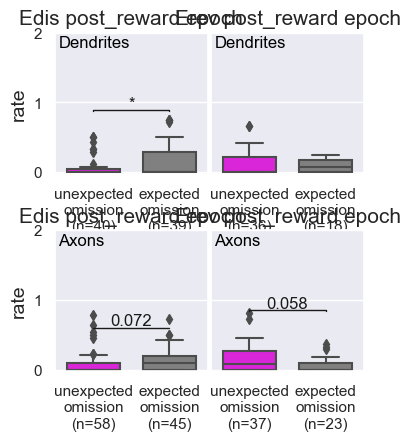

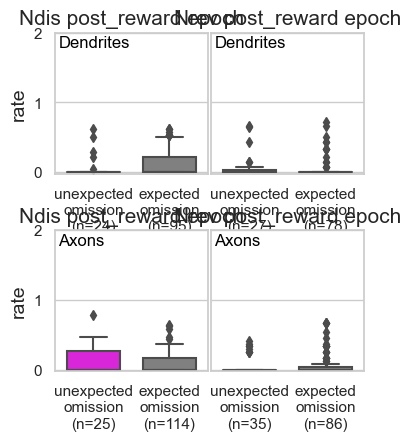

In [799]:
# for std in [0.03]:#np.linspace(0.067,0.069,11):
#     print(std)
    # sns.reset_defaults()
epoch = 'post_reward'
trialtypes = {'unexpected omission':['unrewarded hit','unrewarded hit'],
              'expected omission':['unrewarded FA','unrewarded FA'],
              #'CR':['unrewarded CR', 'unrewarded CR'],
              #'Miss':['unrewarded miss','unrewarded miss'],
              #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
             }
ttest = 'parametric'
for protocols in [[['Edis'],['Erev']],[['Ndis'],['Nrev']]]:
    figsize = (1.9897*2, 2.1987*2)
    ylim = [-0.025,2]
    metric = 'rate'
    ROIs_to_include = correlated_ROI_list#rew_positive_ROIs + rew_negative_ROIs

    active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
    final_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch, ROIs_to_include)
    fig = plot_box_plots(final_metric, epoch, ttest, figsize, ylim, metric, remove_labels=False, fliers=True)
    # fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
    #                                                   epoch,
    #                                                   ('_vs_').join(list(trialtypes.keys())),
    #                                                   ('_').join([item for sublist in protocols for item in sublist]),
    #                                                   ttest),
    #             bbox_inches=0, pad_inches=0)

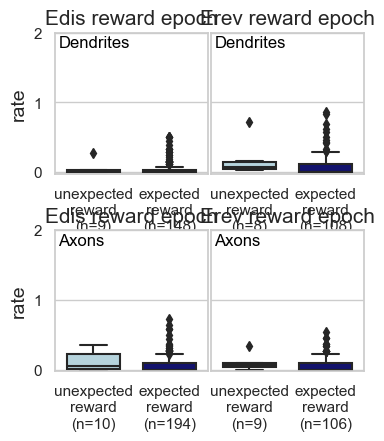

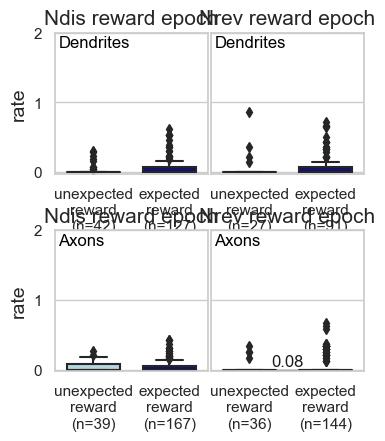

In [800]:
# for std in [0.03]:#np.linspace(0.067,0.069,11):
#     print(std)
    # sns.reset_defaults()
epoch = 'reward'
trialtypes = {'unexpected reward':['rewarded FA','rewarded FA'],
              'expected reward':['rewarded hit','unrewarded hit'],
              #'CR':['unrewarded CR', 'unrewarded CR'],
              #'Miss':['unrewarded miss','unrewarded miss'],
              #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
             }
ttest = 'parametric'
for protocols in [[['Edis'],['Erev']],[['Ndis'],['Nrev']]]:
    figsize = (1.9897*2, 2.1987*2)
    ylim = [-0.025,2]
    metric = 'rate'
    ROIs_to_include = correlated_ROI_list#rew_positive_ROIs

    active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
    final_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch, ROIs_to_include)
    fig = plot_box_plots(final_metric, epoch, ttest, figsize, ylim, metric, remove_labels=False, fliers=True)
    # fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
    #                                                   epoch,
    #                                                   ('_vs_').join(list(trialtypes.keys())),
    #                                                   ('_').join([item for sublist in protocols for item in sublist]),
    #                                                   ttest),
    #             bbox_inches=0, pad_inches=0)

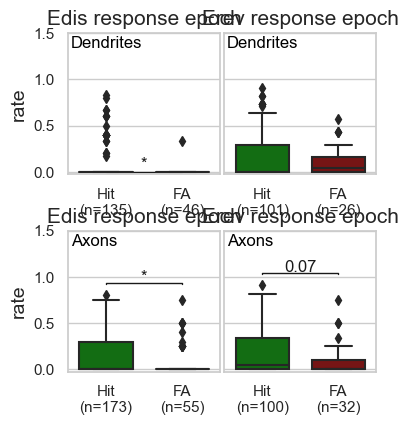

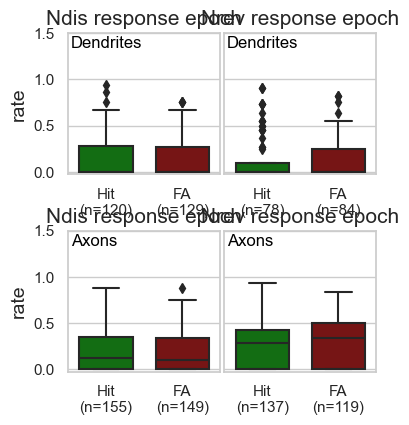

In [801]:
# sns.reset_defaults()
epoch = 'response'
trialtypes = {'Hit':['rewarded hit','unrewarded hit'],
              'FA':['rewarded FA','unrewarded FA'],
              #'CR':['unrewarded CR', 'unrewarded CR'],
              #'Miss':['unrewarded miss','unrewarded miss'],
              #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
             }
ttest = 'parametric'
for protocols in [[['Edis'],['Erev']],[['Ndis'],['Nrev']]]:
    figsize = (1.9897*2, 2.1987*2)
    ylim = [-0.025,1.5]
    metric = 'rate'
    ROIs_to_include = lick_positive_ROIs

    active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
    final_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch, ROIs_to_include)
    fig = plot_box_plots(final_metric, epoch, ttest, figsize, ylim, metric, remove_labels=False, fliers=True)
    # fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
    #                                                   epoch,
    #                                                   ('_vs_').join(list(trialtypes.keys())),
    #                                                   ('_').join([item for sublist in protocols for item in sublist]),
    #                                                   ttest),
    #             bbox_inches=0, pad_inches=0)

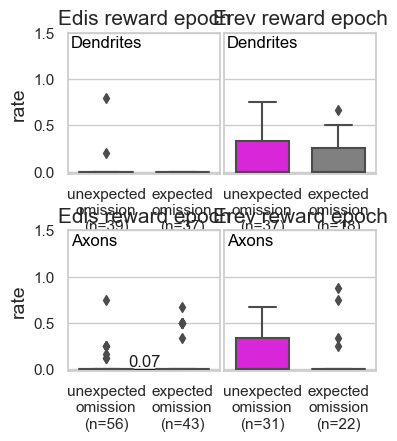

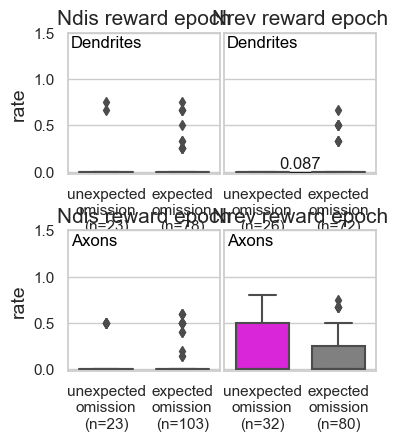

In [802]:
# sns.reset_defaults()
epoch = 'reward'
trialtypes = {'unexpected omission':['unrewarded hit','unrewarded hit'],
              'expected omission':['unrewarded FA','unrewarded FA'],
              #'CR':['unrewarded CR', 'unrewarded CR'],
              #'Miss':['unrewarded miss','unrewarded miss'],
              #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
             }
ttest = 'parametric'
for protocols in [[['Edis'],['Erev']],[['Ndis'],['Nrev']]]:
    figsize = (1.9897*2, 2.1987*2)
    ylim = [-0.025,1.5]
    metric = 'rate'
    ROIs_to_include = rew_negative_ROIs

    active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
    final_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch, ROIs_to_include)
    fig = plot_box_plots(final_metric, epoch, ttest, figsize, ylim, metric, remove_labels=False, fliers=True)
    # fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
    #                                                   epoch,
    #                                                   ('_vs_').join(list(trialtypes.keys())),
    #                                                   ('_').join([item for sublist in protocols for item in sublist]),
    #                                                   ttest),
    #             bbox_inches=0, pad_inches=0)

0.068


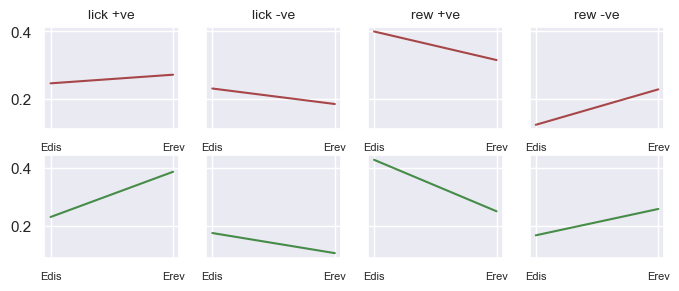

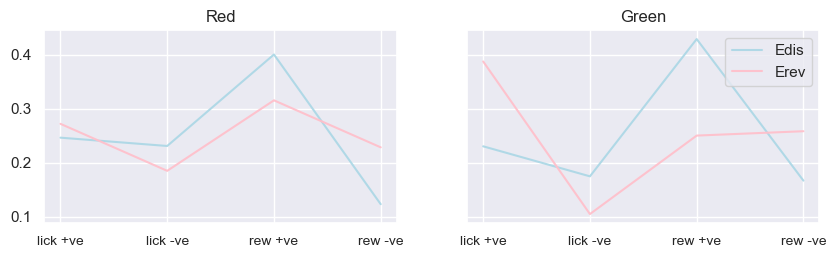

In [803]:
for std in [0.068]:
    print(std)
    mods, lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs, rew_negative_neutral_ROIs = event_based_MI(cohort_epochs, 3, std)
    all_modulated_ROIs = {}
    for channel in ['Red','Green']:
        channel_ROIs = {}
        for stage, stage_dict in mods.items():
            lick_pos_ROIs = [item for key, sublist in stage_dict['response']['responses'].items() for item in sublist]
            lick_neg_ROIs = [item for key, sublist in stage_dict['response']['no responses'].items() for item in sublist]
            rew_pos_ROIs = [item for key, sublist in stage_dict['reward']['rewarded'].items() for item in sublist]
            rew_neg_ROIs = [item for key, sublist in stage_dict['reward']['unrewarded'].items() for item in sublist]

            for protocol in ['dis','rev']:
                protocol_dict = {}
                for modulation_type, label in zip([lick_pos_ROIs, lick_neg_ROIs, rew_pos_ROIs, rew_neg_ROIs], ['lick +ve','lick -ve', 'rew +ve', 'rew -ve']):
                    protocol_list = [x for x in modulation_type if (protocol in x) & (channel in x)]
                    protocol_dict[label] = [len(protocol_list)]
                protocol_df = pd.DataFrame(protocol_dict)
                channel_ROIs[stage+protocol] = protocol_df
        modulation_df = pd.concat(channel_ROIs).droplevel(1)
        all_modulated_ROIs[channel] = modulation_df

    fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(8,3), sharey='row', gridspec_kw={'hspace':0.25})
    for row, (channel, channel_df) in enumerate(all_modulated_ROIs.items()):
    #     channel_df['lick modulated'] = channel_df['lick +ve'] + channel_df['lick -ve']
    #     channel_df['rew modulated'] = channel_df['rew +ve'] + channel_df['rew -ve']
    #     channel_df = channel_df[['lick modulated','rew modulated']]
        color = 'darkred' if channel == 'Red' else 'darkgreen'
        norm_df = channel_df.T/channel_df.sum(axis=1)
    #     norm_df = (channel_df / all_ROIs_dfs[channel]).T
        norm_df = norm_df[['Edis','Erev']]
        for col, (index, rows) in enumerate(norm_df.iterrows()):
            ax[row,col].plot(rows, color=color, alpha=0.7)
            ax[row,col].set_title(index, fontsize=10) if row == 0 else None
            ax[row,col].set_xticklabels(rows.index, fontsize=8)
    plt.show()

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,2.5), sharey=True, gridspec_kw={'hspace':0.25})
    for col, (channel, channel_df) in enumerate(all_modulated_ROIs.items()):
    # #     channel_df['lick modulated'] = (channel_df['lick +ve'] + channel_df['lick -ve']) / 2
    #     channel_df['rew modulated'] = channel_df['rew +ve'] + channel_df['rew -ve']
    #     channel_df = channel_df[['lick +ve','rew +ve', 'rew -ve']]
        color = 'darkred' if channel == 'Red' else 'darkgreen'
        colors = {'Edis':'lightblue','Nrev':'mediumseagreen','Erev':'pink'}
        norm_df = channel_df.T/channel_df.sum(axis=1)
#         norm_df = (norm_df-norm_df.min())/(norm_df.max()-norm_df.min())
#         norm_df = (channel_df / all_ROIs_dfs[channel]).T
        norm_df = norm_df[['Edis','Erev']]

        for index, rows in norm_df.items():
                ax[col].plot(rows, color=colors[index], alpha=0.95, label=index)
                ax[col].set_title(channel, fontsize=12)
                ax[col].set_xticklabels(rows.index, fontsize=10)
        ax[col].legend() if col == 1 else None

    #         x = 0
    #         for protocol, data in rows.to_frame().iterrows():
    #             if protocol != 'Ndis':
    #                 ax[row].plot([x], float(data))
    #             ax[row].set_title(index, fontsize=10)
    #             ax[row].set_xticklabels(rows.index, fontsize=8)
    plt.show()

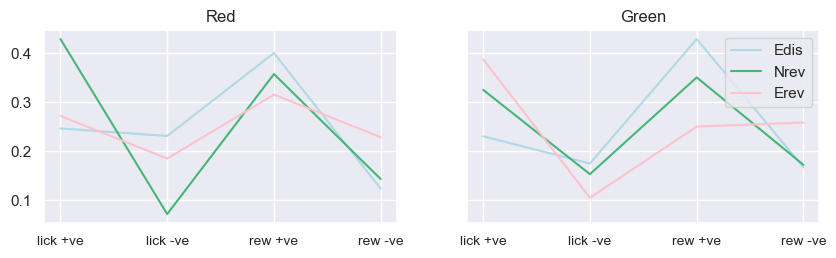

In [804]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,2.5), sharey=True, gridspec_kw={'hspace':0.25})
for col, (channel, channel_df) in enumerate(all_modulated_ROIs.items()):
# #     channel_df['lick modulated'] = (channel_df['lick +ve'] + channel_df['lick -ve']) / 2
#     channel_df['rew modulated'] = channel_df['rew +ve'] + channel_df['rew -ve']
#     channel_df = channel_df[['lick +ve','rew +ve', 'rew -ve']]
    color = 'darkred' if channel == 'Red' else 'darkgreen'
    colors = {'Edis':'lightblue','Nrev':'mediumseagreen','Erev':'pink'}
    norm_df = channel_df.T/channel_df.sum(axis=1)
#     norm_df = (channel_df / all_ROIs_dfs[channel]).T
    norm_df = norm_df[['Edis','Nrev','Erev']]

    for index, rows in norm_df.items():
            ax[col].plot(rows, color=colors[index], alpha=0.95, label=index)
            ax[col].set_title(channel, fontsize=12)
            ax[col].set_xticklabels(rows.index, fontsize=10)
    ax[col].legend() if col == 1 else None

#         x = 0
#         for protocol, data in rows.to_frame().iterrows():
#             if protocol != 'Ndis':
#                 ax[row].plot([x], float(data))
#             ax[row].set_title(index, fontsize=10)
#             ax[row].set_xticklabels(rows.index, fontsize=8)
plt.show()

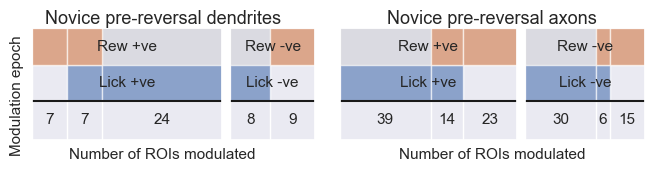

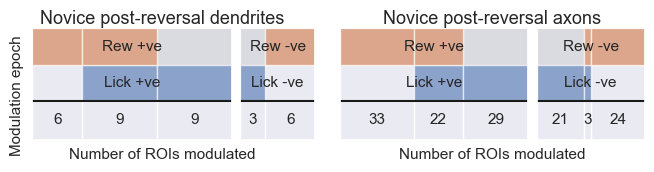

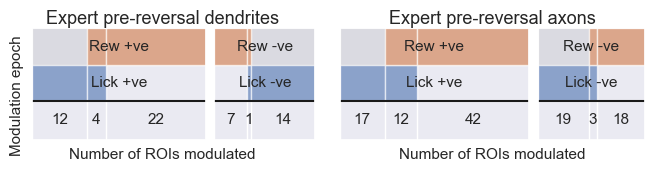

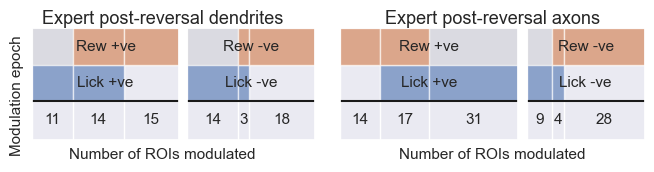

In [203]:
all_ROIs = list(pd.concat(cohort_epochs['deltaF']['all']).index.get_level_values('Unique_ROI').unique())
sns.set()
task_phases = {'Ndis':'Novice pre-reversal',
               'Edis':'Expert pre-reversal',
               'Nrev':'Novice post-reversal',
               'Erev':'Expert post-reversal'}
for stage in ['N','E']:
    for prot in ['dis','rev']:
        protocol = stage+prot
        task_phase = task_phases[protocol]
        fig = plt.figure(constrained_layout=True, figsize=(6.43, 1.42))
        (subfig_l, subfig_r) = fig.subfigures(nrows=1, ncols=2, wspace=0.05)
        for subfig_col, (channel) in enumerate(['Red','Green']):
            ROI_label = 'dendrites' if channel == 'Red' else 'axons'
            pos_sets = []
            neg_sets = []
            pos_labels = []
            neg_labels = []
            for epoch, epoch_dict in mods[stage].items():
                for n, (ROI_type, type_dict) in enumerate(epoch_dict.items()):
                    prefix = 'Rew' if epoch in ['reward','ITI'] else 'Lick'
                    if [epoch, ROI_type] in [['response','responses'],
                                              ['reward','rewarded']
                                             ]:
                        psets = set([item for sublist in [type_dict[x] for x in type_dict.keys()]  for item in sublist if (channel in item) & (protocol in item)])
                        pos_sets.append(psets)
                        pos_labels.append(prefix+' +ve')
                    if [epoch, ROI_type] in [['response','no responses'],
                                              ['reward','unrewarded']
                                             ]:
                        sets = set([item for sublist in [type_dict[x] for x in type_dict.keys()]  for item in sublist if (channel in item) & (protocol in item)])
                        neg_sets.append(sets)
                        neg_labels.append(prefix+' -ve')
            new_neg_sets = []
            for i, (subset) in enumerate(neg_sets):
                neg_subsets = []
                for roi in subset:
                    if roi not in pos_sets[i]:
                        neg_subsets.append(roi)
                new_neg_sets.append(set(neg_subsets))
            protocol_channel_ROIs = [x for x in all_ROIs if (protocol in x) & (channel in x)]

            all_sets = [set(protocol_channel_ROIs), set(protocol_channel_ROIs)]

            neutral_sets = []
            for i, subset in enumerate(all_sets):
                neutral_subset = []
                for roi in subset:
                    if (roi not in pos_sets[i]) & (roi not in new_neg_sets[i]):
                        neutral_subset.append(roi)
                neutral_sets.append(set(neutral_subset))

            unique_ROIs_pos = len(set([item for sublist in pos_sets for item in sublist]))
            unique_ROIs_neg = len(set([item for sublist in new_neg_sets for item in sublist]))
            unique_ROIs_neutral = len(set([item for sublist in neutral_sets for item in sublist]))
            pos_ratio = unique_ROIs_pos / (unique_ROIs_pos + unique_ROIs_neg)
            neg_ratio = unique_ROIs_neg / (unique_ROIs_pos + unique_ROIs_neg)
            neutral_ratio = 0.05

            if subfig_col == 0:
                subplots = subfig_l.subplots(nrows=1, ncols=2, sharey=True, 
                                   gridspec_kw={'width_ratios':[pos_ratio,neg_ratio],
                                                'wspace':0.001})
                subfig_l.suptitle(f'{task_phase} {ROI_label}', fontsize=13, y=1.1)
                subfig_l.supxlabel('Number of ROIs modulated', fontsize=11)
                subfig_l.supylabel('Modulation epoch', fontsize=11)
            else:
                subplots = subfig_r.subplots(nrows=1, ncols=2, sharey=True, 
                                   gridspec_kw={'width_ratios':[pos_ratio,neg_ratio],
                                                'wspace':0.001})
                subfig_r.suptitle(f'{task_phase} {ROI_label}', fontsize=13, y=1.1)
                subfig_r.supxlabel('Number of ROIs modulated', fontsize=11)

            for col, (title, sets, label) in enumerate(zip(['+ve','-ve'],[pos_sets, new_neg_sets],[pos_labels, neg_labels])):
                supervenn(sets, label, side_plots=False, ax=subplots[col], fontsize=11)#, sets_ordering='minimize gaps')
    #             subplots[col].set_title(f'{title}', fontsize=11)
                subplots[col].set_ylabel('')
                subplots[col].set_xlabel('')
        fig.savefig(f'{data_directory}\\{protocol}_ROI_modulation_venn.svg', bbox_inches='tight', pad_inches=0)
    #         subplots[0].set_ylabel('Modulation epoch', fontsize=15)
    plt.show()

**What about feedback signals?**
1. Seems like pre-reversal, both the axons and the dendrites are just interested in whether there was a reward or not (i.e. rewarded response > unrewarded response), specifically at reward onset
2. Post-reversal, the axons are more encoding unexpected rewards (i.e. rewarded FA > everything) both at reward onset and ITI onset
3. Interestingly, post-reversal dendritic activity is again differentiating reward vs. no reward (i.e. rewarded response > unrewarded response), but specifically at ITI onset

**In summary, the axons shift their encoding drastically from reward anticipation and encoding (i.e. anticipating/received reward or not) pre-reversal, to a  strong encoding of unexpected rewards post-reversal (both at reward and ITI onset). Stimulus-evoked dendritic activity reflects learning, where there are only difference in the novice state - pre-reversal it reflects response or not respond irrespective of trial type (which makes sense given its association training history) and during reversal learning it still reflects the reward contingencies of the previous phase of the task. Dendritic activity is less concerned about reward feedback matching predictions, where it is just distinguishing whether there was a reward or not, although the timing of this integration shifts from reward onset to ITI onset (i.e. from pre-reversal to post-reversal). While it's not surprising that reward encoding during novice doesn't reflect any predictions at reward onset, there are signs of prediction in the axons during reversal learning at ITI onset (i.e. rewarded FA > rewarded hit). POm axons may therefore be exerting the most changes on behavior during this ITI period.**

- is novice reversal performance better than novice extinction performance?

In [49]:
try:
    import importlib
    importlib.reload(fn)
except NameError: # It hasn't been imported yet
    import functions_module as fn

In [228]:
pairwise_cutoff = 0
cutoff_on = 'maxes'
nbins = 20
filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
filtered_ROI_dfs['merged'] = pd.concat([filtered_ROI_dfs['Red'],filtered_ROI_dfs['Green']])

In [60]:
filtered_ROI_dfs['Red'].min()

0    0.23301
dtype: float64

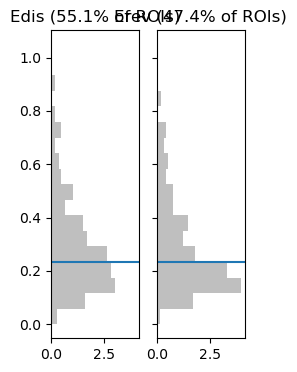

In [234]:
sns.reset_defaults()
for channel in ['merged']:
    cutoff = 0.23332
    channel_df = filtered_ROI_dfs[channel]
    channel_df = channel_df[(channel_df.index.get_level_values(1).str.contains('Edis')) |
                            (channel_df.index.get_level_values(1).str.contains('Nrev')) |
                            (channel_df.index.get_level_values(1).str.contains('Erev'))]
    bins1 = list(np.linspace(0,cutoff,5))
    interval = np.diff(bins1)[0]
    bins2 = []
    for i in range(50):
        if i == 0:
            bins2.append(cutoff+interval)
        else:
            if bins2[-1] <= 1:
                bins2.append(bins2[-1]+interval)
            else:
                break
    bins = bins1+bins2
    
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(2.5,4), sharex=True, sharey=True)
    for col, (protocol) in enumerate(['Edis','Erev']):
        protocol_df = channel_df[channel_df.index.get_level_values(1).str.contains(protocol)]
        ncorr = protocol_df[protocol_df[0] > cutoff].shape[0]
        ntot = protocol_df.shape[0]
        prop = round(ncorr/ntot*100,1)
#         ax[row].hist(channel_df[0], bins=bins, alpha=0.5, density=False, color='grey')
        ax[col].hist(protocol_df[0], bins=bins, alpha=0.5, density=True, color='grey', orientation='horizontal')
        ax[col].axhline(cutoff)
#         ax[row].set_xlim(0,bins[10])
        ax[col].set_title(f'{protocol} ({prop}% of ROIs)')
    #     sns.kdeplot(protocol_df[0], alpha=0.7, lw=2, color=color)
    plt.show()
    fig.savefig(os.path.join(data_directory, f'{channel}_correlated_ROI_histograms.svg'))

Red Edis: 0.298 +/- 0.018, n=113
Red Nrev: 0.3 +/- 0.014, n=114
Red Erev: 0.303 +/- 0.019, n=116
Green Edis: 0.299 +/- 0.014, n=174
Green Nrev: 0.201 +/- 0.011, n=192
Green Erev: 0.276 +/- 0.013, n=150
merged Edis: 0.298 +/- 0.011, n=287
merged Nrev: 0.238 +/- 0.009, n=306
merged Erev: 0.287 +/- 0.011, n=266


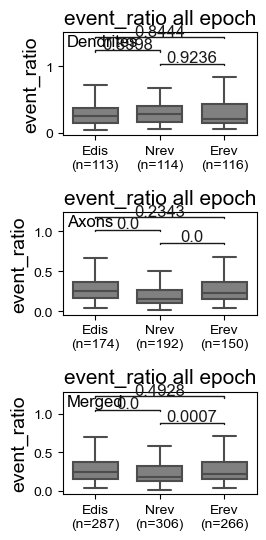

In [227]:
filtered_ROI_dfs['merged'] = pd.concat([filtered_ROI_dfs['Red'],filtered_ROI_dfs['Green']])
correlation_metrics = {}
for channel in ['Red','Green','merged']:
    sns.set()
    for x, (protocol, color) in enumerate(zip(['Edis','Nrev','Erev'], ['dodgerblue','seagreen','pink'])):
        protocol_df = filtered_ROI_dfs[channel][filtered_ROI_dfs[channel].index.get_level_values(1).str.contains(protocol)]
        
        mean = round(float(protocol_df.mean()),3)
        sem = round(float(protocol_df.sem()),3)
        n = protocol_df.dropna().shape[0]
        print(f'{channel} {protocol}: {mean} +/- {sem}, n={n}')
        
        protocol_dict = {index[1]:row.values[0] for index,row in protocol_df.iterrows()}
        
        if 'event_ratio' not in correlation_metrics.keys():
            correlation_metrics['event_ratio'] = {}
            if protocol not in correlation_metrics['event_ratio'].keys():
                correlation_metrics['event_ratio'][protocol] = {}
                correlation_metrics['event_ratio'][protocol][channel] = protocol_dict
                
            else:
                correlation_metrics['event_ratio'][protocol][channel] = protocol_dict
        else:
            if protocol not in correlation_metrics['event_ratio'].keys():
                correlation_metrics['event_ratio'][protocol] = {}
                correlation_metrics['event_ratio'][protocol][channel] = protocol_dict
                
            else:
                correlation_metrics['event_ratio'][protocol][channel] = protocol_dict
ttest = 'parametric'
welch = True
merged = True
ROIs_label = 'ALL_ROIs'
figsize = (2.5, 6)
ylim = False#[0,0.3]
metric = 'event_ratio'
sns.reset_defaults()
fig = plot_box_plots(correlation_metrics, 'all', ttest, figsize, metric, welch, merged, ylim, remove_labels=False, fliers=False, manual_color='grey')
fig.savefig(os.path.join(data_directory, 'protocol_by_protocol_shareve_event_ratio.svg'))

In [792]:
correlation_metrics['event_ratio']['Edis'].keys()

dict_keys(['Red', 'Green'])

In [39]:
for channel in ['Green','Red']:
    for protocol in ['Edis','Nrev','Erev']:
        ncorr = len([x for x in correlated_ROI_list if (channel in x) & (protocol in x)])
        ntot = len([x for x in dual_imaging_ROIs if (channel in x) & (protocol in x)])
        prop = round((ncorr/ntot)*100,1)
        print(f'{ncorr} {channel} ROIs ({prop}%) are correlated in {protocol}')
    print()

111 Green ROIs (63.4%) are correlated in Edis
25 Green ROIs (12.9%) are correlated in Nrev
78 Green ROIs (50.6%) are correlated in Erev

64 Red ROIs (57.1%) are correlated in Edis
16 Red ROIs (41.0%) are correlated in Nrev
65 Red ROIs (57.5%) are correlated in Erev



In [206]:
for channel in ['Green','Red']:
    print(channel)
    for modulation, mod_list in zip(['lick +ve', 'rew +ve', 'rew -ve'], [lick_positive_ROIs, rew_positive_ROIs, rew_negative_ROIs]):
        print(modulation)
        corr = [x for x in correlated_ROI_list if (channel in x)]
        uncorr = [x for x in dual_imaging_uncorrelated_ROIs if (channel in x)]
        
        mod_corr = [x for x in corr if x in mod_list]
        mod_uncorr = [x for x in uncorr if x in mod_list]
        
        corr_prop = round(len(mod_corr)/len(corr)*100,1)
        uncorr_prop = round(len(mod_uncorr)/len(uncorr)*100,1)
        
        print(f'{len(mod_corr)} {channel} correlated ROIs ({corr_prop}%) are {modulation} ROIs')
        print(f'{len(mod_uncorr)} {channel} uncorrelated ROIs ({uncorr_prop}%) are {modulation} ROIs')
        print()
    print('*'*80)

Green
lick +ve
53 Green correlated ROIs (14.1%) are lick +ve ROIs
32 Green uncorrelated ROIs (5.0%) are lick +ve ROIs

rew +ve
51 Green correlated ROIs (13.6%) are rew +ve ROIs
30 Green uncorrelated ROIs (4.7%) are rew +ve ROIs

rew -ve
16 Green correlated ROIs (4.3%) are rew -ve ROIs
19 Green uncorrelated ROIs (3.0%) are rew -ve ROIs

********************************************************************************
Red
lick +ve
46 Red correlated ROIs (21.1%) are lick +ve ROIs
7 Red uncorrelated ROIs (1.3%) are lick +ve ROIs

rew +ve
35 Red correlated ROIs (16.1%) are rew +ve ROIs
6 Red uncorrelated ROIs (1.1%) are rew +ve ROIs

rew -ve
16 Red correlated ROIs (7.3%) are rew -ve ROIs
19 Red uncorrelated ROIs (3.5%) are rew -ve ROIs

********************************************************************************


0.88


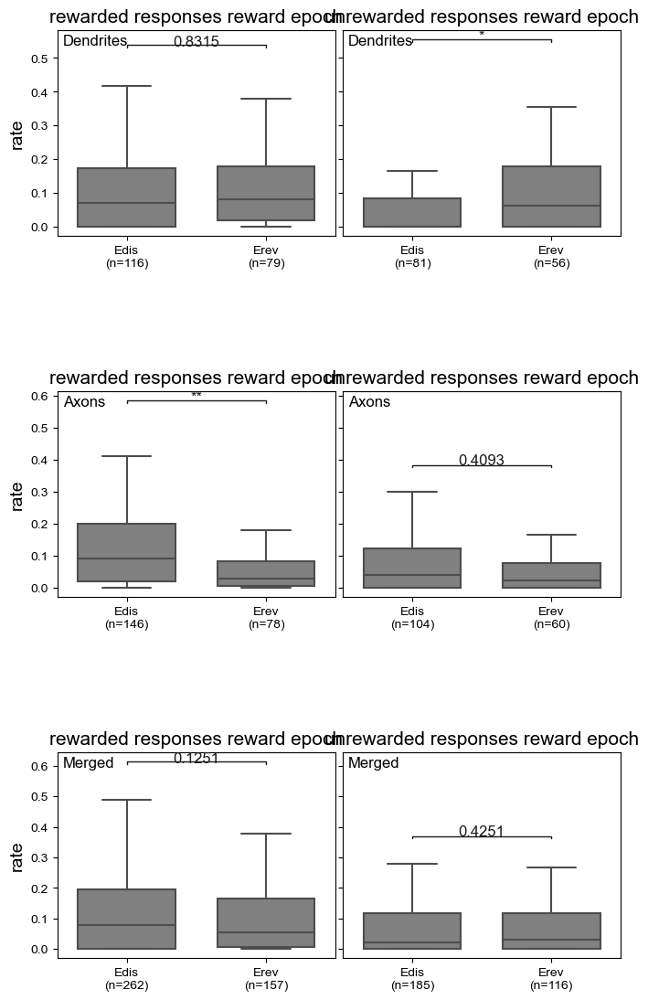

In [67]:
for c in [0.88]:#
    print(c)
    pairwise_cutoff = c
    cutoff_on = 'maxes'
    nbins = 20
    filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
    correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
    dual_imaging_uncorrelated_ROIs = [x for x in dual_imaging_ROIs if x not in correlated_ROI_list]
    
    include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                    'correlated_ROIs':correlated_ROI_list,
                    'uncorrelated_ROIs':dual_imaging_uncorrelated_ROIs,
                    'lick_positive_ROIs':lick_positive_ROIs,
                    'rew_positive_ROIs':rew_positive_ROIs,
                    'rew_negative_ROIs':rew_negative_ROIs}
    ttest = 'parametric'
    welch = False
    merged = True
    ROIs_label = 'ALL_ROIs'
    norm = 'normalize_across'
    figsize = (1.9897*4, 2.1987*6)
    ylim = False#[-0.025,1.5]
    metric = 'rate'   
    ROIs_to_include = include_ROI_dict[ROIs_label]
    
    for protocols in [[['Edis'],['Erev']]]:    
        final_metrics = {}
        for i, (epoch, trialtypes) in enumerate(zip(['reward'],
                                          [
                                           {'rewarded responses':['rewarded hit','rewarded FA'],
                                            'unrewarded responses':['unrewarded hit','unrewarded FA']}
                                           ])):
            active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
            epoch_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch, ROIs_to_include)
            final_metrics[epoch] = epoch_metric
            
        final_metric = {}
        for epoch_key, epoch_values in final_metrics.items():
            for protocol_key, protocol_values in epoch_values.items():
                for modulation_key, modulation_values in protocol_values.items():
                    new_key = f'{modulation_key} ({epoch_key})'
                    if protocol_key not in final_metric.keys():
                        final_metric[protocol_key] = {}
                        final_metric[protocol_key][modulation_key] = modulation_values
                    else:
                        final_metric[protocol_key][modulation_key] = modulation_values
        
        final_metric_df = combine_final_metrics(final_metric, metric)
        if norm == 'normalize_within':
            normalized_metrics = normalize_within_protocols(final_metric_df)
            final_data = normalized_metrics
            manual_color = 'grey'
        elif norm == 'normalize_across':
            normalized_metrics = normalize_across_protocols(final_metric_df)
            final_data = normalized_metrics
            manual_color = 'grey'
        else:
            final_data = final_metrics
            manual_color = False
        final_data = merge_final_metrics(final_data)    
    #     all_comparisons.append(final_metric_df)
        sns.reset_defaults()
        fig = plot_box_plots(final_data, epoch, ttest, figsize, metric, welch, merged, ylim, remove_labels=False, fliers=False, manual_color=manual_color)
#         fig.savefig('{}\\{}_{}_{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                       epoch,
#                                                       ('_vs_').join(list(trialtypes.keys())),
#                                                       ('_').join([item for sublist in protocols for item in sublist]),
#                                                       ttest,
#                                                       ROIs_label,
#                                                       norm),
#                 bbox_inches=0, pad_inches=0)
    # all_comparisons_df = pd.concat(all_comparisons, axis=1)
    # save_df = all_comparisons_df.T.drop_duplicates().T
    # save_df = save_df.swaplevel(0,2, axis=1).swaplevel(1,2, axis=1).T.sort_index(0).T.droplevel(3, axis=1)
    # save_df.to_csv(os.path.join(data_directory, f'{epoch}_{ttest}_{metric}_{ROIs_label}.csv'))

    # fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
    #                                                   epoch,
    #                                                   ('_vs_').join(list(trialtypes.keys())),
    #                                                   ('_').join([item for sublist in protocols for item in sublist]),
    #                                                   ttest),
    #             bbox_inches=0, pad_inches=0)

In [106]:
final_data['rewarded responses'].keys()

dict_keys(['Edis', 'Erev'])

In [104]:
for ttype in ['rewarded responses','unrewarded responses']:
    mean = round(final_data['Nrev'][ttype]['Red'].mean(),3)
    sem = round(final_data['Nrev'][ttype]['Red'].sem(), 3)
    n = final_data['Nrev'][ttype]['Red'].dropna().shape[0]
    
    print(f'{ttype}: {mean} +/- {sem}, n={n}')

AttributeError: 'dict' object has no attribute 'mean'

In [294]:
for c in [0.864]:
    print(c)
    pairwise_cutoff = c
    cutoff_on = 'maxes'
    nbins = 20
    filtered_ROI_dfs = fn.filter_correlated_ROIs(correlated_ROIs, pairwise_cutoff, cutoff_on, nbins)
    correlated_ROI_list = pd.concat(filtered_ROI_dfs).index.get_level_values(2).tolist()
    include_ROI_dict = {'ALL_ROIs':valid_ROIs,
                    'correlated_ROIs':correlated_ROI_list,
                    'lick_positive_ROIs':lick_positive_ROIs,
                    'rew_positive_ROIs':rew_positive_ROIs,
                    'rew_negative_ROIs':rew_negative_ROIs}

    epoch = 'response'
    trialtypes = {'responses':['rewarded hit','rewarded FA','unrewarded hit','unrewarded FA'],
                  'no responses':['unrewarded miss','unrewarded CR'],
                  #'CR':['unrewarded CR', 'unrewarded CR'],
                  #'Miss':['unrewarded miss','unrewarded miss'],
                  #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
                  #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
                 }
    ttest = 'parametric'
    ROIs_label = 'ALL_ROIs'
    norm = 'normalized_across'
    
    all_comparisons = []
    for protocols in [[['Nrev'],['Erev']]]:
        figsize = (1.9897*2, 2.1987*2)
        ylim = [-0.025,0.5]
        metric = 'rate'
        ROIs_to_include = include_ROI_dict[ROIs_label]

        active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
        final_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch, ROIs_to_include)
        final_metric_df = combine_final_metrics(final_metric, metric)
        normalized_metrics = normalize_final_metrics(final_metric_df)
        final_data = normalized_metrics if norm == 'normalized' else final_metric
        manual_color = 'grey' if norm == 'normalized' else False
        
    #     all_comparisons.append(final_metric_df)
        sns.reset_defaults()
        fig = plot_box_plots(final_data, epoch, ttest, figsize, ylim, metric, remove_labels=False, fliers=False, manual_color=manual_color)
#         fig.savefig('{}\\{}_{}_{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                       epoch,
#                                                       ('_vs_').join(list(trialtypes.keys())),
#                                                       ('_').join([item for sublist in protocols for item in sublist]),
#                                                       ttest,
#                                                       ROIs_label,
#                                                       norm),
#                 bbox_inches=0, pad_inches=0)
    # all_comparisons_df = pd.concat(all_comparisons, axis=1)
    # save_df = all_comparisons_df.T.drop_duplicates().T
    # save_df = save_df.swaplevel(0,2, axis=1).swaplevel(1,2, axis=1).T.sort_index(0).T.droplevel(3, axis=1)
    # save_df.to_csv(os.path.join(data_directory, f'{epoch}_{ttest}_{metric}_{ROIs_label}.csv'))

    # fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
    #                                                   epoch,
    #                                                   ('_vs_').join(list(trialtypes.keys())),
    #                                                   ('_').join([item for sublist in protocols for item in sublist]),
    #                                                   ttest),
    #             bbox_inches=0, pad_inches=0)

0.864


NameError: name 'normalize_final_metrics' is not defined

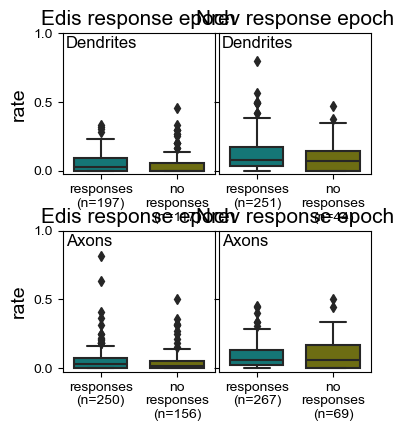

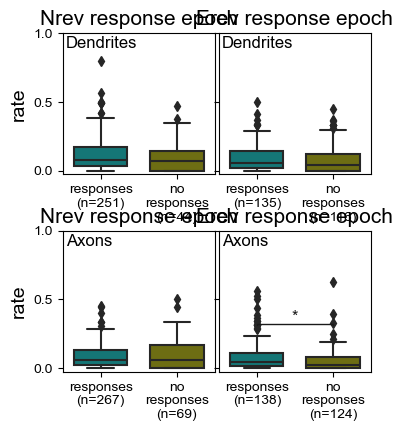

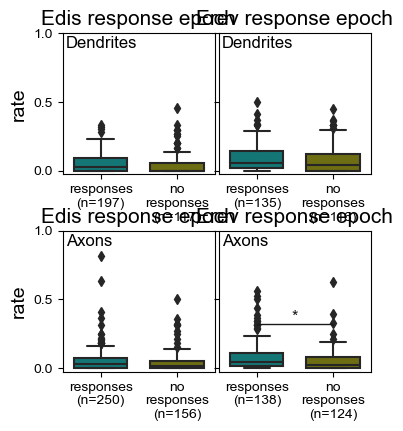

In [125]:
epoch = 'response'
trialtypes = {'responses':['rewarded hit','rewarded FA','unrewarded hit','unrewarded FA'],
              'no responses':['unrewarded miss','unrewarded CR'],
              #'CR':['unrewarded CR', 'unrewarded CR'],
              #'Miss':['unrewarded miss','unrewarded miss'],
              #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
             }
ttest = 'parametric'
ROIs_label = 'ALL_ROIs'

all_comparisons = []
for protocols in [[['Edis'],['Nrev']], [['Nrev'],['Erev']], [['Edis'],['Erev']]]:
    figsize = (1.9897*2, 2.1987*2)
    ylim = [-0.025,1]
    metric = 'rate'
    ROIs_to_include = include_ROI_dict[ROIs_label]

    active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
    final_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch, ROIs_to_include)
    final_metric_df = combine_final_metrics(final_metric, metric)
    all_comparisons.append(final_metric_df)
    sns.reset_defaults()
    fig = plot_box_plots(final_metric, epoch, ttest, figsize, ylim, metric, remove_labels=False, fliers=True)
    fig.savefig('{}\\{}_{}_{}_{}_{}_boxplots.svg'.format(data_directory,
                                                      epoch,
                                                      ('_vs_').join(list(trialtypes.keys())),
                                                      ('_').join([item for sublist in protocols for item in sublist]),
                                                      ttest,
                                                      ROIs_label),
                bbox_inches=0, pad_inches=0)
all_comparisons_df = pd.concat(all_comparisons, axis=1)
save_df = all_comparisons_df.T.drop_duplicates().T
save_df.swaplevel(0,2, axis=1).swaplevel(1,2, axis=1).T.sort_index(0).T.droplevel(3, axis=1)
save_df.to_csv(os.path.join(data_directory, f'{epoch}_{ttest}_{metric}_{ROIs_label}.csv'))

# fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                   epoch,
#                                                   ('_vs_').join(list(trialtypes.keys())),
#                                                   ('_').join([item for sublist in protocols for item in sublist]),
#                                                   ttest),
#             bbox_inches=0, pad_inches=0)

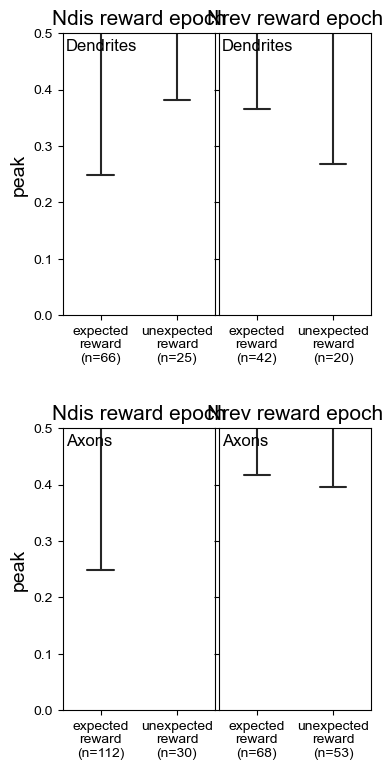

In [748]:
sns.reset_defaults()
epoch = 'reward'
trialtypes = {'expected reward':['rewarded hit','rewarded hit'],
              'unexpected reward':['rewarded FA','rewarded FA'],
              #'CR':['unrewarded CR', 'unrewarded CR'],
              #'Miss':['unrewarded miss','unrewarded miss'],
              #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
             }
ttest = 'parametric'
protocols = [['Ndis'],['Nrev']]
figsize = (1.9897*2, 2.1987*2*2)
ylim =[0,0.5]
metric = 'rate'
ROIs_to_include = valid_ROIs

active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
final_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch)
fig = plot_box_plots(final_metric, epoch, ttest, figsize, ylim, metric, remove_labels=False)
# fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                   epoch,
#                                                   ('_vs_').join(list(trialtypes.keys())),
#                                                   ('_').join([item for sublist in protocols for item in sublist]),
#                                                   ttest),
#             bbox_inches=0, pad_inches=0)

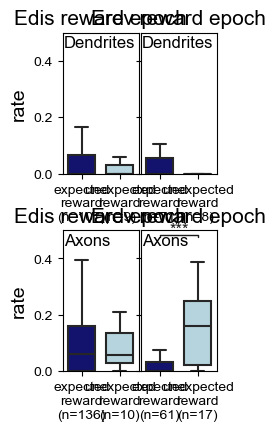

In [525]:
sns.reset_defaults()
epoch = 'reward'
trialtypes = {'expected reward':['rewarded hit','rewarded hit'],
              'unexpected reward':['rewarded FA','rewarded FA'],
              #'CR':['unrewarded CR', 'unrewarded CR'],
              #'Miss':['unrewarded miss','unrewarded miss'],
              #'Go':['rewarded hit','unrewarded hit','unrewarded miss'],
              #'NoGo':['rewarded FA','unrewarded FA','unrewarded CR']
             }
ttest = 'parametric'
protocols = [['Edis'],['Erev']]
figsize = (1.9897, 2.1987*2)
ylim =[0,0.5]
metric = 'rate'
ROIs_to_include = uncorrelated_ROI_list

active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols, ROIs_to_include)
final_metric = extract_metrics(protocols, all_df, trialtypes, active_trials, metric, epoch)
fig = plot_box_plots(final_metric, epoch, ttest, figsize, ylim, metric, remove_labels=False)
# fig.savefig('{}\\{}_{}_{}_{}_boxplots.svg'.format(data_directory,
#                                                   epoch,
#                                                   ('_vs_').join(list(trialtypes.keys())),
#                                                   ('_').join([item for sublist in protocols for item in sublist]),
#                                                   ttest),
#             bbox_inches=0, pad_inches=0)

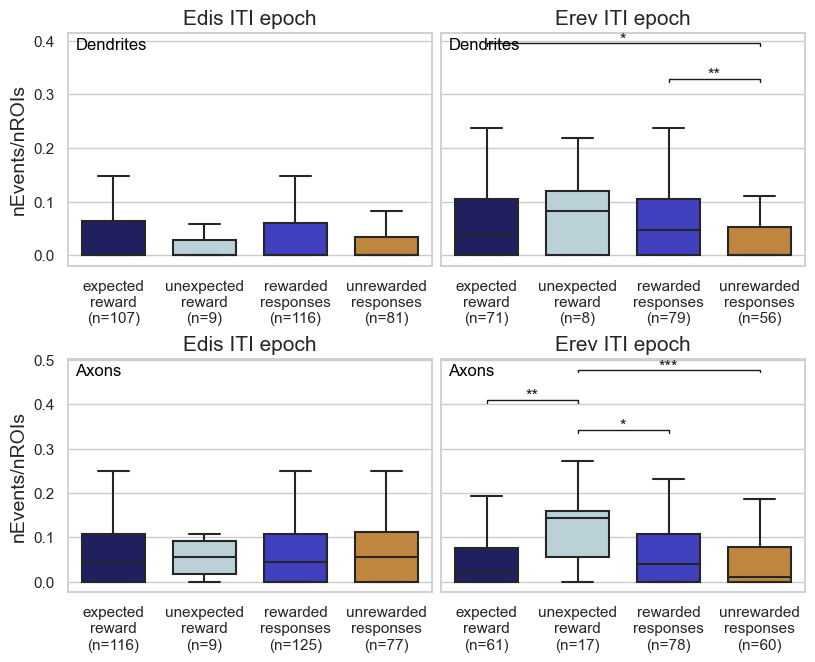

In [292]:
epoch = 'ITI'
trialtypes = {#'unexpected omission':['unrewarded hit','unrewarded hit'],
              #'expected omission':['unrewarded FA','unrewarded FA'],
              'expected reward':['rewarded hit','rewarded hit'],
              'unexpected reward':['rewarded FA','rewarded FA'],
              'rewarded responses':['rewarded hit','rewarded FA'],
              'unrewarded responses':['unrewarded hit','unrewarded FA'],
              #'expected outcomes':['rewarded hit','unrewarded FA'],
              #'unexpected outcomes':['rewarded FA','unrewarded hit']
             }
ttest = 'non-parametric'
protocols = [['Edis'],['Erev']]
active_trials = extract_active_trials(cohort_epochs, epoch, trialtypes, protocols)
final_metric = extract_metrics(protocols, all_df, trialtypes, active_trials)
plot_box_plots(final_metric, epoch, ttest)

## See overlap of modulated dendrites and POm-correlated dendrites ##

## Plot event onset latency histograms ##

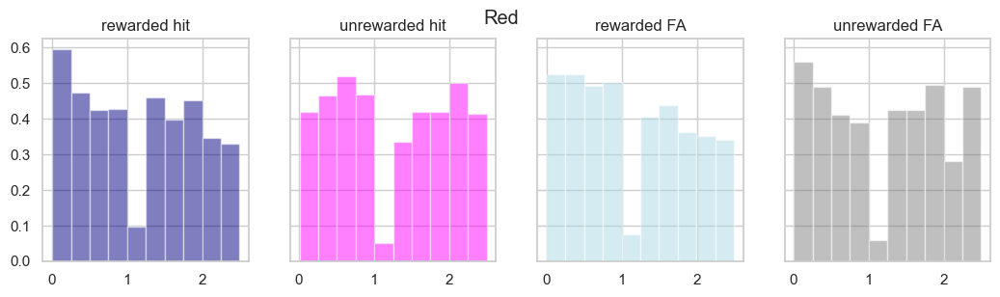

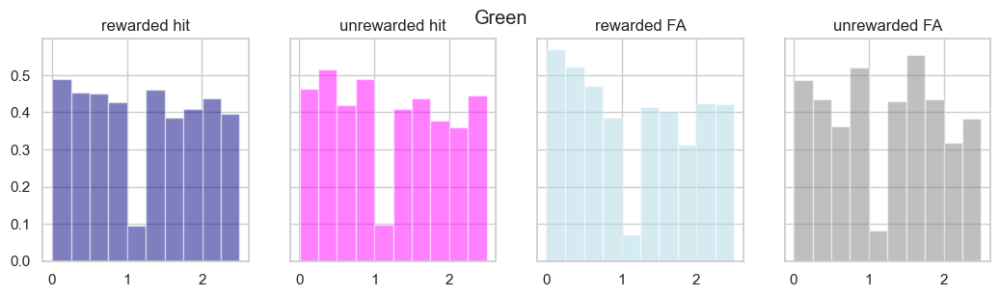

In [33]:
epochs = ['reward','delayed_reward']
reward_events = []
for epoch in epochs:
    reward_events.append(pd.concat(cohort_epochs['events'][epoch]))
reward_events = pd.concat(reward_events)
for timing in ['Response latency','Water_time','Timeout_end']:
    reward_events[timing] = [np.nan if x == '-' else float(x) for x in list(reward_events[timing])]
reward_events = fn.centre_event_latency(reward_events, 'reward')
trialtypes = ['rewarded hit','unrewarded hit','rewarded FA','unrewarded FA']
colors = ['navy','magenta','lightblue','grey']

for channel in ['Red','Green']:
    fig, ax = plt.subplots(nrows=1, ncols=len(trialtypes), figsize=(6.34*2,1.5*2), sharey=True)
    channel_events = reward_events[reward_events.Channel == channel]
    for col, (trialtype, color) in enumerate(zip(trialtypes,colors)):
        ttype_df = channel_events[(channel_events['Final Outcome'] == 'Tactile '+trialtype) |
                                 (channel_events['Final Outcome'] == 'Auditory '+trialtype)]
        ax[col].hist(ttype_df['ev_latency'],color=color,alpha=0.5, bins=10, density=True)
        ax[col].set_title(trialtype)
    fig.suptitle(channel)

## Session-by-session correlation of FOV-averaged event metrics with behavioural model weights ##

In [565]:
all_events = all_metrics['events']['all']['ALL_ROIs']
all_events['Unique_FOV'] = all_events.index.get_level_values('ID')+'_'+[('_').join(x.split('_')[:-1]) for x in list(all_events.index.get_level_values('Unique_ROI'))]
FOV_events = all_events.groupby(all_events['Unique_FOV']).mean()
FOV_events = pd.read_csv(data_directory+'\\FOV_averaged_events_ALL_ROIs_MATCHED.csv', index_col=[0,1], header=[0,1])
behavioural_model = pd.read_csv(data_directory+'\\imaging_sesh_by_sesh_results_V3.csv')

for epoch, epoch_dict in all_metrics['events'].items():
    for ROI_type, df in epoch_dict.items():
        ROI_type_dfs = {}
        for channel in ['Red','Green']:
            channel_df = df[df.index.get_level_values('Channel') == channel]
            channel_df['Unique_FOV'] = channel_df.index.get_level_values('ID')+'_'+[('_').join(x.split('_')[:-1]) for x in list(channel_df.index.get_level_values('Unique_ROI'))]
            FOV_averaged = channel_df.groupby([channel_df['Unique_FOV'],channel_df.index.get_level_values('ID')]).mean()
            model_indexes = FOV_events[FOV_events.index.get_level_values('Unique_FOV').isin(FOV_averaged.index.get_level_values('Unique_FOV'))].index.get_level_values('Model_ID')
            FOV_averaged.index = FOV_averaged.index.get_level_values('ID')+'_'+model_indexes
            FOV_averaged.index.names = ['Model_ID']
            model_df = behavioural_model
            
            IDs = []
            for ID in model_df['ID']:
                if 'jRGECO_GCaMP' in ID:
                    IDs.append('RGECO_GCamP'+ID.split('jRGECO_GCaMP')[-1])
                else:
                    IDs.append(ID)
            model_df['ID'] = IDs
            model_df.index = model_df['ID']+'_'+model_df['Unique_session']
            model_df.index.names = ['Model_ID']
            
            channel_dfs = []
            for modeltype in model_df.Modeltype.unique():
                modeltype_df = model_df[model_df.Modeltype == modeltype] 
                idx = modeltype_df.index.intersection(FOV_averaged.index)
                mdf = modeltype_df[modeltype_df.index.isin(idx)]
                mdf.columns = pd.MultiIndex.from_tuples([('Model',x) for x in list(mdf.columns)])
                edf = FOV_averaged[FOV_averaged.index.isin(idx)]
                final_df = pd.concat([mdf, edf], axis=1)
                channel_dfs.append(final_df)
            channel_df = pd.concat(channel_dfs)
            ROI_type_dfs[channel] = channel_df
#         ROI_type_df = pd.concat(ROI_type_dfs)
#         ROI_type_df.to_csv(data_directory+'\\FOV_events_model_'+epoch+'_'+ROI_type+'.csv')

## Session-by-session correlation of FOV-averaged event metrics with behavioural performance ##

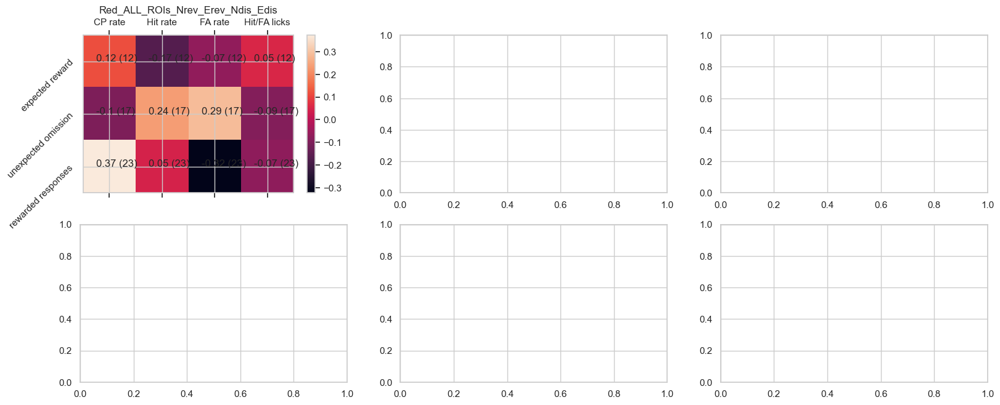

In [566]:
channels = ['Red','Green']
ROIs_list = {'ALL_ROIs':['Red','Green'],
             'correlated_ROIs':['Red','Green'],
            'uncorrelated_ROIs':['Red','Green']}
protocols_list = [['Nrev','Erev','Ndis','Edis']]
nrows = len(channels)
ncols = len(ROIs_list)*len(protocols_list)
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(6.33*3,3.66*2))

for row, (channel) in enumerate(channels):
    col = 0
    for ROIs, ROIs_chan in ROIs_list.items():
        if channel in ROIs_chan:
            for protocols in protocols_list:
                norm_dfs = []
                all_sessions = extracted_behavior['deltaF']['sesh_by_sesh']
                protocol_df = all_sessions[all_sessions.index.get_level_values('Protocol').isin(protocols)]
                for index, rows in protocol_df.iterrows():
                    protocol = index[1]
                    ID = index[0].split(protocol)[0][:-1]
                    sesh = index[0].split(protocol)[1][1:]
                    reward = all_metrics['events']['reward'][ROIs]

                    sesh_event_metrics = reward[(reward.index.get_level_values('ID') == ID) & (reward.index.get_level_values('Unique_ROI').str.contains(sesh)) & (reward.index.get_level_values('Channel') == channel)]
                    sesh_event_rate = sesh_event_metrics['rate']    

                    norm_rate = {}
                    new_rate = {}
                    for pair, label in zip([['rewarded FA','rewarded hit'],['unrewarded hit','unrewarded FA'],['rewarded responses','unrewarded responses'],['unexpected outcomes','expected outcomes']],
                                           ['unexpected reward','unexpected omission','rewarded responses','unexpected outcomes']):
                        df = sesh_event_rate[[pair[0],pair[1]]]
                        raw0 = df[pair[0]].mean()
                        raw1 = df[pair[1]].mean()
                        norm_rate[pair[0]] = raw0
                        norm_rate[pair[1]] = raw1
                        df = df.dropna(how='any')
                        if df.shape[0] > 0:
                            mean_df = df.mean().to_frame().T
                            norm = (mean_df[pair[0]] / mean_df[pair[1]]).values[0]
                            norm_rate[label] = norm
                        else:
                            norm_rate[label] = np.nan
                    norm_df = pd.DataFrame(norm_rate.values(), index=norm_rate.keys()).T
                    norm_df['index'] = index[0]
                    norm_df['Protocol'] = protocol
                    norm_df = norm_df.reset_index().set_index(['index','Protocol']).iloc[:,1:]
                    norm_dfs.append(norm_df)
                final_df = pd.concat([protocol_df, pd.concat(norm_dfs)], axis=1).replace({float('inf'):np.nan})
                for pair in [['rewarded hit','rewarded FA'],['unrewarded hit','unrewarded FA']]:
                    pairmax = final_df[pair].max().max()
                    pairmin = final_df[pair].min().min()
                    
                    for p in pair:
                        final_df[p] = (final_df[p]-pairmin)/(pairmax-pairmin)
                corr_df = final_df[['CP rate','Hit rate','FA rate','Hit/FA licks','unexpected reward','unexpected omission','rewarded responses']].astype(float).corr()
                plot_df = corr_df[['unexpected reward','unexpected omission','rewarded responses']].T[['CP rate','Hit rate','FA rate','Hit/FA licks']]
#                 display(final_df[['CP rate','Hit rate','FA rate','expected reward','unexpected omission']])
#                 display(plot_df)
                cax = ax[row,col].matshow(plot_df)
                ax[row,col].set_title(('_').join([channel, ROIs]+protocols))
                ax[row,col].set_xticks(list(range(4)))
                ax[row,col].set_xticklabels(['CP rate','Hit rate','FA rate','Hit/FA licks'])
                ax[row,col].set_yticks(list(range(3)))
                ax[row,col].set_yticklabels(['expected reward','unexpected omission', 'rewarded responses'], rotation=45)
                
                for x in range(4):
                    for y in range(3):
                        ttype = plot_df.iloc[y].name
                        n_ttype = final_df[ttype].dropna().shape[0]
                        ax[row,col].text(x-0.25,y,str(round(plot_df.iloc[y,x], 2))+' ('+str(n_ttype)+')')
                fig.colorbar(cax)
                plt.show()
                col += 1
                final_df.to_csv(data_directory+'\\'+channel+'_'+ROIs+'_behavior_population_reward_calcium_correlation.csv')

## Single-trial calcium-licking correlations ##

In [532]:
import random

In [533]:
def rolling_average(arr, window_size):
    if window_size <= 0:
        raise ValueError("Window size must be greater than 0")
    
    if len(arr) < window_size:
        raise ValueError("Window size is greater than array length")
    
    cumsum = np.cumsum(arr)
    cumsum[window_size:] = cumsum[window_size:] - cumsum[:-window_size]
    
    return cumsum[window_size - 1:] / window_size

In [534]:
def plot_line(y_intercept, slope, x_range, ax, row, col, color, linewidth, alpha, trial, trials, plot=False):
    # Generate x values within the specified range
    x = np.linspace(x_range[0], x_range[1], 100)

    # Calculate corresponding y values using the slope-intercept equation
    y = slope * x + y_intercept
    
    if plot == True:
        if trial in trials:
            ax[row,col].plot(x, y, color=color, linewidth=linewidth, alpha=alpha)
    else:
        None
        
    return x,y

### Get anticipatory lick times and centre them to first lick onset

In [535]:
behav = extracted_behavior['deltaF']['single_trial'].set_index(['Unique_trial','Unique session'])
latencies = [3+x for x in list(extracted_behavior['deltaF']['single_trial']['Response latency'])] #extract latencies and centre relative to stim onset
lick_times = [np.asarray(x) for x in list(extracted_behavior['deltaF']['single_trial']['Trial licks'])] #extract all lick times
anticipatory_lick_times = [[z-y for z in x[(x > y) & (x < y+1)]] for x,y in zip(lick_times, latencies)] #extract anticipatory lick times only
behav['ALT'] = anticipatory_lick_times #add this metric to the behav dataframe

### Try to get single-trial metric of licking ramping ###
**Cumulative count approach**
1. Plot the cumulative lick count step function
2. Fit a line of best fit to this function
3. Slope of this line indicates ramping (i.e. steeper slope = higher ramping) - this slope can only be positive as it is a cumulative count

**Binned count approach**
1. Bin the lick counts
2. Calculate a moving average across the bins and plot a line connecting the bins
3. Fit a line of best fit
4. Slope of this line indicates ramping or dampening (i.e. positive indicates ramping, negative indicates dampening)

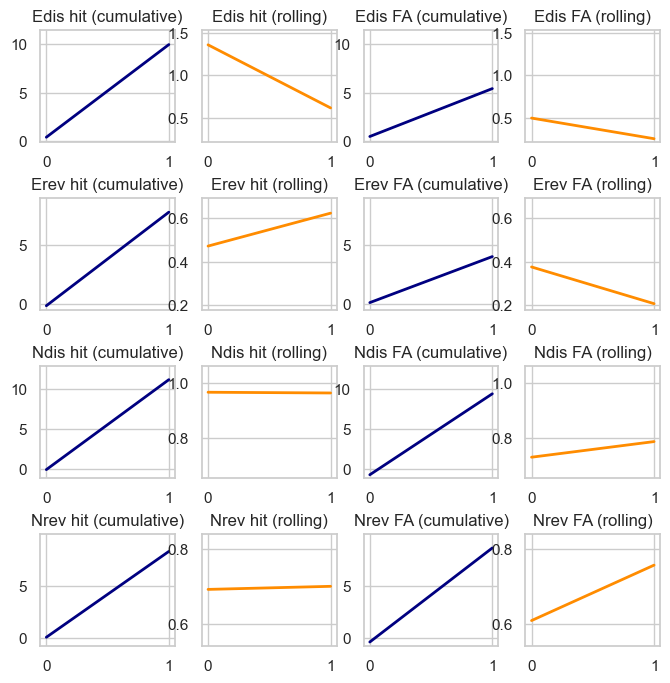

In [536]:
protocols = ['Edis','Erev','Ndis','Nrev']
ttypes = ['hit','FA']
bins = np.linspace(0,1,11)
rolling_window = 5
ntrials = 10

trial_metrics = []
fig, ax = plt.subplots(nrows=len(protocols), ncols=len(ttypes)*2, figsize=(8,8), sharey=False, gridspec_kw={'hspace':0.5})
for row, (protocol) in enumerate(protocols):
    protocol_df = behav[behav.Protocol == protocol]
    col = 0
    for ttype in ttypes:
        ttype_df = protocol_df[protocol_df['Final Outcome'].str.contains(ttype)]
        
        fit_lines = []
        binned_traces = []
        binned_fit = []
        random_trials = [random.randint(0,ttype_df.shape[0]) for x in range(ntrials)]
        for trial, (idx, rows) in enumerate(ttype_df.iterrows()):
            final_outcome = rows['Final Outcome']
            trace = rows['ALT']
            ## Section for fitting line of best fit to cumulative lick count (need at least 2 licks for this to work) ##
            if len(trace) > 1:
                finished_trace = trace + [1]
                slope, intercept = np.polyfit(finished_trace, list(range(len(finished_trace))), 1)
                
                ## Plot individual lines of best fit of cumulative count (set plot = True) ##
                x_fit, y_fit = plot_line(intercept, slope, [0,1], ax, row, col, color='black',linewidth=0.75, alpha=0.5, trial=trial, trials=random_trials, plot=False)
                fit_lines.append([x_fit, y_fit])
            
            ## Section for binning lick counts ##
            binned_trace = np.histogram(trace, bins=bins)
            x = 0.5 * ( binned_trace[1][1:] + binned_trace[1][:-1] ) 
            y = np.array([x-1 if i == 0 else x for i, (x) in enumerate(binned_trace[0])])
            rolling_x = [bins[rolling_window-1+i] for i, (x) in enumerate(range(len(rolling_average(y,rolling_window))))]
            rolling_y = rolling_average(y,rolling_window)
            binned_slope, binned_intercept = np.polyfit(rolling_x, rolling_y, 1)
            x_fit_binned, y_fit_binned = plot_line(binned_intercept, binned_slope, [0,1], ax, row, col, color='black',linewidth=0.75, alpha=0.5, trial=trial, trials=random_trials, plot=False)           
            if trial in random_trials:
                ## Plot individual lines of best fit of rolling average (set plot = True) ##
                x_fit_binned, y_fit_binned = plot_line(binned_intercept, binned_slope, [0,1], ax, row, col, color='black',linewidth=0.75, alpha=0.5, trial=trial, trials=random_trials, plot=False)              
                
                ## Plot rolling averages ##
#                 ax[row,col].plot(rolling_x, rolling_y, linewidth=0.75, alpha=0.5)
            binned_traces.append([x, y])            
            binned_fit.append([x_fit_binned, y_fit_binned])
            
            ## Put together all metrics into a single trial dataframe ##
            idx_df = pd.DataFrame([[slope, binned_slope, final_outcome]], index=pd.MultiIndex.from_tuples([idx]), columns=['cumulative slope','rolling slope','Final Outcome'])
            trial_metrics.append(idx_df)

######################################################## SECTION FOR PLOTTING MEAN FITS #####################################################################
            
        ## Get mean of cumulative best fit lines ##
        fit_array = np.array(fit_lines)
        mean_fit = np.mean(fit_array, axis=0)
        sem_fit = np.std(fit_array, axis=0) / np.sqrt(mean_fit.shape[0])
        ## Plot mean of cumulative best fit lines
        ax[row,col].plot(mean_fit[0], mean_fit[1], color='navy',linewidth=2)
#         ax[row,col].fill_between(mean_fit[0], mean_fit[1]-sem_fit[1], mean_fit[1]+sem_fit[1], color='navy', alpha=0.5)
        ax[row,col].set_title(f'{protocol} {ttype} (cumulative)')
        col += 1

        
        ## Get mean of rolling best fit lines ##
        binned_fits = np.array(binned_fit)
        mean_binned_fit = np.mean(binned_fits, axis=0)
        sem_binned_fit = np.std(mean_binned_fit, axis=0) / np.sqrt(mean_binned_fit.shape[0])
        ## Plot mean of rolling best fit lines ##
        ax[row,col].plot(mean_binned_fit[0], mean_binned_fit[1], color='darkorange',linewidth=2)
#         ax[row,col].fill_between(mean_binned_fit[0], mean_binned_fit[1]-sem_binned_fit[1], mean_binned_fit[1]+sem_binned_fit[1], color='darkorange', alpha=0.5)
        ax[row,col].set_title(f'{protocol} {ttype} (rolling)')
        col += 1

        ## Reset ylims ##
        if col == 4:
            cumulative_max = np.max([ax[row,0].get_ylim()[1], ax[row,2].get_ylim()[1]])*1.1
            cumulative_min = np.min([ax[row,0].get_ylim()[0], ax[row,2].get_ylim()[0]])*0.9
            rolling_max = np.max([ax[row,1].get_ylim()[1], ax[row,3].get_ylim()[1]])*1.1
            rolling_min = np.min([ax[row,1].get_ylim()[0], ax[row,3].get_ylim()[0]])*0.9
            
            ax[row,0].set_ylim(cumulative_min, cumulative_max)
            ax[row,2].set_ylim(cumulative_min, cumulative_max)
            ax[row,1].set_ylim(rolling_min, rolling_max)
            ax[row,3].set_ylim(rolling_min, rolling_max)

####################################################### SECTION FOR PLOTTING ACTUAL TRACES ############################################################
        
        ## Get mean of rolling average traces ##
        binned_array = np.array(binned_traces)
        mean_array = np.mean(binned_array, axis=0)
        sem_array = np.std(binned_array, axis=0) / np.sqrt(binned_array.shape[0])
        ## Plot mean of rolling average traces ##
#         ax[row,col].plot(mean_array[0], mean_array[1], linewidth=1, alpha=1, color='darkorange')
#         ax[row,col].fill_between(mean_array[0], mean_array[1]-sem_array[1], mean_array[1]+sem_array[1], alpha=0.15, color='darkorange')
plt.show()
trial_metrics = pd.concat(trial_metrics)

### Look at distribution of scores for each ramping metric to see which metric might be better ###

In [537]:
for protocol in ['Ndis','Edis','Nrev','Erev']:
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8,6), sharex='row', sharey='row')
    protocol_metrics = trial_metrics[trial_metrics.index.str.contains(protocol)]
    for row, (metric_name, color) in enumerate(zip(['cumulative slope', 'rolling slope'],['navy','darkorange'])):
        ax[row,0].hist(protocol_metrics[metric_name], color=color, alpha=0.5)
        ax[row,1].hist(protocol_metrics[protocol_metrics['Final Outcome'].str.contains('hit')][metric_name], color='darkgreen',alpha=0.5)
        ax[row,1].hist(protocol_metrics[protocol_metrics['Final Outcome'].str.contains('FA')][metric_name], color='darkred',alpha=0.5)
        ax[row,0].set_title(f'{metric_name} all trials', fontsize=10)
        ax[row,1].set_title(f'{metric_name} hit vs. FA trals', fontsize=10)
    fig.suptitle(protocol)
    plt.show()

AttributeError: Can only use .str accessor with Index, not MultiIndex

## Which correlations are strong? ##
**reward + response modulated ROIs**
1. post-reversal axons, when pearson correlating z-scored nEvents/nROIs with anticipatory score (rolling slope)
2. post-reversal axons, when spearman correlating raw nEvents/nROIs with anticipatory licks or anticipatory score (cumulative slope)
3. Nothing really in the dendrites

**reward modulated ROIs**
1. Nothing really in terms of activity rates

2. post-reversal dendrites, when pearson correlating z-scored peak with anticipatory score (both cumulative and rolling slope)
3. post-reversal dendrites, when spearman correlating z-scored peak with anticipatory licking
4. pretty much (1) and (2) are the same with raw values as well

**all ROIs**
1. pre-reversal dendrites and post-reversal axons, when spearman correlating raw nEvents/nROIs with anticipatory licks
2. pre-reversal dendrites, when pearson correlating raw nEvents/nROIs with anticipatory score (both cumulative and rolling slope)

3. when pearson correlating raw peak with cumulative anticipatory score, pre- and post-reversal dendrites show opposite trends (and also strong pre-reversal axons trends)
4. z-scoring (3) only shows pre-reversal axons and post-reversal dendrites
5. (3) and 4) are exactly the same with rolling slope
6. (3), (4), and (5) are the same trends when spearman correlating with anticipatory licks (i.e. -ve post-reversal dendrites, +ve pre-reversal axons and dendrites)

***It seems like pre-reversal, the strength of reward signals directly scale with anticipation in both the axons and the dendrites (i.e. strong signals if they receive a reward when they are expecting it). However the opposite is true in the dendrites post-reversal (i.e. stronger reward signals when they are not expecting it). These findings are best illustrated by pearson correlating raw peak with anticipatory score (rolling slope). Rew +ve dendrites post-reversal show paritcularly strong correlation between z-scored peak and anticipatory score.***

***While the dendrites show greater peaks on unexpected rewards on the population level (and similar trends for axons), this is not the case for rew +ve ROIs.***

***How about if we combine axons/dendrites together for event rate? Unfortunately the rew +ve, all,  ROIs don't show any correlations in terms of nEvents/nROIs with any anticipatory metrics. Combining rew +ve and lick +ve ROIs leads to strong spearman correlation between raw nEvents/nROIs and anticipatory licking post-reversal, but not pre-reversal***

***How about if we look at the intersecion of rew +ve and lick +ve ROIs (only 17 ROIs post-reversal and 16 pre-reversal)? No dice***

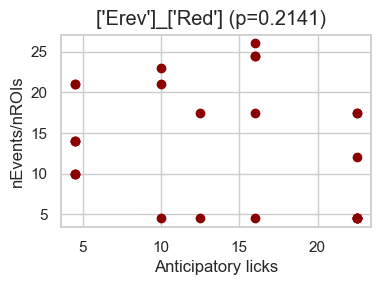

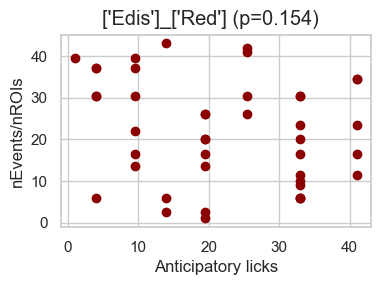

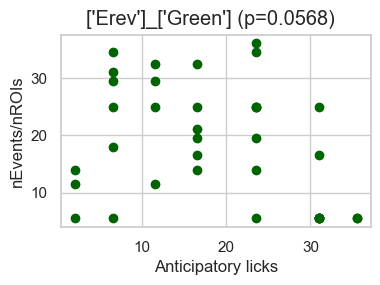

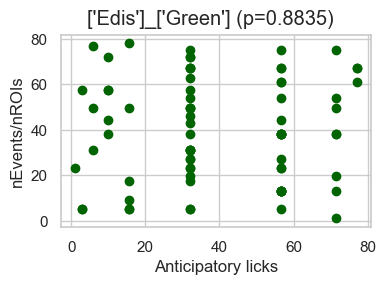

In [552]:
include = {'reward':{'modulation':['rewarded'], 
                     'ttypes':['rewarded hit','rewarded FA']}
          }
intersect = False
protocols = [['Erev'],['Edis']]
r = 'spearman'
calcium_metric = 'nEvents/nROIs'
lick_metric = 'Anticipatory licks'
slope_type = 'rolling slope'
normalize = False

## Combine lick metrics with ramp metrics
trial_metrics.index.names = ['Unique_ID', 'Unique session']
lick_behav = pd.concat([behav, trial_metrics], axis=1).dropna(how='any')
lick_behav['Anticipatory score'] = lick_behav['Anticipatory licks'] + (lick_behav[slope_type])#-lick_behav[slope_type].min())/(lick_behav[slope_type].max()-lick_behav[slope_type].min())
lick_behav.index.names = ['Unique_trial', 'Unique session']
## Normalize all values session-by-session ##
lick_behav_normalized = []
sesh_groups = lick_behav.groupby(lick_behav.index.get_level_values('Unique session'))
for sesh in lick_behav.index.get_level_values('Unique session').unique():
    sesh_df = sesh_groups.get_group(sesh)[['Anticipatory licks', 'Anticipatory score','Reward licks','cumulative slope','rolling slope']]
    lick_behav_normalized.append(sesh_df.apply(zscore))
lick_behav_normalized = pd.concat(lick_behav_normalized)

for epoch, epoch_df in cohort_epochs['deltaF'].items():
    if epoch in include.keys():
        modulation = include[epoch]['modulation']
        all_deltaF = pd.concat(epoch_df)
        all_events = pd.concat(cohort_epochs['events'][epoch])

        if modulation == ['all']:
            ROI_deltaF = all_deltaF
            ROI_events = all_events
        else:
            for i, (m) in enumerate(modulation):
                if i == 0:
                    ROIs_to_include = [item for key, sublist in modulated_ROIs[epoch][m].items() for item in sublist]
                else:
                    if intersect == False:
                        ROIs_to_include = ROIs_to_include + [item for key, sublist in modulated_ROIs[epoch][m].items() for item in sublist]
                    else:
                        ROIs_to_include = np.intersect1d(ROIs_to_include, [item for key, sublist in modulated_ROIs[epoch][m].items() for item in sublist])
            ROIs_to_include = list(set(ROIs_to_include))
            ROI_deltaF = all_deltaF[all_deltaF.index.get_level_values('Unique_ROI').isin(ROIs_to_include)]
            ROI_events = all_events[all_events['Unique_ROI'].isin(ROIs_to_include)]
           
        ROI_trials = ROI_deltaF.groupby([ROI_deltaF.index.get_level_values('Unique_trial'), ROI_deltaF.index.get_level_values('Channel'), ROI_deltaF.index.get_level_values('Protocol'), ROI_deltaF.index.get_level_values('Unique session'), ROI_deltaF.index.get_level_values('Final Outcome')]).mean()
        ROI_numbers = ROI_deltaF.groupby([ROI_deltaF.index.get_level_values('Unique_trial'), ROI_deltaF.index.get_level_values('Channel'), ROI_deltaF.index.get_level_values('Unique session'), ROI_deltaF.index.get_level_values('Final Outcome')]).size().to_frame().rename({0:'nROIs'},axis=1)
        
        for timing in ['Response latency','Water_time','Timeout_end']:
            ROI_events[timing] = [np.nan if x == '-' else float(x) for x in list(ROI_events[timing])]
        ROI_events = fn.centre_event_latency(ROI_events, epoch)
        metrics = ROI_events[['Unique_trial','Channel', 'Unique session', 'Final Outcome', 'peak','ev_latency','peak_time','ev_offset','ev_duration','integral']]
        metrics = metrics.groupby([metrics['Unique_trial'], metrics['Channel'], metrics['Unique session'], metrics['Final Outcome']]).mean()
        nEvents = ROI_events.groupby([ROI_events['Unique_trial'], ROI_events['Channel'], ROI_events['Unique session'], ROI_events['Final Outcome']]).size().to_frame().rename({0:'nEvents'},axis=1)
        empty_df = pd.DataFrame([], index=ROI_numbers.index, columns=['nEvents']).replace({np.nan:0})
        non_events = empty_df[~empty_df.index.isin(nEvents.index.unique())]
        nEvents = pd.concat([nEvents, non_events])
        penultimate_df = pd.concat([nEvents, ROI_numbers, metrics], axis=1)[['nEvents','nROIs','peak','ev_latency','peak_time','ev_offset','ev_duration','integral']]
        penultimate_df['nEvents/nROIs'] = penultimate_df['nEvents']/penultimate_df['nROIs']
        
        ## Section to normalize event metrics ##
        penultimate_normalized = []
        penultimate_groups = penultimate_df.groupby(penultimate_df.index.get_level_values('Unique session'))
        for sesh in penultimate_df.index.get_level_values('Unique session').unique():
            penultimate_sesh = penultimate_groups.get_group(sesh)[['nEvents/nROIs','peak','ev_latency','peak_time','ev_offset','ev_duration','integral']]
            sesh_normalized = []
            for col, value in penultimate_sesh.items():
                normalized = zscore(value.dropna()).to_frame()
                sesh_normalized.append(normalized)
            penultimate_normalized.append(pd.concat(sesh_normalized, axis=1))
        penultimate_normalized = pd.concat(penultimate_normalized)    
        
        ## Section to select trial types of interest
        ttypes = []
        for t in include[epoch]['ttypes']:
            ttypes.append('Tactile '+t)
            ttypes.append('Auditory '+t)
        ttype_normalized = penultimate_normalized[penultimate_normalized.index.get_level_values('Final Outcome').isin(ttypes)].reset_index().set_index(['Unique_trial','Unique session'])
        ttype_df = penultimate_df[penultimate_df.index.get_level_values('Final Outcome').isin(ttypes)].reset_index().set_index(['Unique_trial','Unique session'])

        final_df_normalized = ttype_normalized.merge(lick_behav_normalized, on=ttype_normalized.index.names).dropna(how='any')
        final_df = ttype_df.merge(lick_behav, on=ttype_df.index.names).dropna(how='any')
        corr_df = final_df_normalized if normalize == True else final_df
        
# #         #         final_df.to_csv(data_directory+'\\SINGLE_TRIAL_CORRELATEIONS_'+epoch+'.csv')

        for channel in [['Red'],['Green']]:
            if len(channel) == 1:
                color = 'darkred' if channel[0] == 'Red' else 'darkgreen'
            else:
                color ='darkorange'
            df = corr_df[corr_df.Channel.isin(channel)][['Anticipatory licks', 'Anticipatory score','Reward licks','nEvents/nROIs','peak']]
            for protocol in protocols:
                protocol_df = df[df.index.get_level_values(0).isin([x for y in protocol for x in list(df.index.get_level_values(0)) if y in x])]
                rank_df = protocol_df.rank(method='average')
                p_df = fn.calculate_pvalues(protocol_df, r)
                p = round(p_df.loc[calcium_metric,lick_metric],4)
                plt.figure(figsize=(4,2.5))
                if r == 'spearman':
                    plt.scatter(rank_df[lick_metric], rank_df[calcium_metric], color=color)
                else:
                    plt.scatter(protocol_df[lick_metric], protocol_df[calcium_metric], color=color)                  
                plt.suptitle(f'{protocol}_{channel} (p={p})')
                plt.ylabel(calcium_metric)
                plt.xlabel(lick_metric)
#                 plt.xlim(0,1)
                plt.show()

## Make this previous trial, and add correlated/uncorrelated ROI label
## Then try outcome encoding averaged over the last 10 trials for each ROI as an individual feature instead

In [ ]:
both_channels = []
for channel, channel_dict in all_single_trials.items():
    channel_df = pd.concat(channel_dict)
    channel_df = channel_df[channel_df.index.get_level_values(0) == 'all']
    for index, rows in channe
#     both_channels.append(channel_df)
# both_df = pd.concat(both_channels)
# both_df['ev_latency'] = both_df['ev_onset'] - both_df['inferred']
# both_df.to_csv('reward_all_single_trials.csv')
        
#     if rows['Response latency'] isnan == True:
#     print(type(rows['Response latency']))
#     channel_df.to_csv(channel+'_delayed_reward_single_trial_correlations.csv')

In [ ]:
somas = {'RGECO_GCamP_Batch2_five':[],'RGECO_GCamP_Batch2_three':['FOV4']} #somatic recording sessions (to remove from "Red" channel data)

FOV_norm_means = {}
all_reward_events = pd.concat(all_event_rates, axis=1)
all_reward_events
all_reward_events = all_reward_events.replace({0:np.nan})
for soma, soma_list in somas.items():
    if len(soma_list) == 0:
        all_reward_events = all_reward_events[~(all_reward_events.index.get_level_values(0).str.contains(soma))]
    else:
        FOV = soma_list[0]
        all_reward_events = all_reward_events[~((all_reward_events.index.get_level_values(0).str.contains(soma)) & (all_reward_events.index.get_level_values(0).str.contains(FOV)))]
all_reward_events = all_reward_events[~(all_reward_events.index.get_level_values(0).str.contains('RGECO_GCamP_Batch1_muji_Edis_221104_FOV3.1'))]

for channel in ['Red','Green']:
    channel_df = all_reward_events[all_reward_events.index.get_level_values(0).str.contains(channel)]
    correlated_dfs = []
    uncorrelated_dfs =[]
    for index, rows in channel_df.iterrows():
        mouse = ('_').join(index[0].split('_')[:4])
        ROI = index[0].split(mouse)[1][1:]

        if len(correlated_ROIs[mouse].keys()) > 0:
            if ROI in correlated_ROIs[mouse].keys():
                correlated_dfs.append(rows.to_frame().T)
            else:
                uncorrelated_dfs.append(rows.to_frame().T)
        else:
                uncorrelated_dfs.append(rows.to_frame().T)            
    correlated_df = pd.concat(correlated_dfs)
    correlated_df.index.names = channel_df.index.names
    uncorrelated_df = pd.concat(uncorrelated_dfs)
    uncorrelated_df.index.names = channel_df.index.names
    
    for label, df in zip(['correlated_ROIs','uncorrelated_ROIs','ALL_ROIs'], [correlated_df, uncorrelated_df, channel_df]):
        df['FOV'] = [('_').join(x.split('_')[:-2]) for x in list(df.index.get_level_values('Final index'))]
        df = df.reset_index().set_index(['FOV','Final index','Protocol'])
        FOV_means = df.groupby([df.index.get_level_values('FOV'), df.index.get_level_values('Protocol')]).mean()
        norm_type = {}
        for ttype in FOV_means.columns:
            norm_type[ttype] = FOV_means['rewarded hit']
        normalizer = pd.concat(norm_type, axis=1)
        norm_df = df.div(normalizer)
        if label == 'ALL_ROIs':
#             protocol_df = norm_df[(norm_df.index.get_level_values('Protocol').str.contains('dis')) | (norm_df.index.get_level_values('Protocol').str.contains('rev'))]
            protocol_df = norm_df
            FOV_norms = protocol_df.groupby([protocol_df.index.get_level_values('FOV'), protocol_df.index.get_level_values('Protocol')]).mean()
            correlation_df = pd.merge(FOV_norms, imaging_behavior, left_index=True, right_index=True)
            correlation_df = correlation_df[['rewarded FA', 'unrewarded hit', 'rewarded hit','CP rate','Hit rate','FA rate','Rare outcome proportion','Hit/FA licks']]
            correlation_df.to_csv(channel+'_behavior_population_reward_calcium_correlation.csv')
            df.to_csv(('_').join([label,channel,'reward_event_rate.csv']))
            norm_df.to_csv(('_').join([label,channel,'reward_NORM_event_rate.csv']))
        else:
            df.to_csv(('_').join([label,str(event_thresh),channel,'reward_event_rate.csv']))
            norm_df.to_csv(('_').join([label,str(event_thresh),channel,'reward_NORM_event_rate.csv']))

In [ ]:
if 'deltaF_pupil.npy' in os.listdir(cwd):
    print('deltaF_pupil.npy file found')
    print('deltaF_pupil.npy file uploading now...')
    deltaF_pupil = np.load('deltaF_pupil.npy', allow_pickle=True)
    print('finished uploading')

else:
    print('deltaF_pupil.npy file not found')
    print('deltaF_pupil.npy file creating now...')    
    import time
    start = time.time()

    deltaF_df = pd.concat(cohort_deltaF)
    pupil_df = pd.concat(cohort_pupil)
    deltaF_pupil = {}
    mouse_groups = deltaF_df.groupby(deltaF_df.index.get_level_values(0))
    for mouse in deltaF_df.index.get_level_values(0).unique():
        deltaF_pupil[mouse] = {}
        mouse_df = mouse_groups.get_group(mouse)
        ROI_groups = mouse_df.groupby(mouse_df.index.get_level_values('Unique_ROI'))
        mouse_correlation = {}

        for i, (ROI) in enumerate(mouse_df.index.get_level_values('Unique_ROI').unique()):
            ROI_df = ROI_groups.get_group(ROI)
            deltaF_list = []
            pupil_list = []
            df_dict = {}
            for j, (index, rows) in enumerate(ROI_df.iterrows()):
                midx_number = np.where(np.asarray(ROI_df.index.names) == 'Unique_trial')[0][0]
                unique_trial = index[midx_number]
                mouse_pupil = pupil_df[pupil_df.index.get_level_values(0) == mouse]

                if unique_trial in mouse_pupil.index.get_level_values('Unique_trial'):
                    trial_pupil = np.asarray(mouse_pupil[mouse_pupil.index.get_level_values('Unique_trial') == unique_trial].iloc[0])
                    downsampled_pupil = np.asarray([np.mean(x) for x in list(split(trial_pupil, rows.shape[0]))])
                    trial_df = pd.DataFrame([np.asarray(rows), downsampled_pupil], index=['deltaF', 'pupil']).T
                    df_dict[unique_trial] = trial_df
            mouse_correlation = pd.concat(df_dict) if len(df_dict.keys()) > 0 else pd.DataFrame([], index=['deltaF', 'pupil']).T
            deltaF_pupil[mouse][ROI] = mouse_correlation
    pickle.dump(deltaF_pupil, open("deltaF_pupil.npy", "wb"))

    end = time.time()
    print(end-start, 'seconds taken to create')

In [ ]:
for epoch, epoch_dict in cohort_epochs['pupil'].items():
    if epoch == 'all':
        epoch_df = pd.concat(epoch_dict).dropna(how='all')
        dfs = []
        for index, rows in epoch_df.iterrows():
            water = index[12]
            lick = index[7]
            
            if lick == '-':
                water = 4500
            else:
                if water == '-':
                    water = int(lick)+1000
                else:
                    water = int(water)
            water_fps = math.floor(water/1000*30*30)
            dfs.append(rows.iloc[water_fps:water_fps+1800].to_numpy())
        df = pd.DataFrame(dfs, index=epoch_df.index, columns=list(range(900)))
        
        peak_df = df.max(axis=1).to_frame()
        peak_df['Response latency'] = peak_df.index.get_level_values('Response latency')
        peak_df['Prestim licks'] = peak_df.index.get_level_values('Prestim licks')
        peak_df['Anticipatory licks'] = peak_df.index.get_level_values('Anticipatory licks')
        peak_df['Reward licks'] = peak_df.index.get_level_values(' Reward licks')
        peak_df = peak_df.droplevel(['Response latency','Prestim licks','Anticipatory licks',' Reward licks'])
        peak_df = peak_df.rename({0:'Peak dilation'}, axis=1)

        ttype_peaks = []
        for t in ['rewarded hit', 'unrewarded hit', 'rewarded FA', 'unrewarded FA']:
            if t in ['rewarded hit','rewarded FA']:
                ttype_peak = peak_df[(peak_df.index.get_level_values('Final Outcome') == 'Tactile '+t) | (peak_df.index.get_level_values('Final Outcome') == 'Auditory '+t)].T
            else:    
                ttype_peak = peak_df[peak_df.index.get_level_values('Final Outcome').str.contains(t)].T
            ttype_peak.index = pd.MultiIndex.from_tuples((x,y) for x,y in zip(ttype_peak.index, [t]*ttype_peak.shape[0]))
            ttype_peak = ttype_peak.T.droplevel('Final Outcome')
            ttype_peaks.append(ttype_peak)
        ttype_peak_df = pd.concat(ttype_peaks, axis=1).sort_index(level=0, axis=1)
    ttype_peak_df.to_csv('delayed_reward_SINGLE_TRIAL_PUPIL.csv')

    sesh_by_sesh = ttype_peak_df.groupby([ttype_peak_df.index.get_level_values(0), ttype_peak_df.index.get_level_values('Unique session'), ttype_peak_df.index.get_level_values('Protocol')]).mean()
    sesh_by_sesh['sesh'] = sesh_by_sesh.index.get_level_values(0) + '_' + sesh_by_sesh.index.get_level_values('Unique session')
    sesh_by_sesh.to_csv('delayed_reward_sesh_by_sesh_PUPIL.csv')

In [ ]:
for epoch, epoch_dict in cohort_epochs['events'].items():
    if epoch == 'all':
        epoch_df = pd.concat(epoch_dict)
        
        for soma, soma_list in somas.items():
            if len(soma_list) == 0:
                epoch_df = epoch_df[epoch_df.index.get_level_values(0) != soma]
            else:
                FOV = soma_list[0]
                epoch_df = epoch_df[~((epoch_df.index.get_level_values(0).str.contains(soma)) & (epoch_df['FOV'].str.contains(FOV)))]
        

        deltaF_df = pd.concat(cohort_epochs['deltaF'][epoch])
        deltaF_dfs = []
        for index, rows in deltaF_df.iterrows():
            water = index[12]
            lick = index[7]

            if lick == '-':
                water = 4500
            else:
                if water == '-':
                    water = int(lick)+1000
                else:
                    water = int(water)
            water_fps = math.floor(water/1000*30.3)
            deltaF_dfs.append(rows.iloc[water_fps:water_fps+30].to_numpy())
        deltaF_df = pd.DataFrame(deltaF_dfs, index=deltaF_df.index, columns=list(range(30)))
        
        for protocol in ['Ndet','Ndis', 'Nrev']:
            plt.figure()
            legends = []
            for t, c in zip(['rewarded hit', 'unrewarded hit', 'rewarded FA', 'unrewarded FA'], ['navy','magenta','cyan','orange']):
                ttype_df = deltaF_df[(deltaF_df.index.get_level_values('Final Outcome') == 'Tactile '+t) | (deltaF_df.index.get_level_values('Final Outcome') == 'Auditory '+t)]
                ttype_df = ttype_df[ttype_df.index.get_level_values('Protocol') == protocol]
                ttype_df = ttype_df[ttype_df.index.get_level_values('Channel') == 'Red']
                plt.plot(list(range(30)), ttype_df.mean(), color=c)
                plt.fill_between(list(range(30)), ttype_df.mean()-ttype_df.sem(), ttype_df.mean()+ttype_df.sem(), color=c, alpha=0.5)
                legends.append(t)
                legends.append(t)
            plt.legend(legends)
            plt.suptitle(protocol)


#         correlated_dfs = []
#         for index, rows in epoch_df.iterrows():
#             mouse = index[0]
#             ROI = rows['Unique_ROI']

#             if len(correlated_ROIs[mouse].keys()) > 0:
#                 if ROI in correlated_ROIs[mouse].keys():
#                     correlated_dfs.append(rows.to_frame().T)

#         if len(correlated_dfs) == 0:
#             correlated_df = epoch_df
#         else:
#             correlated_df = pd.concat(correlated_dfs)
#             correlated_df.index.names = correlated_df.index.names

#         for label, df in zip(['ALL_ROIs','correlated_ROIs'],[epoch_df, correlated_df]):
#             if label == 'ALL_ROIs':
#                 epoch_event_rates = []
#                 epoch_event_metrics_list = []
#                 plt.figure()
#                 legends = []
#                 for t in ['rewarded hit', 'unrewarded hit', 'rewarded FA', 'unrewarded FA']:
#                     ttype_events = df[(df['Final Outcome'] == 'Tactile '+t) | (df['Final Outcome'] == 'Auditory '+t)]
#                     ROI_event_count = ttype_events.groupby([ttype_events.index.get_level_values(0), 'Unique_ROI', 'Protocol']).size()
#                     plt.hist(ROI_event_count, alpha=0.5)
#                     legends.append(t)
#                 plt.legend(legends)
#                 ROI_deltaF_df = deltaF_df[deltaF_df.index.get_level_values('Unique_ROI').isin(list(ROI_event_count.index.get_level_values('Unique_ROI')))]
#                 ttype_deltaF = ROI_deltaF_df[ROI_deltaF_df.index.get_level_values('Final Outcome').str.contains(t)]
#                 ROI_trial_count = ttype_deltaF.groupby([ttype_deltaF.index.get_level_values(0), ttype_deltaF.index.get_level_values('Unique_ROI'), ttype_deltaF.index.get_level_values('Protocol')]).size()
#                 ROI_event_rate = ROI_event_count / ROI_trial_count
#                 ROI_event_rate_df = pd.DataFrame(ROI_event_rate.values, index=ROI_event_rate.index, columns=[t])
#                 epoch_event_rates.append(ROI_event_rate_df)
#                 epoch_event_means = ttype_events.groupby([ttype_events.index.get_level_values(0), 'Unique_ROI', 'Final Outcome','Protocol']).mean()

#                 outcome_df = ttype_events.groupby([ttype_events.index.get_level_values(0),ttype_events['Unique_ROI'], ttype_events['Protocol']]).mean().T.reset_index()
#                 outcome_df.index = pd.MultiIndex.from_tuples([(x,y) for x,y in zip(outcome_df['index'], [t]*outcome_df.shape[0])])
#                 outcome_df = outcome_df.T
#                 epoch_event_metrics_list.append(outcome_df)
#             epoch_event_metrics = pd.concat(epoch_event_metrics_list, axis=1).T

#             epoch_event_metric_list = []
#             for metric in ['response latency', 'Prestim licks', 'Anticipatory licks', 'Reward licks', 'Stimulus', 'peak', 'ev_onset', 'peak_time', 'integral']:
#                 metric_df = epoch_event_metrics[epoch_event_metrics.index.get_level_values(0) == metric]
#                 epoch_event_metric_list.append(metric_df)
#             epoch_event_metrics = pd.concat(epoch_event_metric_list).T
#             epoch_event_rate = pd.concat(epoch_event_rates, axis=1)

#             for channel in ['Red','Green']:
#                 channel_epoch_event_rate = epoch_event_rate[epoch_event_rate.index.get_level_values('Unique_ROI').str.contains(channel)]
#                 channel_epoch_event_metrics = epoch_event_metrics[epoch_event_metrics.index.get_level_values('Unique_ROI').str.contains(channel)]

#                 channel_epoch_event_rate.to_csv(('_').join([label,channel,epoch,'event_rate.csv']))
#                 channel_epoch_event_metrics.to_csv(('_').join([label,channel,epoch,'event_metrics.csv']))

In [ ]:
def plot_pupil(data, epochs, protocols, outcomes, plottype, trials, event_epochs=None):
    data = data['pupil']
    if type(epochs) == str:
        if epochs == 'all':
            epochs = data.keys()
    else:   
        epochs = epochs
        
    for epoch, epoch_dict in data.items():
        if epoch in epochs:
            epoch_df = pd.concat(epoch_dict)
            epoch_df = epoch_df[epoch_df.index.get_level_values('Stimulus') != float(3)]   
            
            if type(protocols) == str:
                if protocols == 'all':
                    protocols = ['N','E'] + list(epoch_df.index.get_level_values('Protocol').unique())
            else:
                protocols = protocols
            
            for protocol in protocols:
                view_outcomes = []
                labels = []
                
                for outcome in outcomes:
                    if (outcomes == ['FA', 'hit']) | (outcomes == ['hit', 'FA']):
                        for label, reward in zip(['rewarded', 'unrewarded'],[float(1), float(0)]):
                            rew_df = epoch_df[epoch_df.index.get_level_values('Water') == reward]
                            out_df = rew_df[rew_df.index.get_level_values('Final Outcome').str.contains(outcome)]
                            view_outcomes.append(out_df)
                            labels.append(label+' '+outcome)
                    else:
                            out_df = epoch_df[epoch_df.index.get_level_values('Final Outcome').str.contains(outcome)]
                            view_outcomes.append(out_df)
                            labels.append(outcome)                            
                
                n = len(view_outcomes)
                fig, ax = plt.subplots(nrows=1, ncols=n, figsize=(5*n,3), sharey=True)
                if plottype == 'trials':
                    color = cm.rainbow(np.linspace(0, 1, n)) 
                    for col, (outcome_df, color, label) in enumerate(zip(view_outcomes, color, labels)):
                        outcome_df = outcome_df[outcome_df.index.get_level_values('Protocol').str.contains(protocol)]
                        
                        if trials == 'events':
                            outcome_df = get_event_trials(outcome_df, 'pupil', event_epochs)
                        else:
                            outcome_df = outcome_df
                        
                        nmice = len(outcome_df.index.get_level_values(0).unique())
                        nsessions = len(outcome_df.index.get_level_values('Unique session').unique())
                        mouse_counts = {}
                        for mouse in outcome_df.index.get_level_values(0).unique():
                            mouse_counts[mouse] = len(outcome_df[outcome_df.index.get_level_values(0) == mouse].index.get_level_values('Unique_trial').unique())
                            
                        unique = outcome_df.groupby(outcome_df.index.get_level_values('Unique_trial')).mean()
                        ntrials = unique.shape[0]
                        mean = unique.mean()
                        sem = unique.sem()
                        ax[col].plot(mean, color=color)
                        ax[col].fill_between(x=list(range(unique.shape[1])), y1=mean-sem, y2=mean+sem, color=color, alpha=0.5)
                        if epoch == 'all':
                            ax[col].set_xticks(np.linspace(0,unique.shape[1],13))
                            ax[col].set_xticklabels([int(x) for x in np.linspace(0,12,13)])      
                        else:
                            ax[col].set_xticks(np.linspace(0,unique.shape[1],11))
                            ax[col].set_xticklabels([str(round(x,1)) for x in np.linspace(0,1,11)])
                        
                        title = str(nsessions)+' sessions/'+str(ntrials)+' trials \n '                     
                        for i, (key, value) in enumerate(mouse_counts.items()):
                            title += ' \n '+key+': '+str(value)+' trials'
                        ax[col].set_title(title)
                        ax[col].legend([label])
                        
                else:
                    legends = []
                    for col, (outcome_df, label) in enumerate(zip(view_outcomes, labels)):
                        outcome_df = outcome_df[outcome_df.index.get_level_values('Protocol').str.contains(protocol)]
                        
                        if trials == 'events':
                            outcome_df = get_event_trials(outcome_df, 'pupil', event_epochs)
                        else:
                            outcome_df = outcome_df
                            
                        nmice = len(list(outcome_df.index.get_level_values(0).unique()))
                        color = cm.rainbow(np.linspace(0,1,nmice))                        
                        unique = outcome_df.groupby(outcome_df.index.get_level_values(0)).mean() 
                        
                        for j, ((color), (index, rows)) in enumerate(zip(color, unique.iterrows())):
                            ax[col].plot(rows, color=ID_colors[index])
                            if epoch == 'all':
                                ax[col].set_xticks(np.linspace(0,unique.shape[1],13))
                                ax[col].set_xticklabels([int(x) for x in np.linspace(0,12,13)])      
                            else:
                                ax[col].set_xticks(np.linspace(0,unique.shape[1],11))
                                ax[col].set_xticklabels([str(round(x,1)) for x in np.linspace(0,1,11)])                
                            ax[col].set_title(label)
                            legends.append(index)
                        ax[col].legend(legends, prop={'size': 6})
                if trials == 'all':
                    plt.suptitle(protocol+' '+epoch+' epoch (Pupil) using all trials', fontsize=25, y=1.5)
                else:
                    plt.suptitle(protocol+' '+epoch+' epoch (Pupil) using only trials with '+event_epochs+' events', fontsize=25, y=1.5)
                plt.ylim(0.94,1.2)
                fig.savefig(protocol+'_pupil.svg')

In [ ]:
def plot_calcium(data, channel, epochs, protocols, outcomes, plottype, trials, event_epochs=None):
    data = data['deltaF']

    if type(epochs) == str:
        if epochs == 'all':
            data.keys()
    else:   
        epochs = epochs
        
    for epoch, epoch_dict in data.items():
        if epoch in epochs:
            epoch_df = pd.concat(epoch_dict)
            epoch_df = epoch_df[epoch_df.index.get_level_values('Stimulus') != float(3)]  
            
            groups = epoch_df.groupby(epoch_df.index.get_level_values(0))
            for group in epoch_df.index.get_level_values(0).unique():
                group_df = groups.get_group(group)
            epoch_df = epoch_df[epoch_df.index.get_level_values('Channel') == channel]
            
            if channel == 'Green':
                epoch_df = epoch_df
            else:
                for soma, soma_list in somas.items():
                    if len(soma_list) == 0:
                        epoch_df = epoch_df[epoch_df.index.get_level_values(0) != soma]
                    else:
                        FOV = soma_list[0]
                        epoch_df = epoch_df[~((epoch_df.index.get_level_values(0).str.contains(soma)) & (epoch_df.index.get_level_values('FOV').str.contains(FOV)))]
            
            if type(protocols) == str:
                if protocols == 'all':
                    protocols = ['N','E'] + list(epoch_df.index.get_level_values('Protocol').unique())
            else:
                protocols = protocols
            
            for protocol in protocols:
                view_outcomes = []
                labels = []
                for outcome in outcomes:
                    if (outcomes == ['FA', 'hit']) | (outcomes == ['hit', 'FA']):
                        if epoch in ['reward', 'ITI', 'delayed_reward', 'all']:
                            for label, reward in zip(['rewarded', 'unrewarded'],[float(1), float(0)]):
                                rew_df = epoch_df[epoch_df.index.get_level_values('Water') == reward]
                                out_df = rew_df[rew_df.index.get_level_values('Final Outcome').str.contains(outcome)]
                                view_outcomes.append(out_df)
                                labels.append(label+' '+outcome)
                        else:
                            out_df = epoch_df[epoch_df.index.get_level_values('Final Outcome').str.contains(outcome)]
                            view_outcomes.append(out_df)
                            labels.append(outcome)     
                    elif outcome == 'rewarded':
                        out_df = epoch_df[epoch_df.index.get_level_values('Water') == float(1)]
                        view_outcomes.append(out_df)
                        labels.append(outcome)   
                    elif outcome == 'unrewarded':                        
                        out_df = epoch_df[epoch_df.index.get_level_values('Water') == float(0)]
                        view_outcomes.append(out_df)
                        labels.append(outcome)                           
                    else:
                            out_df = epoch_df[epoch_df.index.get_level_values('Final Outcome').str.contains(outcome)]
                            view_outcomes.append(out_df)
                            labels.append(outcome)                   
                n = len(view_outcomes)
                fig, ax = plt.subplots(nrows=1, ncols=n, figsize=(5*n,3), sharey=True)
                if plottype == 'ROIs':
                    color = cm.rainbow(np.linspace(0, 1, n)) 
                    for col, (outcome_df, color, label) in enumerate(zip(view_outcomes, color, labels)):
                        if protocol =='E2':
                            outcome_df = outcome_df[(outcome_df.index.get_level_values('Protocol') == 'Edis') | (outcome_df.index.get_level_values('Protocol') == 'Erev')]
                        elif protocol =='N2':
                            outcome_df = outcome_df[(outcome_df.index.get_level_values('Protocol') == 'Ndis') | (outcome_df.index.get_level_values('Protocol') == 'Nrev')]
                        elif protocol == 'dynamic':
                            outcome_df = outcome_df          
                        elif protocol == 'stable':
                            outcome_df = outcome_df
                        else:
                            outcome_df = outcome_df[outcome_df.index.get_level_values('Protocol').str.contains(protocol)]
                        
#                         if protocol == 'dynamic':
#                             outcome_dfs = []
#                             sessions = outcome_df.groupby(outcome_df.index.get_level_values('Unique session'))
#                             for sesh in outcome_df.index.get_level_values('Unique session').unique():
#                                 shortened_sesh = sesh.split('FOV')[0][:-1]
#                                 sesh_df = sessions.get_group(sesh)
#                                 check_ID = sesh_df.index.get_level_values(0)[0]
#                                 for dysesh in short_term_strategy:
#                                     if (check_ID in dysesh) & (shortened_sesh in dysesh) & ('PUPIL' not in dysesh):
#                                         outcome_dfs.append(sesh_df)
#                             outcome_df = pd.concat(outcome_dfs)
#                         elif protocol == 'stable':
#                             dynamic_seshes = []
#                             sessions = outcome_df.groupby(outcome_df.index.get_level_values('Unique session'))
#                             for sesh in outcome_df.index.get_level_values('Unique session').unique():
#                                 shortened_sesh = sesh.split('FOV')[0][:-1]
#                                 sesh_df = sessions.get_group(sesh)
#                                 check_ID = sesh_df.index.get_level_values(0)[0]
#                                 for dysesh in short_term_strategy:
#                                     if (check_ID in dysesh) & (shortened_sesh in dysesh) & ('PUPIL' not in dysesh):
#                                         dynamic_seshes.append(sesh)

#                             outcome_dfs = []
#                             for sesh in outcome_df.index.get_level_values('Unique session').unique():
#                                 sesh_df = sessions.get_group(sesh)
#                                 if sesh in dynamic_seshes:
#                                     None
#                                 else:
#                                     outcome_dfs.append(sesh_df)
#                             outcome_df = pd.concat(outcome_dfs)
#                         else:
#                             outcome_df = outcome_df  
                            
                        if trials == 'events':
                            outcome_df = get_event_trials(outcome_df, 'deltaF', event_epochs)
                        else:
                            outcome_df = outcome_df
                        
                        mouse_counts = {}
                        
                        for mouse in outcome_df.index.get_level_values(0).unique():
                            mouse_counts[mouse] = len(outcome_df[outcome_df.index.get_level_values(0) == mouse].index.get_level_values('Unique_ROI').unique())
                            
                        nmice = len(outcome_df.index.get_level_values(0).unique())
                        nsessions = len(outcome_df.index.get_level_values('Unique session').unique())
                        
                        unique = outcome_df.groupby(outcome_df.index.get_level_values('Unique_ROI')).mean()
                        nROIs = unique.shape[0]
                        mean = unique.mean()
                        sem = unique.sem()
                        ax[col].plot(mean, color=color)
                        ax[col].fill_between(x=list(range(unique.shape[1])), y1=mean-sem, y2=mean+sem, color=color, alpha=0.5)
                        
                        if epoch == 'all':
                            ax[col].set_xticks(np.linspace(0,unique.shape[1],13))
                            ax[col].set_xticklabels([int(x) for x in np.linspace(0,12,13)])      
                        else:
                            ax[col].set_xticks(np.linspace(0,unique.shape[1],11))
                            ax[col].set_xticklabels([str(round(x,1)) for x in np.linspace(0,1,11)])
                        title = str(nsessions)+' sessions/'+str(nROIs)+' ROIs \n '
                        
                        for i, (key, value) in enumerate(mouse_counts.items()):
                            title += ' \n '+key+': '+str(value)+' ROIs'
                        ax[col].set_title(title)
                        ax[col].legend([label])
                elif plottype == 'mice':
                    legends = []
                    for col, (outcome_df, label) in enumerate(zip(view_outcomes, labels)):
                        if protocol =='E2':
                            outcome_df = outcome_df[(outcome_df.index.get_level_values('Protocol') == 'Edis') | (outcome_df.index.get_level_values('Protocol') == 'Erev')]
                        elif protocol =='N2':
                            outcome_df = outcome_df[(outcome_df.index.get_level_values('Protocol') == 'Ndis') | (outcome_df.index.get_level_values('Protocol') == 'Nrev')]
                        else:
                            outcome_df = outcome_df[outcome_df.index.get_level_values('Protocol').str.contains(protocol)]                        
                        
                        if trials == 'events':
                            outcome_df = get_event_trials(outcome_df, 'deltaF', event_epochs)
                        else:
                            outcome_df = outcome_df
                            
                        nmice = len(list(outcome_df.index.get_level_values(0).unique()))
                        color = cm.rainbow(np.linspace(0,1,nmice))                        
                        unique = outcome_df.groupby(outcome_df.index.get_level_values(0)).mean() 
                        
                        for j, ((color), (index, rows)) in enumerate(zip(color, unique.iterrows())):
                            ax[col].plot(rows, color=ID_colors[index])
                            if epoch == 'all':
                                ax[col].set_xticks(np.linspace(0,unique.shape[1],13))
                                ax[col].set_xticklabels([int(x) for x in np.linspace(0,12,13)])      
                            else:
                                ax[col].set_xticks(np.linspace(0,unique.shape[1],11))
                                ax[col].set_xticklabels([str(round(x,1)) for x in np.linspace(0,1,11)])              
                            ax[col].set_title(label)
                            legends.append(index)
                        ax[col].legend(legends, prop={'size': 6})
                else:
                    color = cm.rainbow(np.linspace(0, 1, n)) 
                    for col, (uncorrelated_df, color, label) in enumerate(zip(view_outcomes, color, labels)):
                        if protocol =='E2':
                            uncorrelated_df = uncorrelated_df[(uncorrelated_df.index.get_level_values('Protocol') == 'Edis') | (uncorrelated_df.index.get_level_values('Protocol') == 'Erev')]
                        elif protocol =='N2':
                            uncorrelated_df = uncorrelated_df[(uncorrelated_df.index.get_level_values('Protocol') == 'Ndis') | (uncorrelated_df.index.get_level_values('Protocol') == 'Nrev')]
                        elif protocol == 'dynamic':
                            uncorrelated_df = uncorrelated_df          
                        elif protocol == 'stable':
                            uncorrelated_df = uncorrelated_df
                        else:
                            uncorrelated_df = uncorrelated_df[uncorrelated_df.index.get_level_values('Protocol').str.contains(protocol)]
                        
#                         if protocol == 'dynamic':
#                             uncorrelated_dfs = []
#                             sessions = uncorrelated_df.groupby(uncorrelated_df.index.get_level_values('Unique session'))
#                             for sesh in uncorrelated_df.index.get_level_values('Unique session').unique():
#                                 shortened_sesh = sesh.split('FOV')[0][:-1]
#                                 sesh_df = sessions.get_group(sesh)
#                                 check_ID = sesh_df.index.get_level_values(0)[0]
#                                 for dysesh in short_term_strategy:
#                                     if (check_ID in dysesh) & (shortened_sesh in dysesh) & ('PUPIL' not in dysesh):
#                                         uncorrelated_dfs.append(sesh_df)
#                             uncorrelated_df = pd.concat(uncorrelated_dfs)
#                         elif protocol == 'stable':
#                             dynamic_seshes = []
#                             sessions = uncorrelated_df.groupby(uncorrelated_df.index.get_level_values('Unique session'))
#                             for sesh in uncorrelated_df.index.get_level_values('Unique session').unique():
#                                 shortened_sesh = sesh.split('FOV')[0][:-1]
#                                 sesh_df = sessions.get_group(sesh)
#                                 check_ID = sesh_df.index.get_level_values(0)[0]
#                                 for dysesh in short_term_strategy:
#                                     if (check_ID in dysesh) & (shortened_sesh in dysesh) & ('PUPIL' not in dysesh):
#                                         dynamic_seshes.append(sesh)

#                             uncorrelated_dfs = []
#                             for sesh in uncorrelated_df.index.get_level_values('Unique session').unique():
#                                 sesh_df = sessions.get_group(sesh)
#                                 if sesh in dynamic_seshes:
#                                     None
#                                 else:
#                                     uncorrelated_dfs.append(sesh_df)
#                             uncorrelated_df = pd.concat(uncorrelated_dfs)
#                         else:
#                             uncorrelated_df = uncorrelated_df                         
                        
                        outcome_dfs = []
                        for index, rows in uncorrelated_df.iterrows():
                            mouse = index[0]
                            ROI = index[19]
                            
                            if len(correlated_ROIs[mouse].keys()) > 0:
                                if ROI in correlated_ROIs[mouse].keys():
                                    outcome_dfs.append(rows.to_frame().T)
                        
                        if len(outcome_dfs) == 0:
                            None
                        else:
                            outcome_df = pd.concat(outcome_dfs)
                            outcome_df.index.names = uncorrelated_df.index.names

                            if trials == 'events':
                                outcome_df = get_event_trials(outcome_df, 'deltaF', event_epochs)
                            else:
                                outcome_df = outcome_df

                            mouse_counts = {}

                            for mouse in outcome_df.index.get_level_values(0).unique():
                                mouse_counts[mouse] = len(outcome_df[outcome_df.index.get_level_values(0) == mouse].index.get_level_values('Unique_ROI').unique())

                            nmice = len(outcome_df.index.get_level_values(0).unique())
                            nsessions = len(outcome_df.index.get_level_values('Unique session').unique())

                            unique = outcome_df.groupby(outcome_df.index.get_level_values('Unique_ROI')).mean()
                            nROIs = unique.shape[0]
                            mean = unique.mean()
                            sem = unique.sem()
                            ax[col].plot(mean, color=color)
                            ax[col].fill_between(x=list(range(unique.shape[1])), y1=mean-sem, y2=mean+sem, color=color, alpha=0.5)

                            if epoch == 'all':
                                ax[col].set_xticks(np.linspace(0,unique.shape[1],13))
                                ax[col].set_xticklabels([int(x) for x in np.linspace(0,12,13)])      
                            else:
                                ax[col].set_xticks(np.linspace(0,unique.shape[1],11))
                                ax[col].set_xticklabels([str(round(x,1)) for x in np.linspace(0,1,11)])
                            title = str(nsessions)+' sessions/'+str(nROIs)+' ROIs \n '

                            for i, (key, value) in enumerate(mouse_counts.items()):
                                title += ' \n '+key+': '+str(value)+' ROIs'
                            ax[col].set_title(title)
                            ax[col].legend([label])                    
                if trials == 'all':
                    if plottype == 'ROIs':
                        plt.suptitle(protocol+' '+epoch+' epoch ('+channel+') using all trials and all ROIs', fontsize=25, y=1.5)
                    elif plottype == 'correlated_ROIs':
                        plt.suptitle(protocol+' '+epoch+' epoch ('+channel+') using all trials and correlated ROIs only', fontsize=25, y=1.5)                        
                else:
                    if plottype == 'ROIs':
                        plt.suptitle(protocol+' '+epoch+' epoch ('+channel+') using only trials with '+event_epochs+' events and all ROIs', fontsize=25, y=1.5)
                    elif plottype == 'correlated_ROIs':
                        plt.suptitle(protocol+' '+epoch+' epoch ('+channel+') using only trials with '+event_epochs+' events and correlated ROIs only', fontsize=25, y=1.5)                        

In [ ]:
## Time to visualize

In [ ]:
# plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['Ndis', 'Nrev', 'Edis', 'Erev'], outcomes=['hit','FA'], plottype='correlated_ROIs', trials='all', event_epochs='reward')
# plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['Ndis','Edis'], outcomes=['hit','FA'], plottype='ROIs', trials='all', event_epochs='reward')
plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['N2','E2'], outcomes=['rewarded','unrewarded'], plottype='ROIs', trials='all', event_epochs='reward')
plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['N2','E2'], outcomes=['rewarded','unrewarded'], plottype='correlated_ROIs', trials='all', event_epochs='reward')

# plot_calcium(cohort_epochs, channel='Green', epochs=['all'] ,protocols=['N','E'], outcomes=['hit','FA'], plottype='ROIs', trials='all', event_epochs='evnts')
# plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['N'], outcomes=['hit','FA'], plottype='ROIs', trials='events', event_epochs='ITI')
# plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['N'], outcomes=['hit','FA'], plottype='correlated_ROIs', trials='all', event_epochs='ITI')
# plot_pupil(cohort_epochs, epochs=['ITI'] ,protocols=['Ndet','Edet','Ndis','Edis','Nrev','Erev'], outcomes=['hit','FA'], plottype='trials', trials='all', event_epochs='reward')

In [ ]:
outcome_df = pd.concat(cohort_epochs['deltaF']['all'])
outcome_dfs = []
sessions = outcome_df.groupby(outcome_df.index.get_level_values('Unique session'))
for sesh in outcome_df.index.get_level_values('Unique session').unique():
    shortened_sesh = sesh.split('FOV')[0][:-1]
    sesh_df = sessions.get_group(sesh)
    check_ID = sesh_df.index.get_level_values(0)[0]
    for dysesh in short_term_strategy:
        if (check_ID in dysesh) & (shortened_sesh in dysesh) & ('PUPIL' not in dysesh):
            outcome_dfs.append(sesh_df)
test = pd.concat(outcome_dfs)

In [ ]:
# plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['N'], outcomes=['hit','FA'], plottype='ROIs', trials='all', event_epochs='reward')
# plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['N'], outcomes=['hit','FA'], plottype='ROIs', trials='events', event_epochs='reward')
# plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['N'], outcomes=['hit','FA'], plottype='correlated_ROIs', trials='all', event_epochs='reward')
plot_pupil(cohort_epochs, epochs=['all'] ,protocols=['Ndis','Nrev'], outcomes=['hit','FA'], plottype='trials', trials='all', event_epochs='reward')
plot_pupil(cohort_epochs, epochs=['all'] ,protocols=['Edis','Erev'], outcomes=['hit','FA'], plottype='trials', trials='all', event_epochs='reward')

In [ ]:
plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['E'], outcomes=['hit','FA'], plottype='ROIs', trials='all', event_epochs='reward')
plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['E'], outcomes=['hit','FA'], plottype='ROIs', trials='events', event_epochs='reward')
plot_calcium(cohort_epochs, channel='Red', epochs=['all'] ,protocols=['E'], outcomes=['hit','FA'], plottype='correlated_ROIs', trials='all', event_epochs='reward')
plot_pupil(cohort_epochs, epochs=['all'] ,protocols=['E'], outcomes=['hit','FA'], plottype='trials', trials='all', event_epochs='reward')

In [ ]:
for mouse, mouse_dict in deltaF_pupil.items():
    if mouse not in somas:
        for ROI, ROI_dict in mouse_dict.items():
            deltaF = pd.DataFrame(ROI_dict['deltaF'])
            deltaF = (deltaF - deltaF.mean())/deltaF.std(ddof=0)
            pupil = pd.DataFrame(ROI_dict['pupil'])
            pupil = (pupil - pupil.mean())/pupil.std(ddof=0)
            
            df = pd.concat([deltaF, pupil], axis=1)
            rho = df.corr()
            r = rho['deltaF']['pupil']
            pval = (df.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape))['deltaF']['pupil']
            
            if (pval < 0.05) & (abs(r > 0.15)):
                fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15,5))
                deltaF.plot(ax=ax, color='orange',alpha=0.6)
                pupil.plot(ax=ax, color='blue',alpha=0.6)
#             break
#     break

In [ ]:
correlated_ROIs = []
for mouse, mouse_dict in cohort_correlations.items():
    inter = mouse_dict['inter-compartment']
    
    for index, rows in inter.iterrows():
        ID = mouse+'_'+index
        if (rows['avg_r'] > 0.8):
            mouse_deltaF = cohort_deltaF[mouse]
            sesh = ('_').join(index.split('_')[:-2])
            FOV_deltaF = mouse_deltaF[mouse_deltaF.index.get_level_values('Unique session') == sesh]
            ROI_deltaF = FOV_deltaF[FOV_deltaF.index.get_level_values('Unique_ROI') == index].iloc[:,2:-1]
            if 'Green' in index:
                other_pop = FOV_deltaF[FOV_deltaF.index.get_level_values('Channel') == 'Red'].iloc[:,2:-1]
                ROI_c = 'green'
                other_c = 'red'
            else:
                other_pop = FOV_deltaF[FOV_deltaF.index.get_level_values('Channel') == 'Green'].iloc[:,2:-1]
                ROI_c = 'red'
                other_c = 'green'
            ROI_flat = ROI_deltaF.to_numpy().flatten()
            ROI_flat = (ROI_flat - ROI_flat.min())/(ROI_flat.max()-ROI_flat.min())
            other_flat = other_pop.groupby(other_pop.index.get_level_values('Unique_trial')).mean().to_numpy().flatten()
            other_flat = (other_flat - other_flat.min())/(other_flat.max()-other_flat.min())
            plt.figure(figsize=(15,4))
            plt.plot(ROI_flat, color=ROI_c, alpha=0.7)
            plt.plot(other_flat, color=other_c, alpha=0.3)
            plt.suptitle(mouse+'_'+index)